<a href="https://colab.research.google.com/github/Hyshubham2504/Clustering-Project/blob/main/Clustering_Stocks_3_Approaches.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**1. Import libraries**

In [1]:
# For getting data
import yfinance as yf
from bs4 import BeautifulSoup as bs
import requests

# For handling data
import pandas as pd
import numpy as np
from datetime import datetime

# For clustering
from sklearn.cluster import KMeans, AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

# For hyperparameter tuning
from sklearn.model_selection import ParameterGrid
from sklearn.metrics import silhouette_score, make_scorer, davies_bouldin_score, calinski_harabasz_score, pairwise_distances

# For data visualization
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import seaborn as sns

#**2. Get the latest list of S&P 500 companies from Slickcharts**

In [2]:
# Get the latest S&P 500 components symbols (list of companies' ticker symbols)
# Reference: https://www.reddit.com/r/algotrading/comments/mtgakn/free_api_to_get_up_to_date_list_of_all_sp_500/
url = 'https://www.slickcharts.com/sp500'
request = requests.get(url,headers={'User-Agent': 'Mozilla/5.0'})
soup = bs(request.text, "lxml")
stats = soup.find('table',class_='table table-hover table-borderless table-sm')

df =pd.read_html(str(stats))[0]

SP500_tickers = df['Symbol']

In [3]:
# Check if we got the ticker symbol correctly
print(SP500_tickers.head(), "\n")
print(SP500_tickers.describe())

0    MSFT
1    AAPL
2    NVDA
3    AMZN
4    META
Name: Symbol, dtype: object 

count      503
unique     503
top       MSFT
freq         1
Name: Symbol, dtype: object


#**3. Get the daily return data of the 500 companies and market data (S&P 500 data) from Yahoo Finance**
For the 20-year period 2004-01-01 — 2024-01-01 (YYYY-MM-dd).

In [4]:
# Temporary fix: Yahoo Finance uses "BRK-B" instead of "BRK.B" and "BF-B" instead of "BF.B"
# Replace these 2 tickers in the SP500_tickers list so that we can get their data from Yahoo Finance
SP500_tickers = list(map(lambda x: x.replace('BRK.B', 'BRK-B'), SP500_tickers))
SP500_tickers = list(map(lambda x: x.replace('BF.B', 'BF-B'), SP500_tickers))

In [5]:
# This may take 3-4 minutes
start = datetime.now()
SP500_dict = {}

for ticker in SP500_tickers:
    ticker_yahoo = yf.Ticker(ticker)
    adj_close_data = ticker_yahoo.history(start="2004-01-01", end="2024-01-01", auto_adjust=False, actions=False)["Adj Close"]
    if not adj_close_data.empty:
        SP500_dict[ticker] = adj_close_data.pct_change().dropna()

# See how long this piece of code actually took out of curiosity
print(datetime.now() - start)

ERROR:yfinance:GEV: Data doesn't exist for startDate = 1072933200, endDate = 1704085200
ERROR:yfinance:SW: Data doesn't exist for startDate = 1072933200, endDate = 1704085200
ERROR:yfinance:SOLV: Data doesn't exist for startDate = 1072933200, endDate = 1704085200


0:02:36.346695


In [6]:
sp500_yahoo = yf.Ticker("^GSPC")
sp500_adj_close_data = sp500_yahoo.history(start="2004-01-01", end="2024-01-01", auto_adjust=False, actions=False)["Adj Close"]
sp500_return = sp500_adj_close_data.pct_change().dropna()

# See how long this piece of code actually took out of curiosity
len(sp500_return)

5032

#**4. Double check the data**

In [7]:
# A quick look at the descriptive statistics
daily_return_df = pd.DataFrame(SP500_dict)
descriptive_data = daily_return_df.describe()
descriptive_data

,MSFT,AAPL,NVDA,AMZN,META,GOOGL,GOOG,BRK-B,AVGO,LLY,...,IVZ,FMC,AAL,BEN,MHK,RL,BIO,PARA,FOX,NWS
count,5032.000000,5032.000000,5032.000000,5032.000000,2922.000000,4874.000000,2457.000000,5032.000000,3624.000000,5032.000000,...,5032.000000,5032.000000,4595.000000,5032.000000,5032.000000,5032.000000,5032.000000,4547.000000,1209.000000,2651.000000
mean,0.000758,0.001487,0.001600,0.001101,0.001082,0.001011,0.000816,0.000457,0.001415,0.000662,...,0.000526,0.000708,0.000792,0.000458,0.000369,0.000644,0.000514,0.000367,-0.000008,0.000407
std,0.017031,0.020802,0.030844,0.024294,0.025280,0.019349,0.017681,0.013367,0.022185,0.015634,...,0.026851,0.021727,0.041707,0.021777,0.024270,0.023349,0.018676,0.028343,0.021045,0.018604
min,-0.147390,-0.179195,-0.352336,-0.218220,-0.263901,-0.116342,-0.111008,-0.109440,-0.199129,-0.123483,...,-0.211329,-0.208399,-0.303595,-0.152757,-0.242460,-0.221617,-0.167247,-0.283530,-0.104065,-0.145522
25%,-0.007240,-0.008436,-0.013788,-0.010354,-0.010045,-0.007991,-0.007107,-0.005608,-0.010407,-0.006768,...,-0.011485,-0.008934,-0.017787,-0.009611,-0.010356,-0.010497,-0.008106,-0.012083,-0.010882,-0.009032
50%,0.000401,0.001137,0.001511,0.000567,0.000999,0.000769,0.000832,0.000170,0.001392,0.000655,...,0.000340,0.000529,0.000000,0.000693,0.000144,0.000527,0.000415,0.000289,-0.000632,0.000000
75%,0.008788,0.012002,0.016473,0.012433,0.012825,0.010137,0.009296,0.006389,0.012904,0.007805,...,0.012414,0.010348,0.017940,0.011021,0.010918,0.011526,0.008629,0.012249,0.010762,0.009425
max,0.186046,0.139049,0.298067,0.269497,0.296115,0.199915,0.160524,0.192641,0.158337,0.156798,...,0.280510,0.225434,0.587361,0.161147,0.295611,0.198007,0.205034,0.307624,0.132469,0.132931


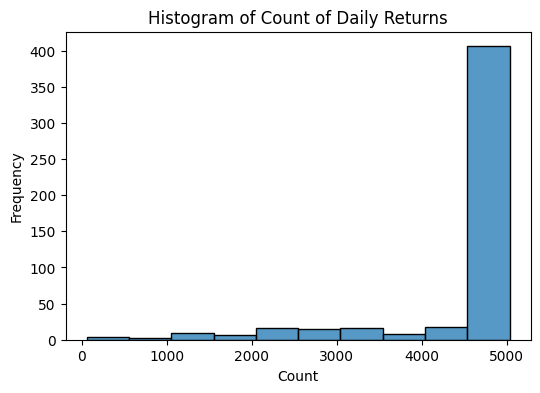

In [8]:
# A histogram showing how many companies have how many rows of data
# Most of the companies have over 4500 rows of data (in the rightmost bin), so we should have enough daily return data to work with
plt.figure(figsize=(6, 4))
sns.histplot(descriptive_data.loc['count'], bins=10, kde=False)
plt.title('Histogram of Count of Daily Returns')
plt.xlabel('Count')
plt.ylabel('Frequency')
plt.show()

In [9]:
# We can see that there are 2 companies with no data for this 20-year period (count for 0.0 is 2)
pd.set_option('display.max_rows', None)
descriptive_data.loc['count'].value_counts()

count
5032.0    385
2137.0      2
4165.0      2
2370.0      2
2651.0      2
952.0       2
1739.0      1
2332.0      1
4072.0      1
4651.0      1
4658.0      1
3409.0      1
4329.0      1
2202.0      1
3281.0      1
4306.0      1
60.0        1
4223.0      1
2314.0      1
3442.0      1
1820.0      1
2063.0      1
1885.0      1
3554.0      1
3949.0      1
4922.0      1
4194.0      1
3287.0      1
3047.0      1
4505.0      1
4642.0      1
3215.0      1
4547.0      1
4595.0      1
2192.0      1
2444.0      1
2334.0      1
2755.0      1
1429.0      1
4819.0      1
5009.0      1
1210.0      1
3494.0      1
2545.0      1
2645.0      1
1794.0      1
2263.0      1
2992.0      1
4627.0      1
4535.0      1
4186.0      1
4767.0      1
4901.0      1
2956.0      1
2925.0      1
4792.0      1
1801.0      1
3520.0      1
1508.0      1
489.0       1
767.0       1
4479.0      1
3372.0      1
1146.0      1
4512.0      1
3388.0      1
2746.0      1
2408.0      1
4559.0      1
4204.0      1
4159.0      1


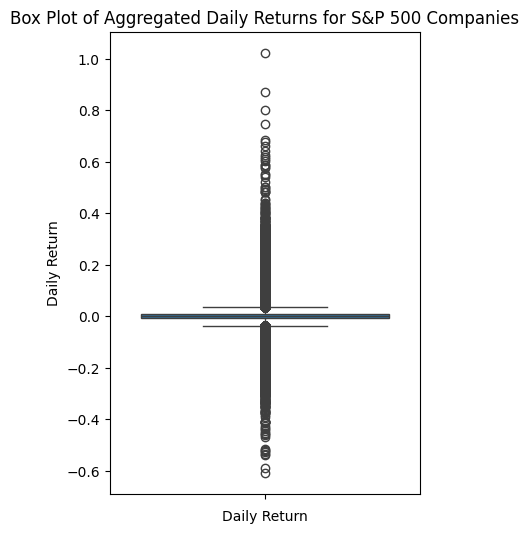

In [10]:
# How do these daily returns look like in a boxplot?
# It looks pretty normal (not skewed heavily to the left or right)

# aggregated_return: daily returns of all companies combined into one list
aggregated_return = daily_return_df.stack()

plt.figure(figsize=(4, 6))
sns.boxplot(aggregated_return)
plt.title('Box Plot of Aggregated Daily Returns for S&P 500 Companies')
plt.xlabel('Daily Return')
plt.ylabel('Daily Return')
plt.show()

In [11]:
# What are the minimum and maximum daily returns out of all this data? Out of curiosity..
summary_statistics = aggregated_return.describe()
summary_statistics

count    2.297260e+06
mean     6.887080e-04
std      2.199367e-02
min     -6.079079e-01
25%     -8.534404e-03
50%      6.373062e-04
75%      9.847063e-03
max      1.023578e+00
dtype: float64

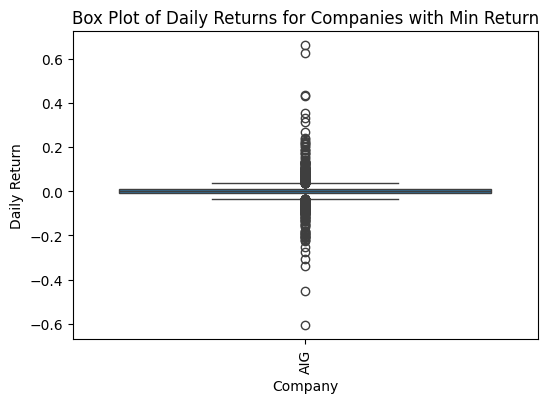

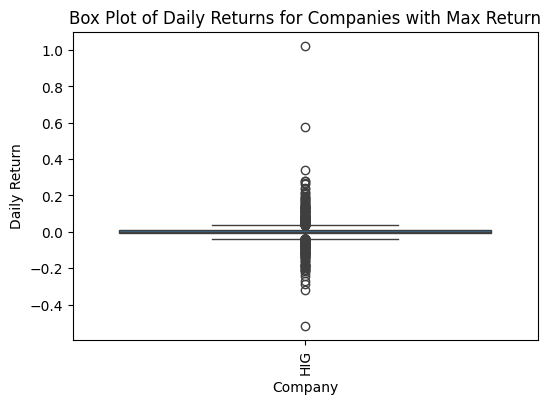

In [12]:
# What are the companies that achieve the minimum and maximum daily returns?
companies_min = daily_return_df.loc[:, (daily_return_df == summary_statistics['min']).any()].columns
companies_max = daily_return_df.loc[:, (daily_return_df == summary_statistics['max']).any()].columns

plt.figure(figsize=(6, 4))
sns.boxplot(daily_return_df[companies_min])
plt.title('Box Plot of Daily Returns for Companies with Min Return')
plt.xlabel('Company')
plt.ylabel('Daily Return')
plt.xticks(rotation=90)
plt.show()
plt.figure(figsize=(6, 4))
sns.boxplot(daily_return_df[companies_max])
plt.title('Box Plot of Daily Returns for Companies with Max Return')
plt.xlabel('Company')
plt.ylabel('Daily Return')
plt.xticks(rotation=90)
plt.show()

In [13]:
# When do these companies achieve the minimum and maximum values respectively?
print("For AIG, it achieves the minimum on: ", daily_return_df.index[daily_return_df['AIG'] == summary_statistics['min']])
print("For HIG, it achieves the maximum on: ", daily_return_df.index[daily_return_df['HIG'] == summary_statistics['max']])

For AIG, it achieves the minimum on:  DatetimeIndex(['2008-09-15 00:00:00-04:00'], dtype='datetime64[ns, America/New_York]', name='Date', freq=None)
For HIG, it achieves the maximum on:  DatetimeIndex(['2008-12-05 00:00:00-05:00'], dtype='datetime64[ns, America/New_York]', name='Date', freq=None)


<Figure size 2000x600 with 0 Axes>

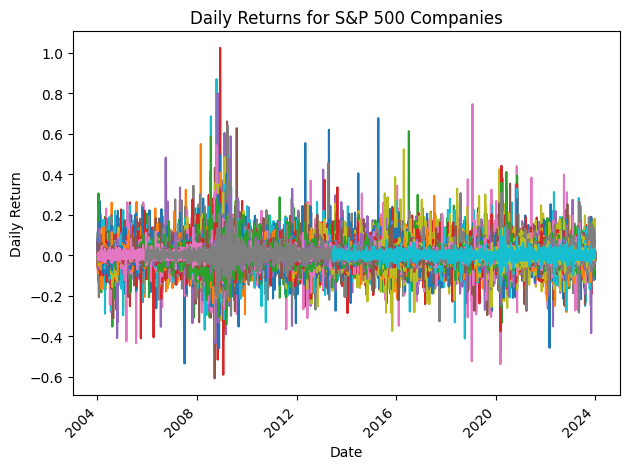

In [14]:
# The minimum and maximum values are achieved around the end of 2008
# These dates fall within the 2008 financial crisis
# In the line chart below, we can see that during the 2008 financial crisis, daily returns could go very high up and also very low, showing strong volatility
plt.figure(figsize=(20, 6))

daily_return_df.plot(legend=False)
plt.title('Daily Returns for S&P 500 Companies')
plt.xlabel('Date')
plt.ylabel('Daily Return')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

#**5. Clean the data and define the different periods**

In [15]:
# Remove companies that do not have complete data for this 20-year period
# Therefore, as long as a company is missing data for 1 day, it is removed
# Drop stocks (columns, hence axis = 1) with null values within this 10-year period
df = daily_return_df.dropna(axis=1)

# Double check if none of the companies left have missing data
# This should output 0 for all companies
df.isnull().sum()

MSFT     0
AAPL     0
NVDA     0
AMZN     0
BRK-B    0
LLY      0
JPM      0
XOM      0
UNH      0
PG       0
JNJ      0
COST     0
HD       0
MRK      0
WMT      0
BAC      0
NFLX     0
CVX      0
KO       0
ADBE     0
AMD      0
PEP      0
ORCL     0
LIN      0
QCOM     0
ACN      0
WFC      0
TMO      0
CSCO     0
MCD      0
TXN      0
INTU     0
AMGN     0
ABT      0
AMAT     0
VZ       0
DIS      0
GE       0
CAT      0
PFE      0
IBM      0
ISRG     0
DHR      0
CMCSA    0
GS       0
SPGI     0
NEE      0
UNP      0
HON      0
INTC     0
AXP      0
T        0
RTX      0
LOW      0
BKNG     0
COP      0
PGR      0
MS       0
VRTX     0
TJX      0
MU       0
ETN      0
C        0
LRCX     0
ELV      0
BLK      0
SYK      0
ADI      0
PLD      0
BSX      0
REGN     0
MMC      0
MDT      0
CB       0
UPS      0
BA       0
KLAC     0
LMT      0
ADP      0
AMT      0
DE       0
CI       0
SCHW     0
FI       0
GILD     0
SBUX     0
MDLZ     0
SO       0
NKE      0
BMY      0
SNPS     0

In [16]:
# See how many companies are left after dropping companies with null values
len(df.columns)

385

The first human cases of COVID-19 occurred in Wuhan, People's Republic of China, on or about 17 November 2019.[2] The first human case in the United States was on 21 January 2020. The World Health Organization declared the COVID-19 outbreak a Public Health Emergency of International Concern (PHEIC) on 30 January 2020, and first referred to it as a pandemic on 11 March 2020.[3][4] The WHO ended the PHEIC on 5 May 2023.[5]
https://en.wikipedia.org/wiki/Timeline_of_the_COVID-19_pandemic

In [17]:
# Define the different periods
pre_financial_crisis = df.loc['2004-01-01':'2006-12-31']
financial_crisis = df.loc['2007-01-01':'2009-06-30']
post_financial_crisis = df.loc['2009-07-01':'2019-12-31']
covid_period = df.loc['2020-01-01':'2022-12-31']
post_covid_period = df.loc['2023-01-01':]

# Store the periods in a list to iterate through
periods = [pre_financial_crisis, financial_crisis, post_financial_crisis, covid_period, post_covid_period]
period_names = ['pre_financial_crisis', 'financial_crisis', 'post_financial_crisis', 'covid_period', 'post_covid_period']

In [18]:
five_year_period_names = ['Period 1', 'Period 2', 'Period 3', 'Period 4', 'Period 5']
five_year_periods = [df.loc['2004-01-01':'2008-12-31'], df.loc['2009-01-01':'2013-12-31'], df.loc['2014-01-01':'2018-12-31'], df.loc['2019-01-01':'2023-12-31']]

#**6. Get GICS sector and industry**

In [19]:
tickers = df.columns.tolist()

# Function to get GICS sector and industry
def get_gics_data(ticker):
    try:
        stock = yf.Ticker(ticker)
        sector = stock.info.get('sector', 'Unknown')
        industry = stock.info.get('industry', 'Unknown')
        return sector, industry
    except Exception as e:
        print(f"Error fetching data for {ticker}: {e}")
        return 'Unknown', 'Unknown'

# Fetch GICS data for each ticker
gics_data = []
for ticker in tickers:
    sector, industry = get_gics_data(ticker)
    gics_data.append({'Company': ticker, 'GICS Sector': sector, 'GICS Industry': industry})

# Convert to DataFrame
gics_df = pd.DataFrame(gics_data)

# Display the GICS DataFrame
print(gics_df)

    Company             GICS Sector                             GICS Industry
0      MSFT              Technology                 Software - Infrastructure
1      AAPL              Technology                      Consumer Electronics
2      NVDA              Technology                            Semiconductors
3      AMZN       Consumer Cyclical                           Internet Retail
4     BRK-B      Financial Services                   Insurance - Diversified
5       LLY              Healthcare              Drug Manufacturers - General
6       JPM      Financial Services                       Banks - Diversified
7       XOM                  Energy                      Oil & Gas Integrated
8       UNH              Healthcare                          Healthcare Plans
9        PG      Consumer Defensive             Household & Personal Products
10      JNJ              Healthcare              Drug Manufacturers - General
11     COST      Consumer Defensive                           Di

In [20]:
# See how many companies fall into each GICS sector
gics_df['GICS Sector'].value_counts()

GICS Sector
Industrials               57
Healthcare                54
Technology                52
Financial Services        52
Consumer Cyclical         41
Consumer Defensive        31
Utilities                 28
Real Estate               26
Energy                    17
Basic Materials           17
Communication Services    10
Name: count, dtype: int64

In [21]:
gics_df[gics_df['GICS Sector'] == 'Unknown']

,Company,GICS Sector,GICS Industry


https://www.barchart.com/stocks/quotes/PHM/overview
https://www.barchart.com/stocks/quotes/GPN/overview

PHM: Consumer discretionary / consumer cyclical

GPN: Financials

In [22]:
gics_df.loc[gics_df['Company'] == 'PHM', 'GICS Sector'] = "Consumer Cyclical"
gics_df.loc[gics_df['Company'] == 'GPN', 'GICS Sector'] = "Financial Services"
gics_df['GICS Sector'].value_counts()

GICS Sector
Industrials               56
Healthcare                54
Financial Services        53
Technology                52
Consumer Cyclical         41
Consumer Defensive        31
Utilities                 28
Real Estate               26
Energy                    17
Basic Materials           17
Communication Services    10
Name: count, dtype: int64

#Note:
- We used to only have GEV and SOLV having no data at all for this 20-year period, but now there's a new one called SW. SW seems to be a very new company (?) according to Yahoo Finance
- Cleaned daily returns dataframe is **df**
- GICS dataframe is **gics_df**
- The different periods are defined in this way:
  - pre_financial_crisis: 2004-01-01 to 2006-12-31
  - financial_crisis: 2007-01-01 to 2009-06-30
  - post_financial_crisis: 2009-07-01 to 2019-12-31
  - covid_period: 2020-01-01 to 2022-12-31
  - post_covid_period: 2023-01-01 onwards
- The market data (S&P 500 data) is **sp500_return**





#**7. First approach: correlation matrix**

##**7.1 Get the correlation matrix**

In [23]:
# Create a correlation matrix based on the daily return data and considering data until 2022.
correlation_matrix = df.corr()
correlation_matrix

,MSFT,AAPL,NVDA,AMZN,BRK-B,LLY,JPM,XOM,UNH,PG,...,BWA,GL,HAS,DVA,IVZ,FMC,BEN,MHK,RL,BIO
MSFT,1.000000,0.515875,0.511252,0.513598,0.456937,0.397549,0.449748,0.413685,0.401533,0.443252,...,0.425435,0.443546,0.378758,0.277980,0.490187,0.448438,0.498522,0.390501,0.377421,0.400262
AAPL,0.515875,1.000000,0.457382,0.445228,0.366614,0.290833,0.395235,0.342901,0.342861,0.333419,...,0.380447,0.363540,0.337764,0.233430,0.430848,0.399301,0.429875,0.324032,0.335787,0.335534
NVDA,0.511252,0.457382,1.000000,0.415434,0.353807,0.263925,0.355184,0.318554,0.293262,0.270191,...,0.401878,0.355271,0.310992,0.234857,0.427253,0.383705,0.424247,0.353756,0.346381,0.327366
AMZN,0.513598,0.445228,0.415434,1.000000,0.331856,0.278473,0.347681,0.284270,0.288249,0.264903,...,0.348607,0.308103,0.313281,0.241217,0.393931,0.347219,0.414686,0.321843,0.334891,0.337587
BRK-B,0.456937,0.366614,0.353807,0.331856,1.000000,0.349591,0.595031,0.480735,0.403912,0.414461,...,0.466948,0.602610,0.376647,0.325926,0.566588,0.478225,0.564983,0.471732,0.426164,0.363027
LLY,0.397549,0.290833,0.263925,0.278473,0.349591,1.000000,0.350960,0.365667,0.406178,0.445079,...,0.270615,0.410188,0.247205,0.284546,0.371832,0.320416,0.394955,0.272965,0.272778,0.330183
JPM,0.449748,0.395235,0.355184,0.347681,0.595031,0.350960,1.000000,0.481011,0.395930,0.398159,...,0.514146,0.702855,0.398316,0.308919,0.676939,0.490698,0.677666,0.506334,0.493901,0.381235
XOM,0.413685,0.342901,0.318554,0.284270,0.480735,0.365667,0.481011,1.000000,0.386971,0.401539,...,0.448363,0.514018,0.355161,0.292360,0.518655,0.519236,0.527887,0.384066,0.405038,0.277691
UNH,0.401533,0.342861,0.293262,0.288249,0.403912,0.406178,0.395930,0.386971,1.000000,0.388406,...,0.345585,0.422064,0.282804,0.350190,0.402923,0.386874,0.412052,0.325199,0.314506,0.328291
PG,0.443252,0.333419,0.270191,0.264903,0.414461,0.445079,0.398159,0.401539,0.388406,1.000000,...,0.316551,0.449835,0.313981,0.295688,0.416588,0.356404,0.448645,0.301606,0.304401,0.329197


In [24]:
# None of the correlation coefficients are negative which is expected
# as all companies move with the market, which in general is always going up
correlation_matrix[correlation_matrix < 0].stack()

Series([], dtype: float64)

In [25]:
scaler = StandardScaler()
correlation_matrix_scaled = scaler.fit_transform(correlation_matrix)

###**7.1.1 Attempt to remove market trend (S&P 500 trend) from the daily return data**

In [26]:
# https://quant.stackexchange.com/questions/75445/detrending-price-series-for-back-testing
import statsmodels.api as sm

residuals = pd.DataFrame(index=df.index, columns=df.columns)

# Perform market model regression for each stock
for stock in df.columns:
    y = df[stock]
    X = sm.add_constant(sp500_return.reindex(y.index))
    model = sm.OLS(y, X).fit()
    residuals[stock] = model.resid

resid_correlation_matrix = residuals.corr()

kmeans = KMeans(n_clusters=3)
clusters = kmeans.fit_predict(resid_correlation_matrix)

print(np.unique(clusters, return_counts=True))


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(array([0, 1, 2], dtype=int32), array([ 59, 260,  66]))


##**7.2 K-means clustering**

###**7.2.1 Hyperparameter tuning**

In [27]:
import warnings
warnings.filterwarnings("ignore")

In [28]:
# *****Can take up to 8 minutes
param_grid_kmeans = {
    'n_clusters': range(2, 21),
    'n_init': ['auto', 10, 20, 30],
    'max_iter': [300, 400, 500],
    'init': ['k-means++', 'random'],
    'algorithm': ['lloyd', 'elkan'],
}

# In the variable name kmeans_first, I use 'first' to indicate 'first approach'
kmeans_first = KMeans(random_state=123)

# Initialize variables
best_kmeans_first_score = -2    # The lowest that silhouette score can be is -1
best_kmeans_first_grid = None
best_kmeans_first_labels = None

# To keep track of all combinations and their silhouette scores
kmeans_first_results = []

# Find the best hyperparameter combination
for g in ParameterGrid(param_grid_kmeans):
    kmeans_first.set_params(**g)
    kmeans_first.fit(correlation_matrix)
    kmeans_first_labels = kmeans_first.labels_
    # score = silhouette_score(correlation_matrix, kmeans_first_labels)
    score = silhouette_score(correlation_matrix, kmeans_first_labels)
    kmeans_first_results.append({'hyperparameters': g, 'silhouette_score': score, 'cluster_count': np.unique(kmeans_first_labels, return_counts=True)})

    if score > best_kmeans_first_score:
        best_kmeans_first_score = score
        best_kmeans_first_grid = g
        best_kmeans_first_labels = kmeans_first_labels

print("The best silhouette score is: ", best_kmeans_first_score)
print("The best hyperparameters are: ", best_kmeans_first_grid)
kmeans_first_results_df = pd.DataFrame(kmeans_first_results)

The best silhouette score is:  0.2777784835352857
The best hyperparameters are:  {'algorithm': 'lloyd', 'init': 'k-means++', 'max_iter': 300, 'n_clusters': 3, 'n_init': 10}


For the record: \

The best silhouette score is:  0.2777784895445786 \

The best hyperparameters are: {'algorithm': 'lloyd', 'init': 'k-means++', 'max_iter': 300, 'n_clusters': 3, 'n_init': 20}
************************************************************************

Update, after removing post covid data: \

The best silhouette score is:  0.27876475685204927

The best hyperparameters are:  {'algorithm': 'lloyd', 'init': 'k-means++', 'max_iter': 300, 'n_clusters': 3, 'n_init': 20}

In [29]:
kmeans_first_results_df.sort_values(by='silhouette_score', ascending=False)

,hyperparameters,silhouette_score,cluster_count
310,"{'algorithm': 'lloyd', 'init': 'random', 'max_...",0.277778,"([0, 1, 2], [204, 146, 35])"
614,"{'algorithm': 'elkan', 'init': 'k-means++', 'm...",0.277778,"([0, 1, 2], [204, 146, 35])"
690,"{'algorithm': 'elkan', 'init': 'random', 'max_...",0.277778,"([0, 1, 2], [204, 146, 35])"
689,"{'algorithm': 'elkan', 'init': 'random', 'max_...",0.277778,"([0, 1, 2], [204, 146, 35])"
688,"{'algorithm': 'elkan', 'init': 'random', 'max_...",0.277778,"([0, 1, 2], [204, 146, 35])"
386,"{'algorithm': 'lloyd', 'init': 'random', 'max_...",0.277778,"([0, 1, 2], [204, 146, 35])"
387,"{'algorithm': 'lloyd', 'init': 'random', 'max_...",0.277778,"([0, 1, 2], [204, 146, 35])"
235,"{'algorithm': 'lloyd', 'init': 'random', 'max_...",0.277778,"([0, 1, 2], [204, 146, 35])"
309,"{'algorithm': 'lloyd', 'init': 'random', 'max_...",0.277778,"([0, 1, 2], [204, 146, 35])"
615,"{'algorithm': 'elkan', 'init': 'k-means++', 'm...",0.277778,"([0, 1, 2], [204, 146, 35])"


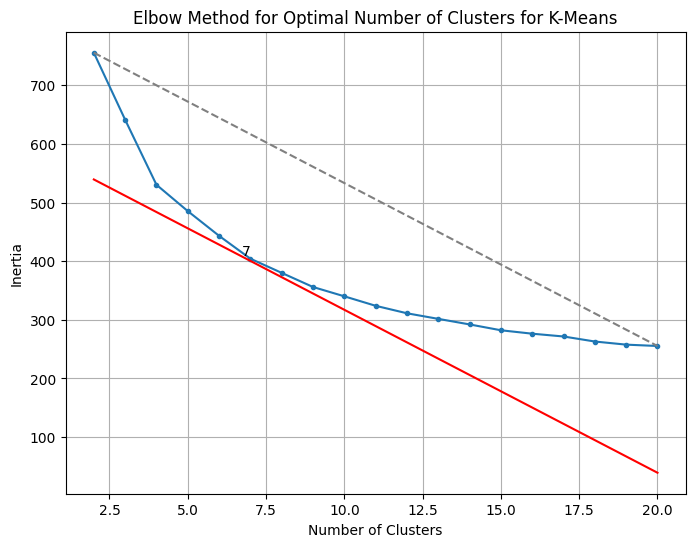

In [30]:
# For the sake of visualization, plot the elbow method graph
# with the best hyperparameter values
n_cluster_options = range(2, 21)

# inertia_: Sum of squared distances of samples to their closest cluster center
inertia_array = []
kmeans_results = {}

for n_cluster in n_cluster_options:
    kmeans = KMeans(n_clusters=n_cluster, random_state=123, algorithm='lloyd', init='k-means++', max_iter=300, n_init=20)
    kmeans.fit(correlation_matrix)
    kmeans_labels = kmeans.labels_
    kmeans_results[n_cluster] = kmeans_labels
    inertia_array.append(kmeans.inertia_)

start_point = (n_cluster_options[0], inertia_array[0])
end_point = (n_cluster_options[-1], inertia_array[-1])
slope = (end_point[1] - start_point[1]) / (end_point[0] - start_point[0])

x_values = np.linspace(2, 20)
y_values = slope * x_values + 595

# Plot elbow method (inertia)
plt.figure(figsize=(8, 6))
plt.plot(n_cluster_options, inertia_array, marker='.')
plt.plot([start_point[0], end_point[0]], [start_point[1], end_point[1]], linestyle='--', color='gray')
plt.plot(x_values, y_values, color='red')
plt.text(n_cluster_options[5], inertia_array[5], f'{n_cluster_options[5]}', ha='right', va='bottom')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal Number of Clusters for K-Means')
plt.grid(True)
plt.show()

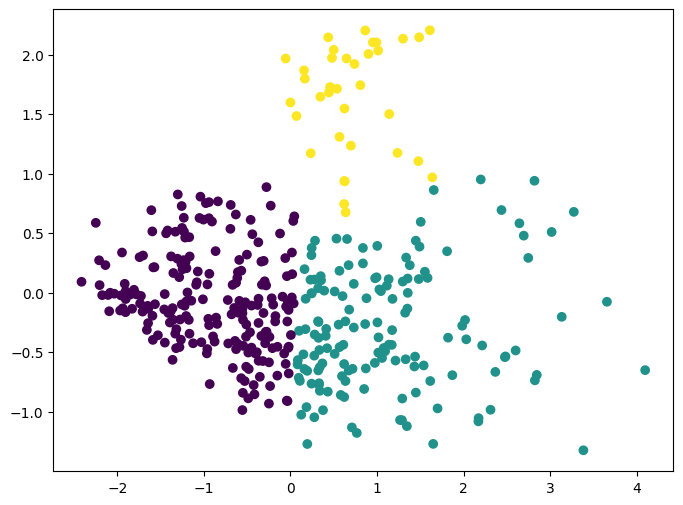

In [31]:
n_cluster = 3
pca = PCA(n_components=2)

pca_components = pca.fit_transform(correlation_matrix)

kmeans = KMeans(n_clusters=n_cluster, random_state=123, algorithm='lloyd', init='random', max_iter=300, n_init=20)
kmeans.fit(correlation_matrix)
kmeans_labels = kmeans.labels_

plt.figure(figsize=(8, 6))

# Create a colormap
unique_labels_length = len(np.unique(kmeans_labels))
cmap = ListedColormap(plt.cm.viridis(np.linspace(0, 1, unique_labels_length)))
colors = cmap(kmeans_labels)

plt.scatter(pca_components[:, 0], pca_components[:, 1], c=colors, cmap='viridis')

plt.show()

###**7.2.2 Count and percentage of industry sector in each cluster**

In [32]:
kmeans_first_sector_counts = pd.DataFrame({'Cluster': best_kmeans_first_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
kmeans_first_sector_percentages = kmeans_first_sector_counts.div(kmeans_first_sector_counts.sum(axis=1), axis=0) * 100

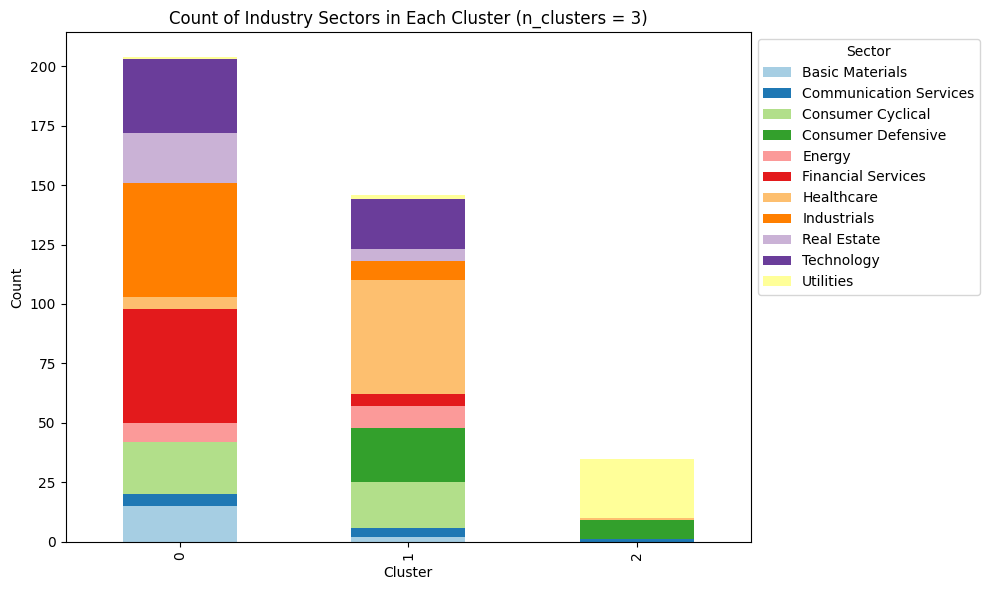

In [33]:
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))

# Stacked bar chart
ax = kmeans_first_sector_counts.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Count of Industry Sectors in Each Cluster (n_clusters = 3)')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

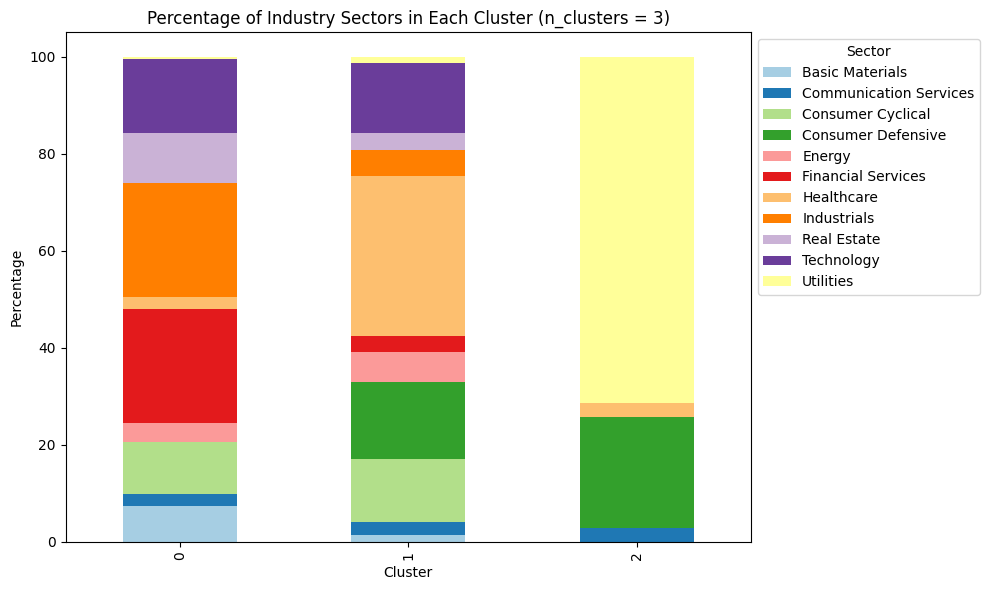

In [34]:
# Stacked bar chart
ax = kmeans_first_sector_percentages.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Percentage of Industry Sectors in Each Cluster (n_clusters = 3)')
plt.xlabel('Cluster')
plt.ylabel('Percentage')
plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

###**7.2.3 Count and percentage of cluster in each industry sector**

In [35]:
# Similar as before, but switch 0 and 1 in "axis="
kmeans_first_cluster_percentages = kmeans_first_sector_counts.div(kmeans_first_sector_counts.sum(axis=0), axis=1) * 100

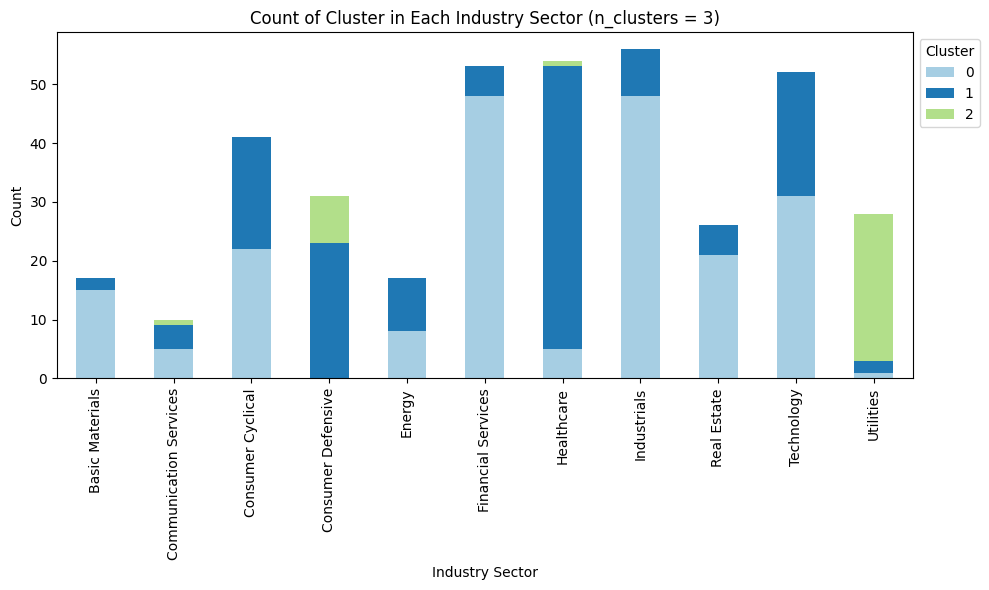

In [36]:
# Stacked bar charts
ax = kmeans_first_sector_counts.transpose().plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Count of Cluster in Each Industry Sector (n_clusters = {n_cluster})')
plt.xlabel('Industry Sector')
plt.ylabel('Count')
plt.legend(title='Cluster', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

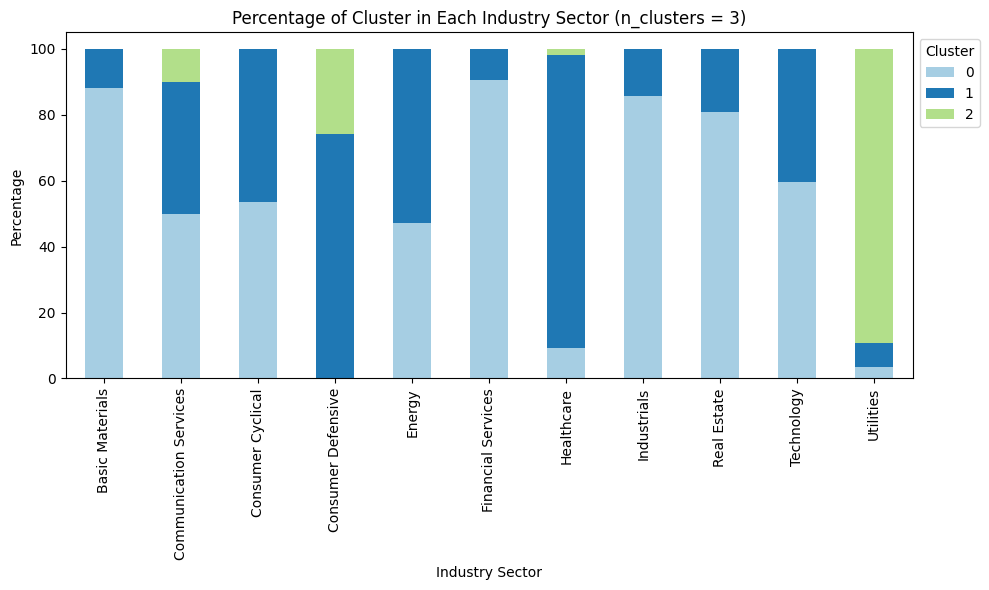

In [37]:
# Stacked bar charts
ax = kmeans_first_cluster_percentages.transpose().plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Percentage of Cluster in Each Industry Sector (n_clusters = {n_cluster})')
plt.xlabel('Industry Sector')
plt.ylabel('Percentage')
plt.legend(title='Cluster', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

###**7.2.4 Track Amazon**

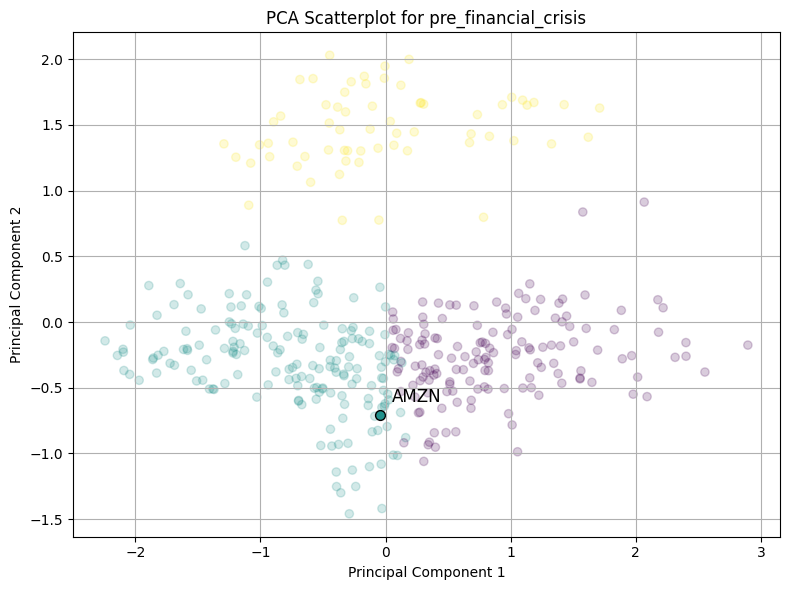

********** Period:  pre_financial_crisis **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Industrials               48
Financial Services        37
Technology                29
Consumer Cyclical         27
Basic Materials           14
Healthcare                 9
Communication Services     4
Consumer Defensive         4
Real Estate                2
Energy                     0
Utilities                  0
Name: 1, dtype: int64 

Industry Sector
Industrials               27.586207
Financial Services        21.264368
Technology                16.666667
Consumer Cyclical         15.517241
Basic Materials            8.045977
Healthcare                 5.172414
Communication Services     2.298851
Consumer Defensive         2.298851
Real Estate                1.149425
Energy                     0.000000
Utilities                  0.000000
Name: 1, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Se

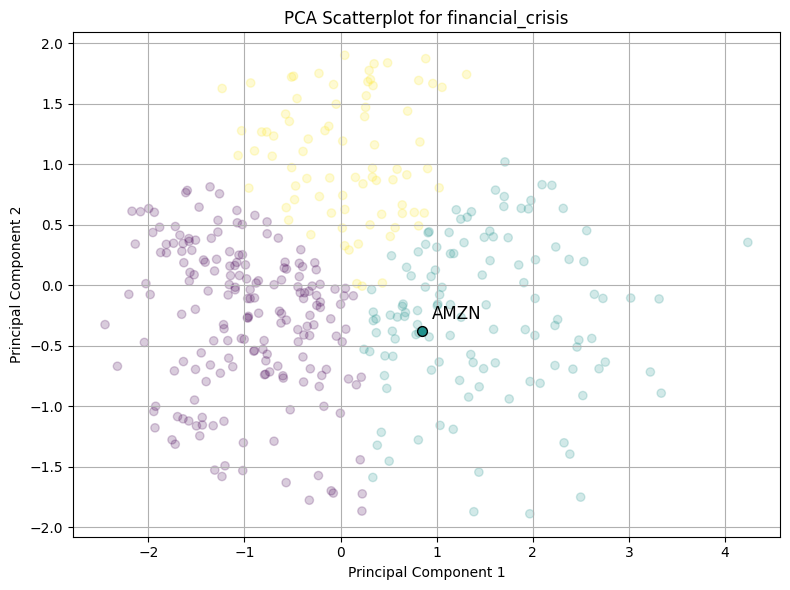

********** Period:  financial_crisis **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Healthcare                40
Consumer Defensive        20
Technology                18
Consumer Cyclical         15
Financial Services        13
Industrials                6
Communication Services     4
Basic Materials            3
Real Estate                2
Energy                     0
Utilities                  0
Name: 1, dtype: int64 

Industry Sector
Healthcare                33.057851
Consumer Defensive        16.528926
Technology                14.876033
Consumer Cyclical         12.396694
Financial Services        10.743802
Industrials                4.958678
Communication Services     3.305785
Basic Materials            2.479339
Real Estate                1.652893
Energy                     0.000000
Utilities                  0.000000
Name: 1, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Sector

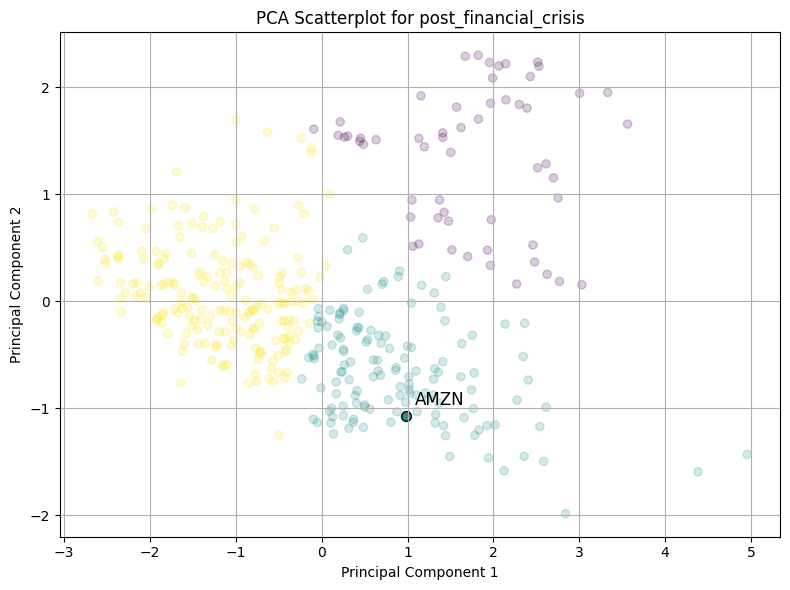

********** Period:  post_financial_crisis **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Healthcare                42
Consumer Cyclical         25
Technology                19
Consumer Defensive        14
Energy                    10
Industrials                6
Basic Materials            5
Communication Services     5
Financial Services         4
Real Estate                4
Utilities                  2
Name: 1, dtype: int64 

Industry Sector
Healthcare                30.882353
Consumer Cyclical         18.382353
Technology                13.970588
Consumer Defensive        10.294118
Energy                     7.352941
Industrials                4.411765
Basic Materials            3.676471
Communication Services     3.676471
Financial Services         2.941176
Real Estate                2.941176
Utilities                  1.470588
Name: 1, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry S

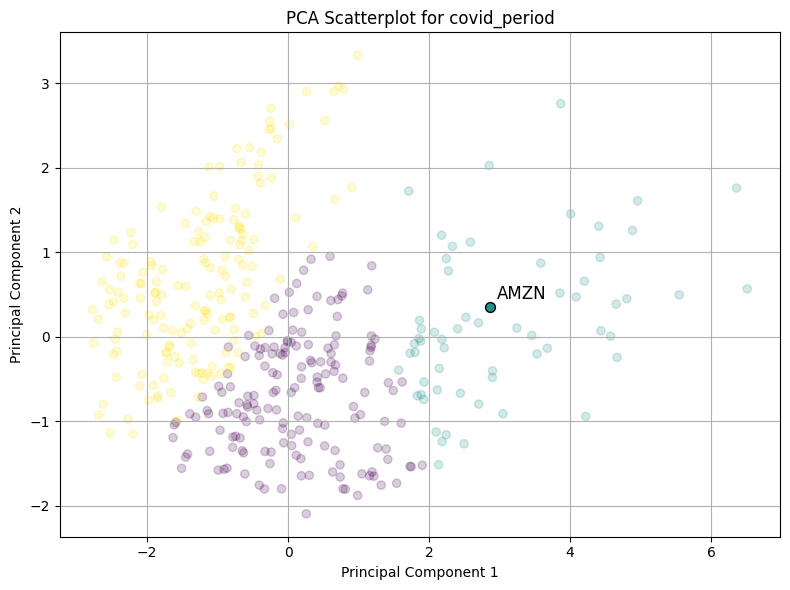

********** Period:  covid_period **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Healthcare                23
Consumer Defensive        15
Communication Services     5
Technology                 5
Consumer Cyclical          4
Industrials                4
Energy                     2
Utilities                  2
Basic Materials            1
Financial Services         0
Real Estate                0
Name: 1, dtype: int64 

Industry Sector
Healthcare                37.704918
Consumer Defensive        24.590164
Communication Services     8.196721
Technology                 8.196721
Consumer Cyclical          6.557377
Industrials                6.557377
Energy                     3.278689
Utilities                  3.278689
Basic Materials            1.639344
Financial Services         0.000000
Real Estate                0.000000
Name: 1, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Sector  Ba

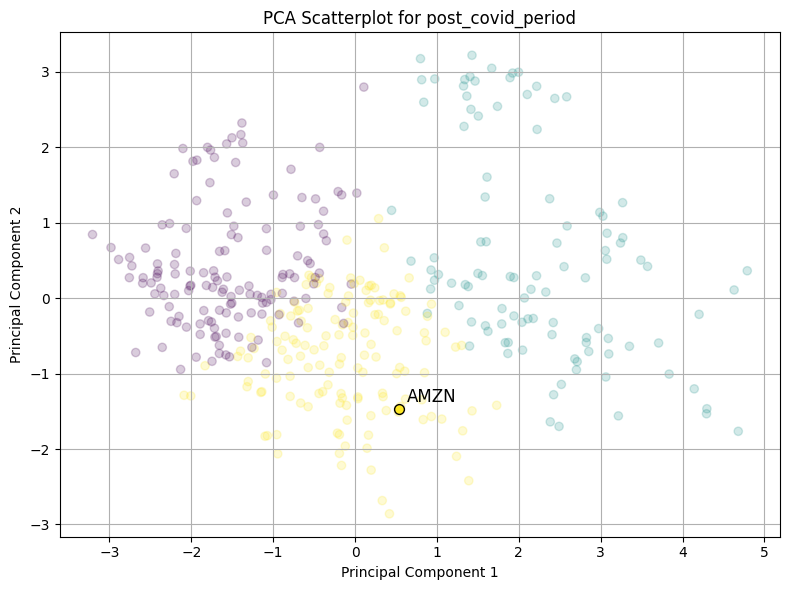

********** Period:  post_covid_period **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Technology                42
Healthcare                25
Consumer Cyclical         22
Energy                    15
Industrials               13
Communication Services     8
Basic Materials            7
Consumer Defensive         7
Financial Services         3
Real Estate                1
Utilities                  1
Name: 2, dtype: int64 

Industry Sector
Technology                29.166667
Healthcare                17.361111
Consumer Cyclical         15.277778
Energy                    10.416667
Industrials                9.027778
Communication Services     5.555556
Basic Materials            4.861111
Consumer Defensive         4.861111
Financial Services         2.083333
Real Estate                0.694444
Utilities                  0.694444
Name: 2, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Secto

In [38]:
n_cluster = 3
pca = PCA(n_components=2)

# Iterate over each period data
for index, period_data in enumerate(periods):
    # Get the correlation matrix specifically for this period
    period_correlation_matrix = period_data.corr()
    pca_components = pca.fit_transform(period_correlation_matrix)

    # Use the best hyperparameters
    kmeans = KMeans(n_clusters=n_cluster, random_state=123, algorithm='lloyd', init='k-means++', max_iter=300, n_init=20)
    kmeans.fit(period_correlation_matrix)
    kmeans_labels = kmeans.labels_

    plt.figure(figsize=(8, 6))

    # Create a colormap from the k-means labels
    unique_labels_length = len(np.unique(kmeans_labels))
    cmap = ListedColormap(plt.cm.viridis(np.linspace(0, 1, unique_labels_length)))
    colors = cmap(kmeans_labels)

    plt.scatter(pca_components[:, 0], pca_components[:, 1], c=colors, cmap='viridis', alpha=0.2)

    # Highlight 'AMZN'
    amzn_index = period_correlation_matrix.index.get_loc('AMZN')
    plt.scatter(pca_components[amzn_index, 0], pca_components[amzn_index, 1], color=colors[amzn_index], marker='o', s=50, edgecolors='black', alpha=1.0)
    plt.annotate('AMZN', xy=(pca_components[amzn_index, 0], pca_components[amzn_index, 1]), xytext=(pca_components[amzn_index, 0] + 0.1, pca_components[amzn_index, 1] + 0.1), fontsize=12, color='black')

    plt.title(f'PCA Scatterplot for {period_names[index]}')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    amazons_cluster = kmeans_labels[amzn_index]

    print("********** Period: ", period_names[index], "**********")
    sector_counts_amzn = pd.DataFrame({'Cluster': kmeans_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
    sector_percentages_amzn = sector_counts_amzn.div(sector_counts_amzn.sum(axis=1), axis=0) * 100
    print("\n1. Count and percentage of industry sector in the cluster that Amazon is in: ")
    #count
    print(sector_counts_amzn.loc[amazons_cluster].sort_values(ascending=False), "\n")
    #order by percentage in descending order
    print(sector_percentages_amzn.loc[amazons_cluster].sort_values(ascending=False))

    print("\n2. Count and percentage of industry sector in all clusters: \n")
    #count
    print(sector_counts_amzn)
    print(sector_percentages_amzn)
    print("\n")

    # cluster_percentages_amzn = sector_counts_amzn.div(sector_counts_amzn.sum(axis=0), axis=1) * 100
    # print("\n3. Count and percentage of cluster in each sector: \n")
    # #count
    # print(sector_counts_amzn)
    # print(cluster_percentages_amzn)
    # print("\n")

##**7.3 Hierarchical clustering**

###**7.3.1 Hyperparameter tuning**

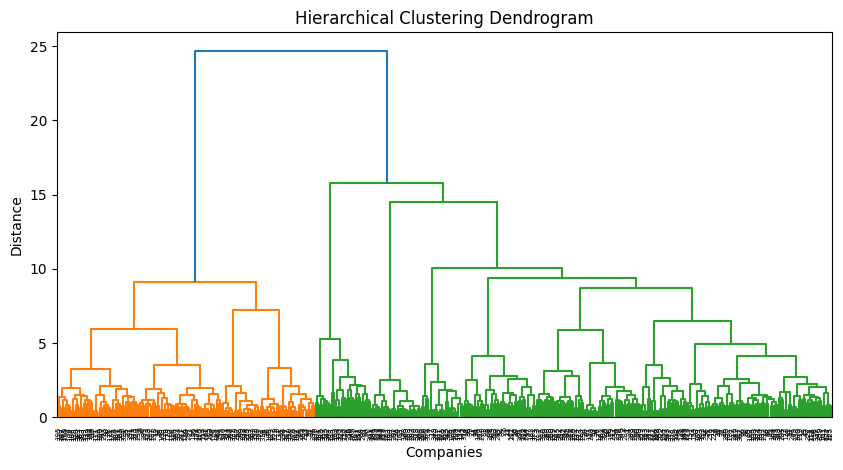

In [39]:
# Plot a dendogram to get an idea of the distance
link = linkage(correlation_matrix, method='ward', metric='euclidean')  #AgglomerativeClustering from scikitlearn uses linkage=ward by default, so use ward here as well

# Plot dendrogram
plt.figure(figsize=(10, 5))
dendrogram(link)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Companies')
plt.ylabel('Distance')
plt.show()

In [40]:
# *****
param_grid_hierarchical = {
    'n_clusters': range(2, 21),
    #'linkage': ['ward', 'complete', 'average', 'single'],
    'linkage': ['ward'],
    #'metric': ['euclidean', 'l1', 'l2', 'manhattan', 'cosine', 'precomputed']
    'metric': ['euclidean'],
    #'distance_threshold': [5, 10, 2]
}

#cleaned_correlation_matrix = df.drop(columns=['NEM']).corr()

# In the variable name kmeans_first, I use 'first' to indicate 'first approach'
hierarchical_first = AgglomerativeClustering(n_clusters=None)

# Initialize variables
best_hierarchical_first_score = -2    # The lowest that silhouette score can be is -1
#best_hierarchical_first_score = float('inf')
best_hierarchical_first_grid = None
best_hierarchical_first_labels = None
hierarchical_first_results = []

# Find the best hyperparameter combination
for g in ParameterGrid(param_grid_hierarchical):
    # Skip invalid combinations
    # ward can only work with euclidean, otherwise it will throw an error
    if g['linkage'] == 'ward' and g['metric'] != 'euclidean':
        continue

    hierarchical_first.set_params(**g)
    hierarchical_first.fit(correlation_matrix)
    hierarchical_first_labels = hierarchical_first.labels_
    score = silhouette_score(correlation_matrix, hierarchical_first_labels)
    #score = davies_bouldin_score(correlation_matrix, hierarchical_first_labels)
    hierarchical_first_results.append({'hyperparameters': g, 'silhouette_score': score, 'cluster_count': np.unique(hierarchical_first_labels, return_counts=True)})

    if score > best_hierarchical_first_score:
    #if score < best_hierarchical_first_score:
        best_hierarchical_first_score = score
        best_hierarchical_first_grid = g
        best_hierarchical_first_labels = hierarchical_first_labels

print("The best silhouette score is: ", best_hierarchical_first_score)
print("The best hyperparameters are: ", best_hierarchical_first_grid)
hierarchical_first_results_df = pd.DataFrame(hierarchical_first_results)

The best silhouette score is:  0.23401303749642574
The best hyperparameters are:  {'linkage': 'ward', 'metric': 'euclidean', 'n_clusters': 5}


For the record: \

The best silhouette score is:  0.2340130512792354 \

The best hyperparameters are:  {'linkage': 'ward', 'metric': 'euclidean', 'n_clusters': 5}
*******************************************************
After removing post covid:-

The best silhouette score is:  0.23539538077709363

The best hyperparameters are:  {'linkage': 'ward', 'metric': 'euclidean', 'n_clusters': 4}

In [41]:
hierarchical_first_results_df.sort_values(by='silhouette_score', ascending=False)

,hyperparameters,silhouette_score,cluster_count
3,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.234013,"([0, 1, 2, 3, 4], [183, 128, 28, 25, 21])"
2,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.219689,"([0, 1, 2, 3], [204, 128, 28, 25])"
0,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.218002,"([0, 1], [257, 128])"
8,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.205757,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], [82, 52, 28, ..."
4,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.205199,"([0, 1, 2, 3, 4, 5], [128, 147, 28, 25, 21, 36])"
18,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.202048,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
12,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.200182,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
15,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.199241,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
17,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.198406,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
9,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.198174,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10], [52, 21, ..."


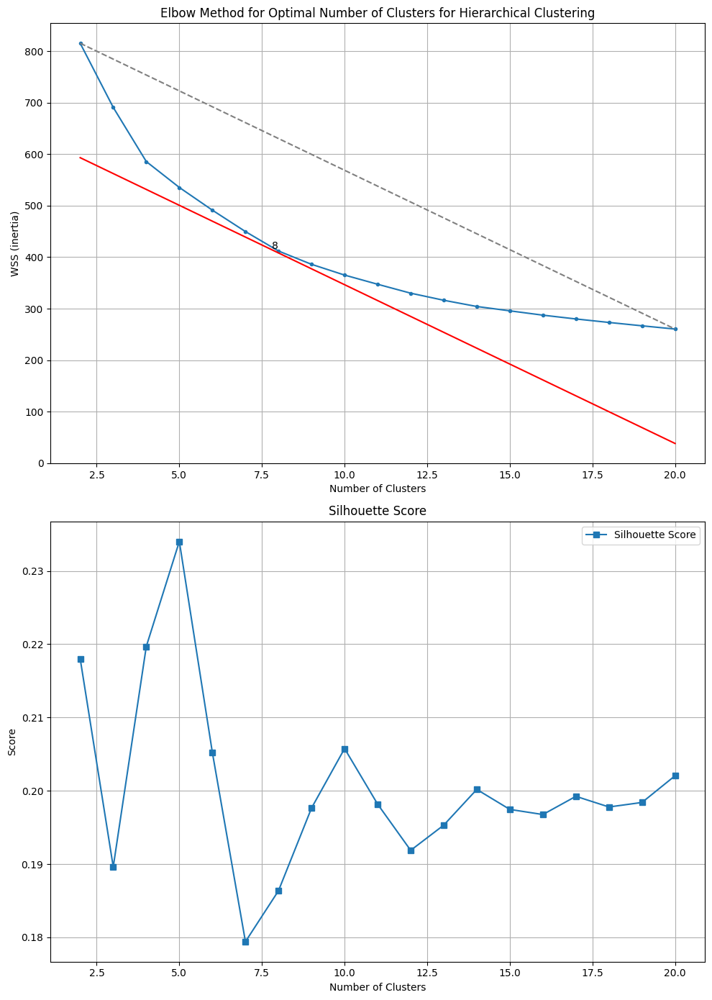

In [42]:
def wss_calculation(K, data):
    WSS = []
    for i in range(1, K):
        cluster = AgglomerativeClustering(n_clusters=i + 1)
        labels = cluster.fit_predict(data)
        wss = []
        for j in range(i + 1):
            # extract each cluster according to its index
            cluster_data = data[labels == j]
            cluster_mean = cluster_data.mean(axis=0)
            distance = np.sum(np.square(cluster_data - cluster_mean))
            wss.append(sum(distance))
        WSS.append(sum(wss))
    return WSS

WSS = wss_calculation(20, correlation_matrix)

# Test out different values of n_clusters using the elbow method
# Try the numbers between 2 to 20
n_cluster_options = range(2, 21)

silhouette_scores_hierarchical = []
hierarchical_results = {}

for n_cluster in n_cluster_options:
    hierarchical = AgglomerativeClustering(n_clusters=n_cluster, linkage='ward', metric='euclidean')
    hierarchical.fit(correlation_matrix)
    hierarchical_labels = hierarchical.labels_
    hierarchical_results[n_cluster] = hierarchical_labels

    # Record the metrics
    silhouette_scores_hierarchical.append(silhouette_score(correlation_matrix, hierarchical_labels))

start_point = (n_cluster_options[0], WSS[0])
end_point = (n_cluster_options[-1], WSS[-1])
slope = (end_point[1] - start_point[1]) / (end_point[0] - start_point[0])

x_values = np.linspace(2, 20)
y_values = slope * x_values + 655

# Plot elbow method (inertia)
# plt.figure(figsize=(8, 6))
# plt.plot(n_cluster_options, WSS, marker='.')
# plt.plot([start_point[0], end_point[0]], [start_point[1], end_point[1]], linestyle='--', color='gray')
# plt.plot(x_values, y_values, color='red')
# plt.text(n_cluster_options[6], inertia_array[6], f'{n_cluster_options[6]}', ha='right', va='bottom')
# plt.xlabel('Number of Clusters')
# plt.ylabel('WSS (inertia)')
# plt.title('Elbow Method for Optimal Number of Clusters for Hierarchical Clustering')
# plt.grid(True)
# plt.show()

#plot subplots
fig, ax = plt.subplots(2, 1, figsize=(10, 14))

# Plot elbow method (inertia)
ax[0].plot(n_cluster_options, WSS, marker='.')
ax[0].plot([start_point[0], end_point[0]], [start_point[1], end_point[1]], linestyle='--', color='gray')
ax[0].plot(x_values, y_values, color='red')
ax[0].text(n_cluster_options[6], WSS[6], f'{n_cluster_options[6]}', ha='right', va='bottom')
ax[0].set_xlabel('Number of Clusters')
ax[0].set_ylabel('WSS (inertia)')
ax[0].set_title('Elbow Method for Optimal Number of Clusters for Hierarchical Clustering')
ax[0].grid(True)

# Plot the silhoutte score and davies-bouldin index
ax[1].plot(n_cluster_options, silhouette_scores_hierarchical, marker='s', label='Silhouette Score')
ax[1].set_xlabel('Number of Clusters')
ax[1].set_ylabel('Score')
ax[1].set_title('Silhouette Score')
ax[1].legend()
ax[1].grid(True)

plt.tight_layout()
plt.show()

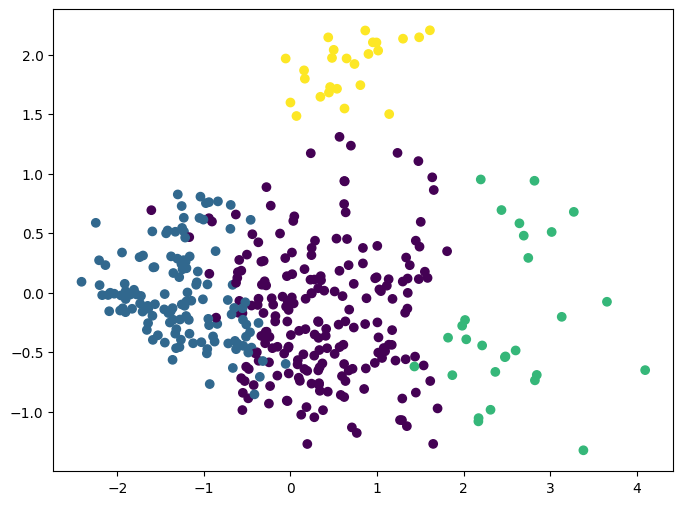

In [43]:
n_cluster = 4
pca = PCA(n_components=2)

pca_components = pca.fit_transform(correlation_matrix)

hierarchical = AgglomerativeClustering(n_clusters=n_cluster, linkage='ward', metric='euclidean')
hierarchical.fit(correlation_matrix)
hierarchical_labels = hierarchical.labels_

plt.figure(figsize=(8, 6))

# Create a colormap
unique_labels_length = len(np.unique(hierarchical_labels))
cmap = ListedColormap(plt.cm.viridis(np.linspace(0, 1, unique_labels_length)))
colors = cmap(hierarchical_labels)

plt.scatter(pca_components[:, 0], pca_components[:, 1], c=colors, cmap='viridis')

plt.show()

####**7.3.1.1 Playground to test different linkage methods**

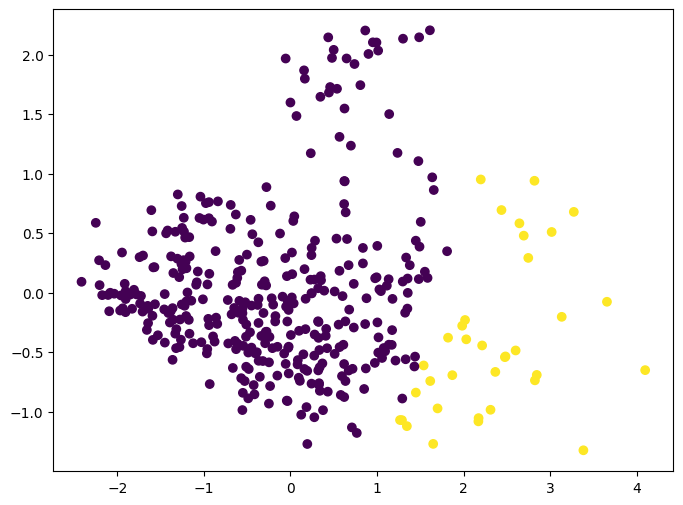

(array([ 16,  20,  58,  70,  84, 133, 135, 153, 180, 186, 187, 191, 194,
       197, 201, 236, 240, 250, 251, 256, 268, 289, 300, 301, 315, 319,
       320, 325, 342, 358, 361, 365, 368, 369, 378]),)


In [44]:
n_cluster = 2
pca = PCA(n_components=2)

test_corr = df.drop(columns=['NEM']).corr()

pca_components = pca.fit_transform(correlation_matrix)

hierarchical2 = AgglomerativeClustering(n_clusters=n_cluster, linkage='complete', metric='euclidean')
hierarchical2.fit(correlation_matrix)
hierarchical_labels2 = hierarchical2.labels_

plt.figure(figsize=(8, 6))

# Create a colormap
unique_labels_length = len(np.unique(hierarchical_labels2))
cmap = ListedColormap(plt.cm.viridis(np.linspace(0, 1, unique_labels_length)))
colors = cmap(hierarchical_labels2)

plt.scatter(pca_components[:, 0], pca_components[:, 1], c=colors, cmap='viridis')

plt.show()

print(np.where(hierarchical_labels2 == 1))

In [45]:
correlation_matrix.columns[130]

'PCAR'

In [46]:
np.unique(hierarchical_labels2, return_counts=True)

(array([0, 1]), array([350,  35]))

###**7.3.2 Count and percentage of industry sector in each cluster**

In [47]:
hierarchical_first_sector_counts = pd.DataFrame({'Cluster': best_hierarchical_first_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
hierarchical_first_sector_percentages = hierarchical_first_sector_counts.div(hierarchical_first_sector_counts.sum(axis=1), axis=0) * 100

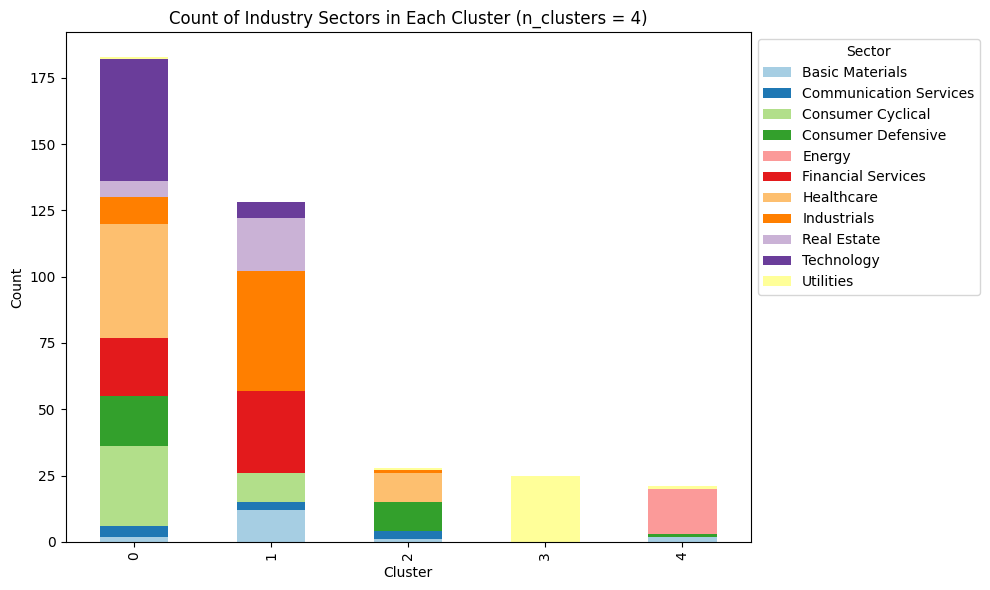

In [48]:
# Stacked bar chart
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))
ax = hierarchical_first_sector_counts.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Count of Industry Sectors in Each Cluster (n_clusters = 4)')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

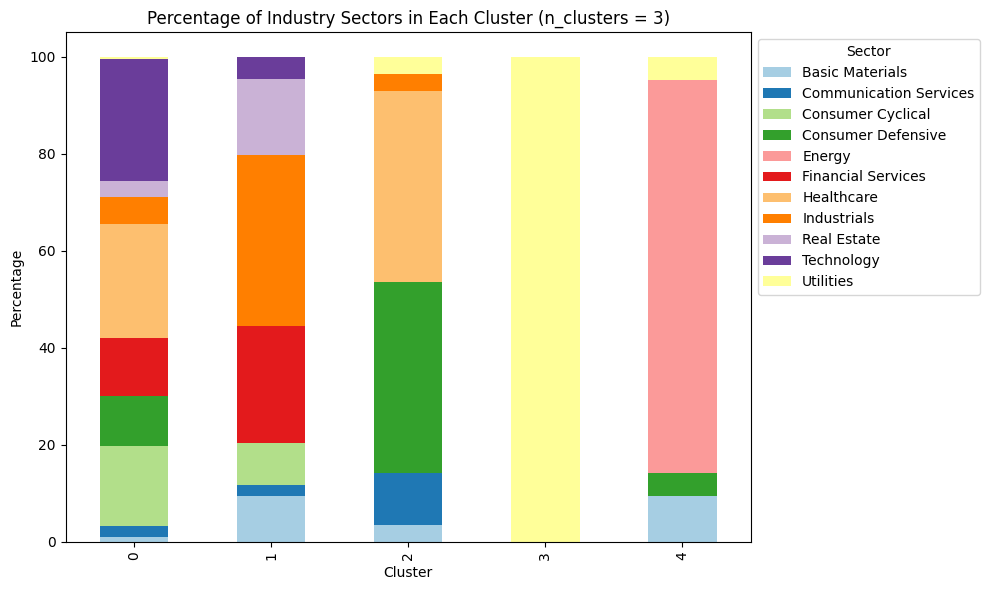

In [49]:
# Stacked bar chart
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))
ax = hierarchical_first_sector_percentages.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Percentage of Industry Sectors in Each Cluster (n_clusters = 3)')
plt.xlabel('Cluster')
plt.ylabel('Percentage')
plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

###**7.3.3 Count and percentage of cluster in each industry sector**

In [50]:
# Similar as before, but switch 0 and 1 in "axis="
hierarchical_first_cluster_percentages = hierarchical_first_sector_counts.div(hierarchical_first_sector_counts.sum(axis=0), axis=1) * 100

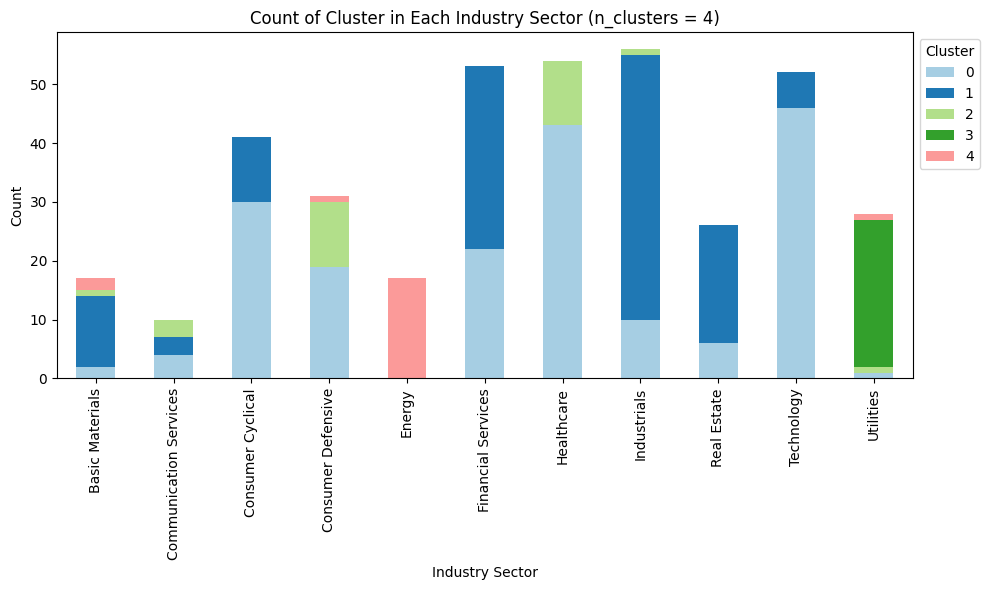

In [51]:
# Stacked bar charts
ax = hierarchical_first_sector_counts.transpose().plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Count of Cluster in Each Industry Sector (n_clusters = 4)')
plt.xlabel('Industry Sector')
plt.ylabel('Count')
plt.legend(title='Cluster', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

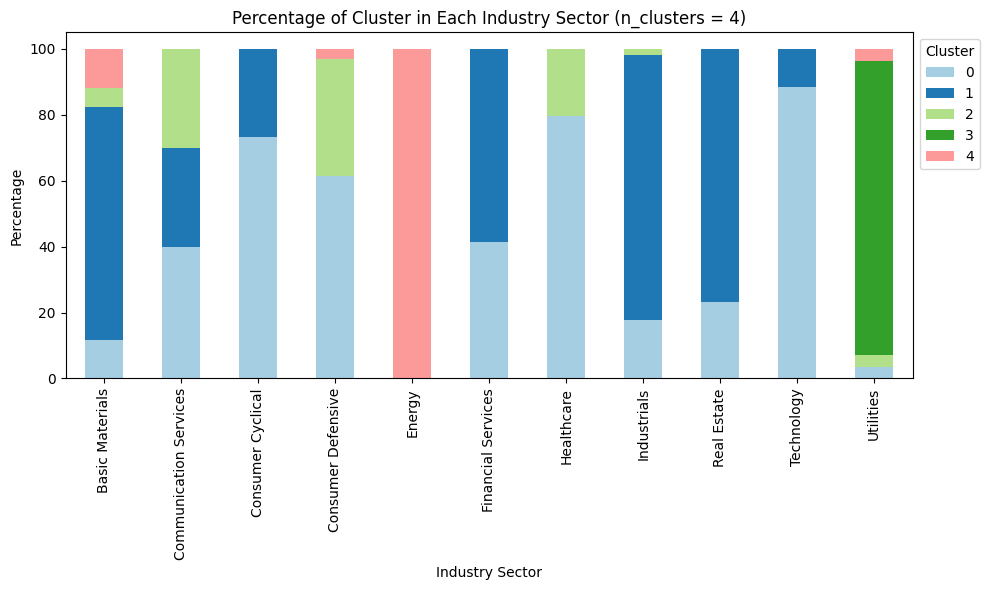

In [52]:
# Stacked bar charts
ax = hierarchical_first_cluster_percentages.transpose().plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Percentage of Cluster in Each Industry Sector (n_clusters = 4)')
plt.xlabel('Industry Sector')
plt.ylabel('Percentage')
plt.legend(title='Cluster', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

###**7.3.4 Track Amazon**

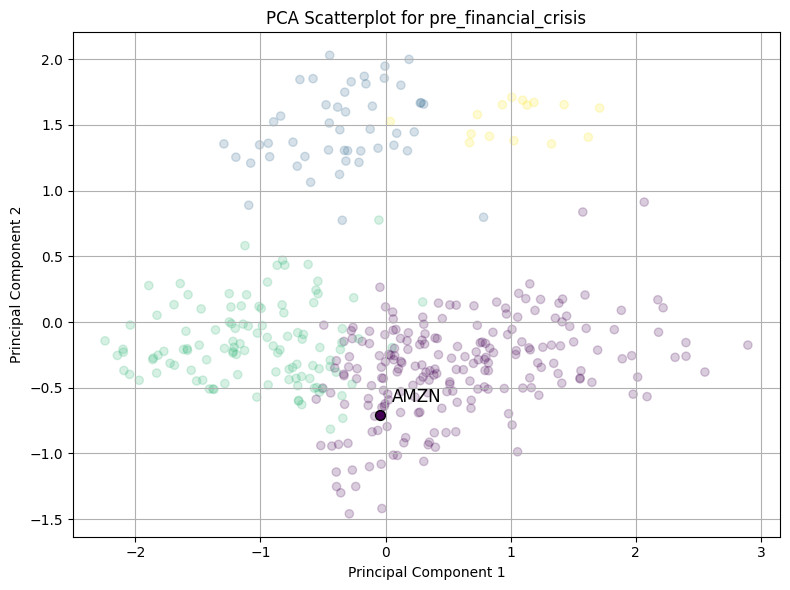

********** Period:  pre_financial_crisis **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Healthcare                51
Technology                46
Consumer Defensive        31
Consumer Cyclical         25
Industrials               19
Financial Services        16
Communication Services    10
Real Estate                6
Basic Materials            4
Utilities                  1
Energy                     0
Name: 0, dtype: int64 

Industry Sector
Healthcare                24.401914
Technology                22.009569
Consumer Defensive        14.832536
Consumer Cyclical         11.961722
Industrials                9.090909
Financial Services         7.655502
Communication Services     4.784689
Real Estate                2.870813
Basic Materials            1.913876
Utilities                  0.478469
Energy                     0.000000
Name: 0, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Se

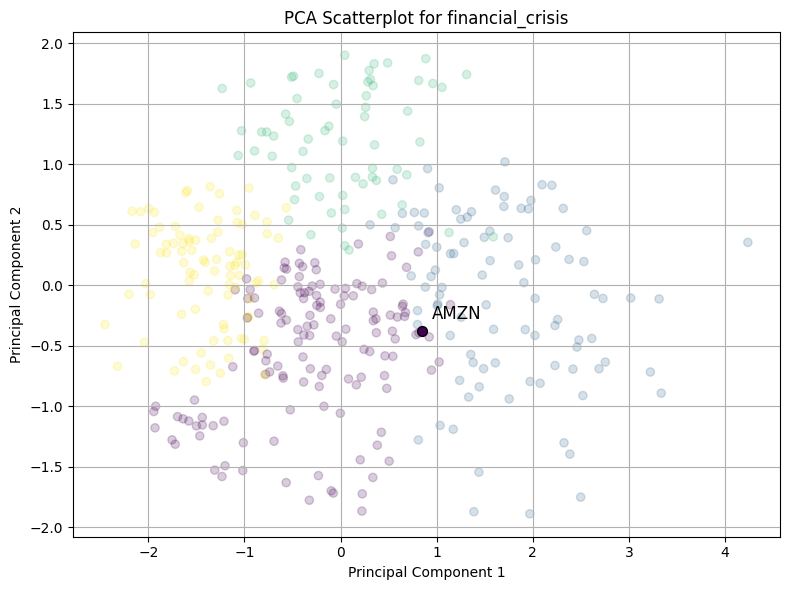

********** Period:  financial_crisis **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Technology                36
Financial Services        31
Real Estate               22
Consumer Cyclical         18
Industrials               17
Basic Materials            5
Consumer Defensive         4
Healthcare                 3
Communication Services     2
Energy                     0
Utilities                  0
Name: 0, dtype: int64 

Industry Sector
Technology                26.086957
Financial Services        22.463768
Real Estate               15.942029
Consumer Cyclical         13.043478
Industrials               12.318841
Basic Materials            3.623188
Consumer Defensive         2.898551
Healthcare                 2.173913
Communication Services     1.449275
Energy                     0.000000
Utilities                  0.000000
Name: 0, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Sector

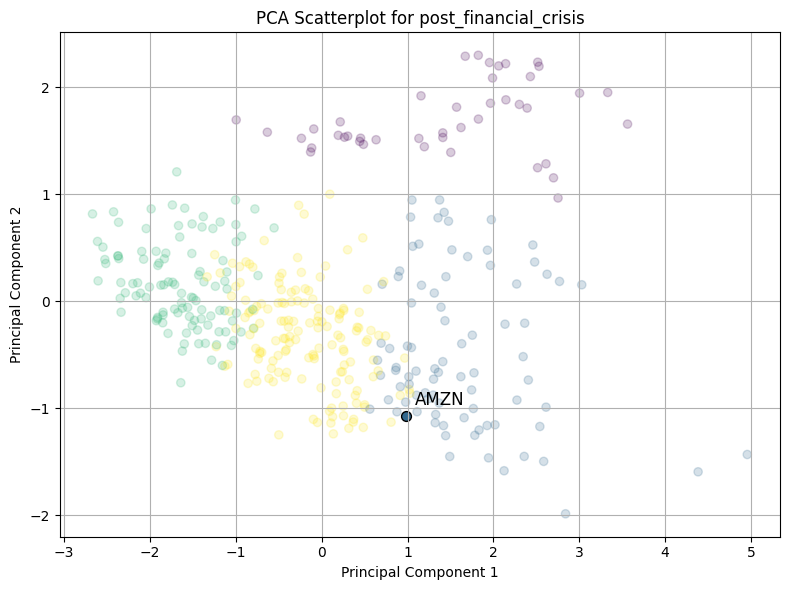

********** Period:  post_financial_crisis **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Consumer Defensive        28
Healthcare                27
Consumer Cyclical         10
Communication Services     6
Real Estate                5
Technology                 4
Utilities                  2
Basic Materials            1
Financial Services         1
Industrials                1
Energy                     0
Name: 1, dtype: int64 

Industry Sector
Consumer Defensive        32.941176
Healthcare                31.764706
Consumer Cyclical         11.764706
Communication Services     7.058824
Real Estate                5.882353
Technology                 4.705882
Utilities                  2.352941
Basic Materials            1.176471
Financial Services         1.176471
Industrials                1.176471
Energy                     0.000000
Name: 1, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry S

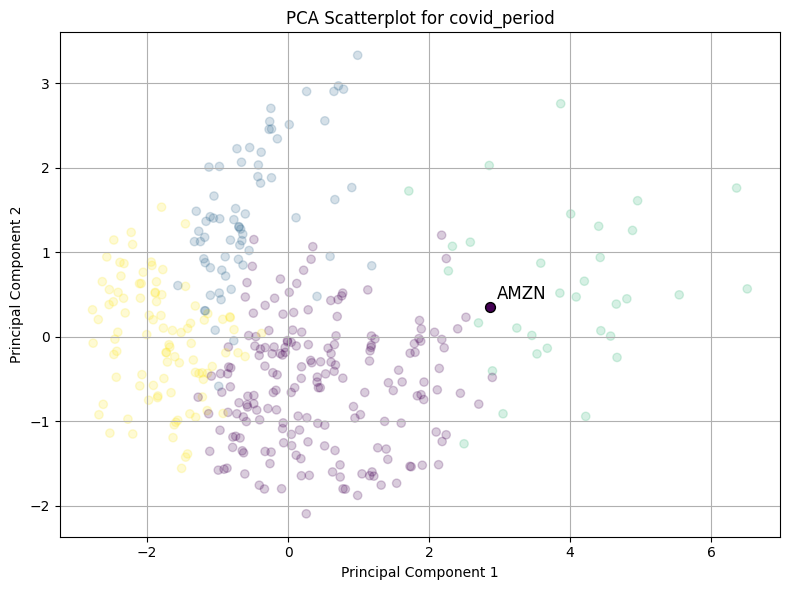

********** Period:  covid_period **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Technology                41
Healthcare                39
Utilities                 25
Consumer Cyclical         18
Industrials               18
Real Estate               16
Consumer Defensive        14
Financial Services        11
Communication Services     4
Basic Materials            3
Energy                     0
Name: 0, dtype: int64 

Industry Sector
Technology                21.693122
Healthcare                20.634921
Utilities                 13.227513
Consumer Cyclical          9.523810
Industrials                9.523810
Real Estate                8.465608
Consumer Defensive         7.407407
Financial Services         5.820106
Communication Services     2.116402
Basic Materials            1.587302
Energy                     0.000000
Name: 0, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Sector  Ba

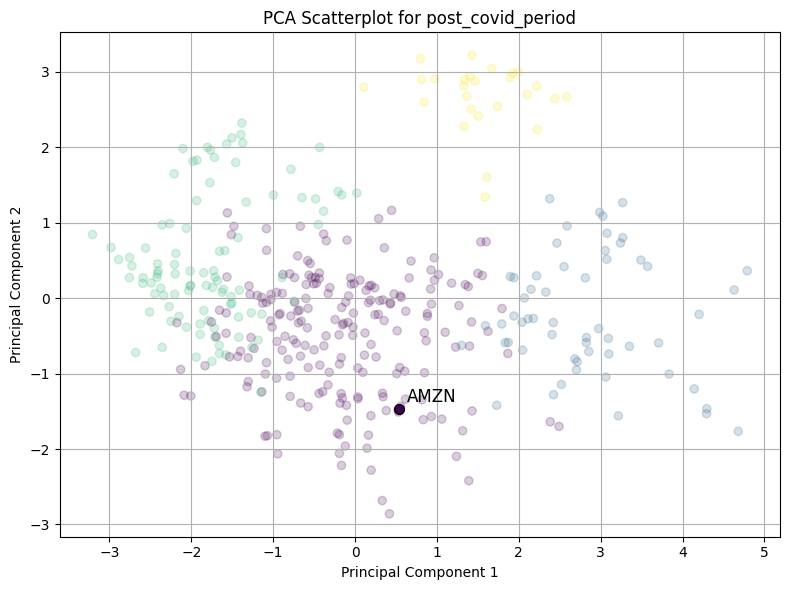

********** Period:  post_covid_period **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Technology                49
Consumer Cyclical         33
Healthcare                27
Industrials               26
Financial Services        22
Energy                    17
Consumer Defensive        12
Basic Materials           10
Communication Services     8
Real Estate                1
Utilities                  1
Name: 0, dtype: int64 

Industry Sector
Technology                23.786408
Consumer Cyclical         16.019417
Healthcare                13.106796
Industrials               12.621359
Financial Services        10.679612
Energy                     8.252427
Consumer Defensive         5.825243
Basic Materials            4.854369
Communication Services     3.883495
Real Estate                0.485437
Utilities                  0.485437
Name: 0, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Secto

In [53]:
n_cluster = 4
pca = PCA(n_components=2)

# Iterate over each period data
for index, period_data in enumerate(periods):
    # Get the correlation matrix specifically for this period
    period_correlation_matrix = period_data.corr()
    pca_components = pca.fit_transform(period_correlation_matrix)

    # Use the best hyperparameters
    hierarchical = AgglomerativeClustering(n_clusters=n_cluster, linkage='ward', metric='euclidean')
    hierarchical.fit(period_correlation_matrix)
    hierarchical_labels = hierarchical.labels_

    plt.figure(figsize=(8, 6))

    # Create a colormap from the k-means labels
    unique_labels_length = len(np.unique(hierarchical_labels))
    cmap = ListedColormap(plt.cm.viridis(np.linspace(0, 1, unique_labels_length)))
    colors = cmap(hierarchical_labels)

    plt.scatter(pca_components[:, 0], pca_components[:, 1], c=colors, cmap='viridis', alpha=0.2)

    # Highlight 'AMZN'
    amzn_index = period_correlation_matrix.index.get_loc('AMZN')
    plt.scatter(pca_components[amzn_index, 0], pca_components[amzn_index, 1], color=colors[amzn_index], marker='o', s=50, edgecolors='black', alpha=1.0)
    plt.annotate('AMZN', xy=(pca_components[amzn_index, 0], pca_components[amzn_index, 1]), xytext=(pca_components[amzn_index, 0] + 0.1, pca_components[amzn_index, 1] + 0.1), fontsize=12, color='black')

    plt.title(f'PCA Scatterplot for {period_names[index]}')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    amazons_cluster = hierarchical_labels[amzn_index]

    print("********** Period: ", period_names[index], "**********")
    sector_counts_amzn = pd.DataFrame({'Cluster': hierarchical_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
    sector_percentages_amzn = sector_counts_amzn.div(sector_counts_amzn.sum(axis=1), axis=0) * 100
    print("\n1. Count and percentage of industry sector in the cluster that Amazon is in: ")
    #count
    print(sector_counts_amzn.loc[amazons_cluster].sort_values(ascending=False), "\n")
    #order by percentage in descending order
    print(sector_percentages_amzn.loc[amazons_cluster].sort_values(ascending=False))

    print("\n2. Count and percentage of industry sector in all clusters: \n")
    #count
    print(sector_counts_amzn)
    print(sector_percentages_amzn)
    print("\n")

    # cluster_percentages_amzn = sector_counts_amzn.div(sector_counts_amzn.sum(axis=0), axis=1) * 100
    # print("\n3. Count and percentage of cluster in each sector: \n")
    # #count
    # print(sector_counts_amzn)
    # print(cluster_percentages_amzn)
    # print("\n")

#**8. Second approach: feature engineering**

In [54]:
daily_return_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5032 entries, 2004-01-05 00:00:00-05:00 to 2023-12-29 00:00:00-05:00
Columns: 500 entries, MSFT to NWS
dtypes: float64(500)
memory usage: 19.4 MB


In [55]:
df = daily_return_df.copy()

In [56]:
df.dropna(axis=1, inplace=True)

In [57]:
# The period data is already obtained in section 5 above
# pre_financial_crisis = df.loc['2004-01-01':'2006-12-31']
# financial_crisis = df.loc['2007-01-01':'2009-06-30']
# post_financial_crisis = df.loc['2009-07-01':'2019-12-31']
# covid_period = df.loc['2020-01-01':'2022-12-31']

# Calculate average returns and volatilities for each period
avg_return_pre_crisis = pre_financial_crisis.mean()
volatility_pre_crisis = pre_financial_crisis.std()

avg_return_crisis = financial_crisis.mean()
volatility_crisis = financial_crisis.std()

avg_return_post_crisis = post_financial_crisis.mean()
volatility_post_crisis = post_financial_crisis.std()

avg_return_covid = covid_period.mean()
volatility_covid = covid_period.std()

avgr_return_post_covid = post_covid_period.mean()
volatility_post_covid = post_covid_period.std()

In [58]:
gics_df.head()

,Company,GICS Sector,GICS Industry
0,MSFT,Technology,Software - Infrastructure
1,AAPL,Technology,Consumer Electronics
2,NVDA,Technology,Semiconductors
3,AMZN,Consumer Cyclical,Internet Retail
4,BRK-B,Financial Services,Insurance - Diversified


In [59]:
feature_matrix = pd.DataFrame({
    'avg_return_pre_crisis': avg_return_pre_crisis,
    'volatility_pre_crisis': volatility_pre_crisis,
    'avg_return_crisis': avg_return_crisis,
    'volatility_crisis': volatility_crisis,
    'avg_return_post_crisis': avg_return_post_crisis,
    'volatility_post_crisis': volatility_post_crisis,
    'avg_return_covid': avg_return_covid,
    'volatility_covid': volatility_covid,
    'avg_return_post_covid': avgr_return_post_covid,
    'volatility_post_covid': volatility_post_covid
}).dropna()

# Reset the index to make company names a column
feature_matrix.reset_index(inplace=True)
feature_matrix.rename(columns={'index': 'Company'}, inplace=True)

# Merge the feature matrix with GICS data on the 'Company' column
merged_data = pd.merge(feature_matrix, gics_df, on='Company')

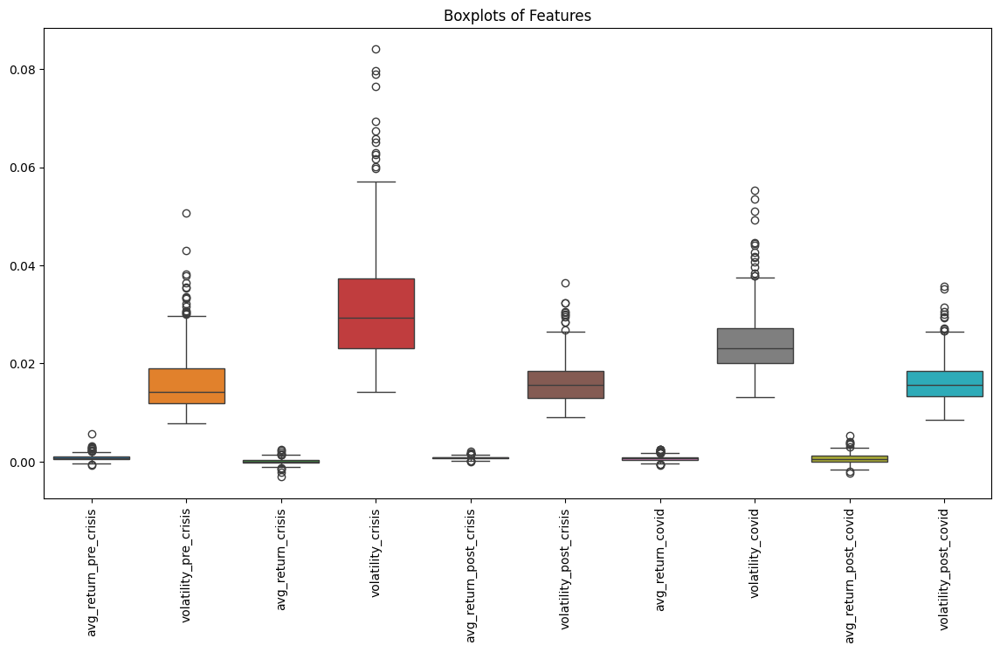

In [60]:
plt.figure(figsize=(14, 7))
sns.boxplot(data=feature_matrix)
plt.title('Boxplots of Features')
plt.xticks(rotation=90)
plt.show()

In [61]:
merged_data.head()

,Company,avg_return_pre_crisis,volatility_pre_crisis,avg_return_crisis,volatility_crisis,avg_return_post_crisis,volatility_post_crisis,avg_return_covid,volatility_covid,avg_return_post_covid,volatility_post_covid,GICS Sector,GICS Industry
0,MSFT,0.000356,0.011085,0.000020,0.025123,0.000914,0.014376,0.000832,0.021890,0.001960,0.015794,Technology,Software - Infrastructure
1,AAPL,0.003060,0.024775,0.001281,0.030126,0.001194,0.016205,0.001053,0.023264,0.001678,0.012788,Technology,Consumer Electronics
2,NVDA,0.002036,0.030606,-0.000298,0.042996,0.001507,0.025704,0.001829,0.035245,0.005338,0.030507,Technology,Semiconductors
3,AMZN,-0.000049,0.024757,0.001856,0.036857,0.001374,0.020287,0.000177,0.024624,0.002588,0.020798,Consumer Cyclical,Internet Retail
4,BRK-B,0.000391,0.008356,-0.000154,0.021217,0.000582,0.011497,0.000540,0.016116,0.000612,0.008594,Financial Services,Insurance - Diversified


In [62]:
# Store the column names for different periods in an array
period_columns = [['avg_return_pre_crisis',	'volatility_pre_crisis'], ['avg_return_crisis', 'volatility_crisis'], ['avg_return_post_crisis', 'volatility_post_crisis'], ['avg_return_covid', 'volatility_covid'], ['avg_return_post_covid', 'volatility_post_covid']]

In [63]:
from sklearn.preprocessing import StandardScaler

# Standardize the feature matrix
scaler = StandardScaler()
scaled_features = scaler.fit_transform(merged_data.drop(columns=['Company', 'GICS Sector', 'GICS Industry']))

##**8.1 K-means Clustering**

###**8.1.1 Hyperparameter tuning**

In [64]:
# *****Can take up to 8 minutes
param_grid_kmeans = {
    'n_clusters': range(2, 21),
    'n_init': ['auto', 10, 20, 30],
    'max_iter': [300, 400, 500],
    'init': ['k-means++', 'random'],
    'algorithm': ['lloyd', 'elkan'],
}

# In the variable name kmeans_second, I use 'second' to indicate 'second approach'
kmeans_second = KMeans(random_state=123)

# Initialize variables
best_kmeans_second_score = -2    # The lowest that silhouette score can be is -1
best_kmeans_second_grid = None
best_kmeans_second_labels = None

# To keep track of all combinations and their silhouette scores
kmeans_second_results = []

# Find the best hyperparameter combination
for g in ParameterGrid(param_grid_kmeans):
    kmeans_second.set_params(**g)
    kmeans_second.fit(scaled_features)
    kmeans_second_labels = kmeans_second.labels_
    score = silhouette_score(scaled_features, kmeans_second_labels)
    kmeans_second_results.append({'hyperparameters': g, 'silhouette_score': score, 'cluster_count': np.unique(kmeans_second_labels, return_counts=True)})

    if score > best_kmeans_second_score:
        best_kmeans_second_score = score
        best_kmeans_second_grid = g
        best_kmeans_second_labels = kmeans_second_labels

print("The best silhouette score is: ", best_kmeans_second_score)
print("The best hyperparameters are: ", best_kmeans_second_grid)
kmeans_second_results_df = pd.DataFrame(kmeans_second_results)

The best silhouette score is:  0.2746905171220907
The best hyperparameters are:  {'algorithm': 'lloyd', 'init': 'k-means++', 'max_iter': 300, 'n_clusters': 2, 'n_init': 'auto'}


In [65]:
kmeans_second_results_df.sort_values(by='silhouette_score', ascending=False)

,hyperparameters,silhouette_score,cluster_count
0,"{'algorithm': 'lloyd', 'init': 'k-means++', 'm...",0.274691,"([0, 1], [126, 259])"
76,"{'algorithm': 'lloyd', 'init': 'k-means++', 'm...",0.274691,"([0, 1], [126, 259])"
608,"{'algorithm': 'elkan', 'init': 'k-means++', 'm...",0.274691,"([0, 1], [126, 259])"
532,"{'algorithm': 'elkan', 'init': 'k-means++', 'm...",0.274691,"([0, 1], [126, 259])"
152,"{'algorithm': 'lloyd', 'init': 'k-means++', 'm...",0.274691,"([0, 1], [126, 259])"
456,"{'algorithm': 'elkan', 'init': 'k-means++', 'm...",0.274691,"([0, 1], [126, 259])"
459,"{'algorithm': 'elkan', 'init': 'k-means++', 'm...",0.273173,"([0, 1], [127, 258])"
306,"{'algorithm': 'lloyd', 'init': 'random', 'max_...",0.273173,"([0, 1], [258, 127])"
533,"{'algorithm': 'elkan', 'init': 'k-means++', 'm...",0.273173,"([0, 1], [127, 258])"
3,"{'algorithm': 'lloyd', 'init': 'k-means++', 'm...",0.273173,"([0, 1], [127, 258])"


For the record:

The best silhouette score is:  0.2731728268150784

The best hyperparameters are:  {'algorithm': 'lloyd', 'init': 'k-means++', 'max_iter': 300, 'n_clusters': 2, 'n_init': 30}

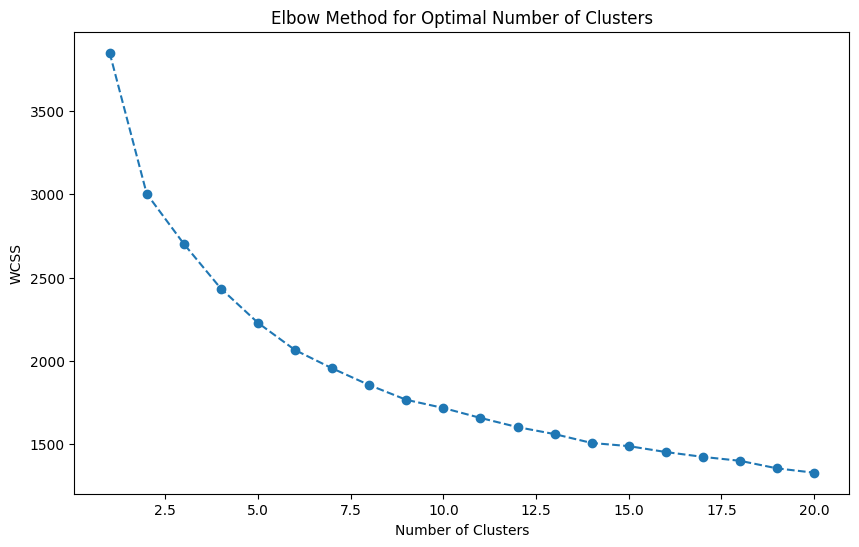

In [66]:
# Determine the optimal number of clusters using the elbow method
wcss = []
for i in range(1, 21):
    kmeans = KMeans(n_clusters=i, random_state=123, algorithm='lloyd', init='k-means++', max_iter=300, n_init=30)
    kmeans.fit(scaled_features)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 21), wcss, marker='o', linestyle='--')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

In [67]:
# Apply K-means clustering with the optimal number of clusters
kmeans = KMeans(n_clusters=2, random_state=123, algorithm='lloyd', init='k-means++', max_iter=300, n_init='auto')
clusters = kmeans.fit_predict(scaled_features)

# Add the cluster labels to the merged data
merged_data['Cluster'] = clusters

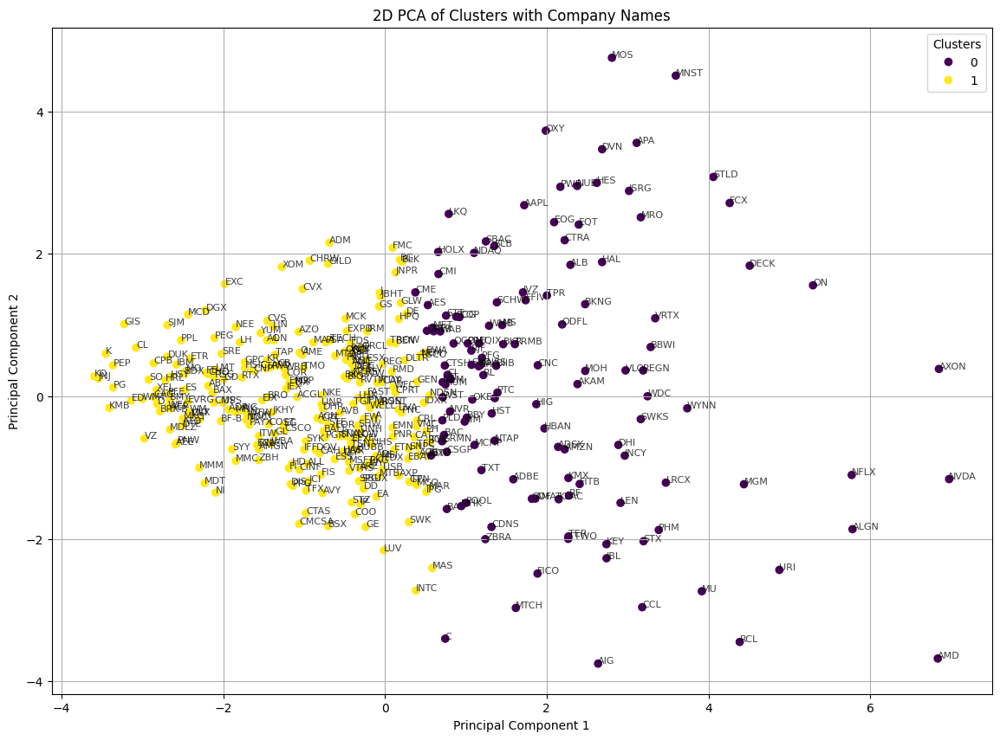

In [68]:
pca_2d = PCA(n_components=2)
components_2d = pca_2d.fit_transform(scaled_features)

# Create 2D plot with annotations
plt.figure(figsize=(14, 10))
scatter = plt.scatter(components_2d[:, 0], components_2d[:, 1], c=clusters, cmap='viridis')
plt.legend(*scatter.legend_elements(), title="Clusters")
plt.title('2D PCA of Clusters with Company Names')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)

for i, txt in enumerate(merged_data['Company']):
    plt.annotate(txt, (components_2d[i, 0], components_2d[i, 1]), fontsize=8, alpha=0.75)

plt.show()

###**8.1.2 Count and percentage of industry sector in each cluster**

In [69]:
kmeans_second_sector_counts = pd.DataFrame({'Cluster': np.array(merged_data['Cluster']), 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
kmeans_second_sector_percentages = kmeans_second_sector_counts.div(kmeans_second_sector_counts.sum(axis=1), axis=0) * 100

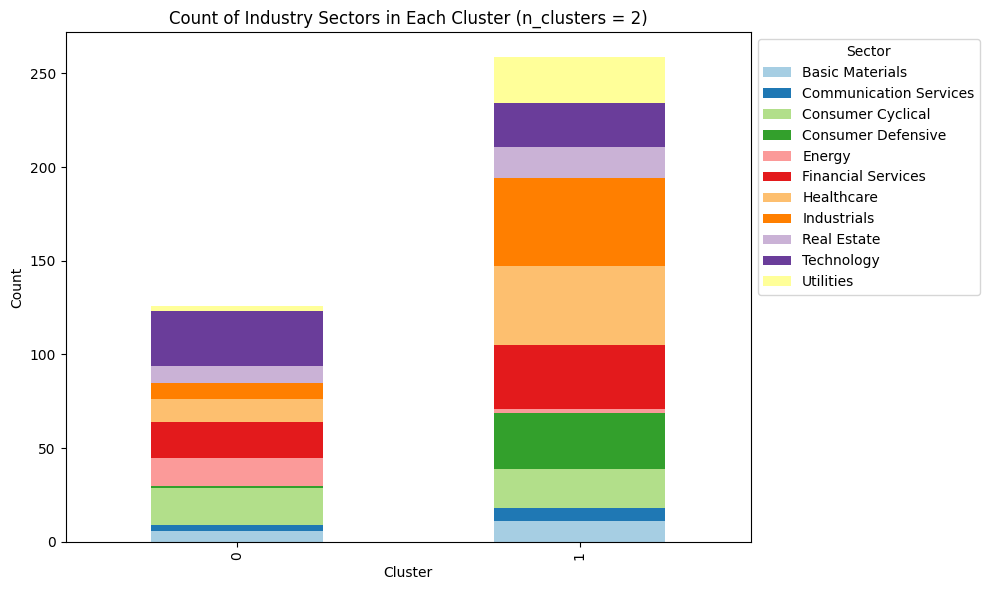

In [70]:
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))

# Stacked bar chart
ax = kmeans_second_sector_counts.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Count of Industry Sectors in Each Cluster (n_clusters = 2)')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

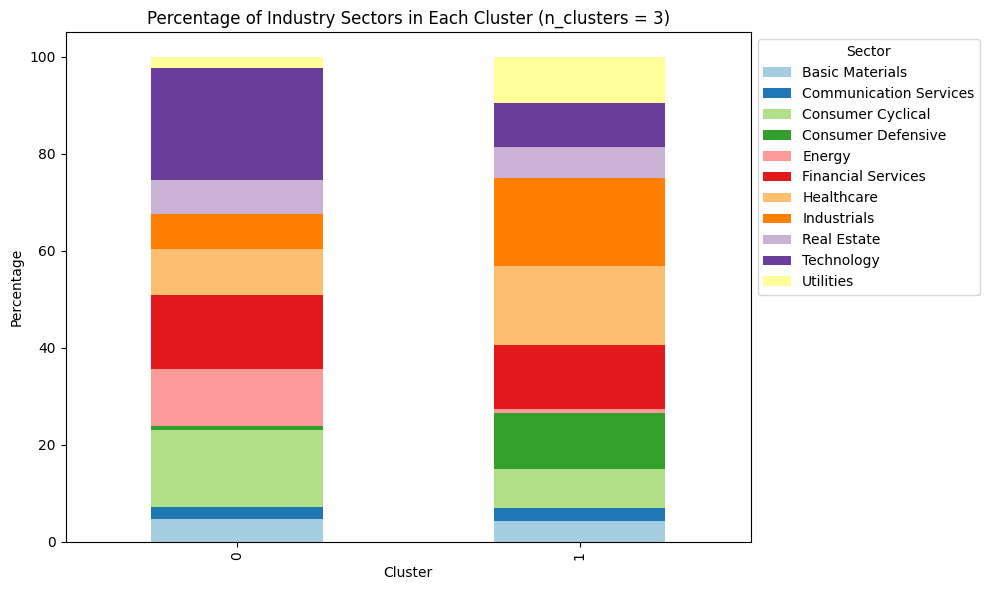

In [71]:
# Stacked bar chart
ax = kmeans_second_sector_percentages.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Percentage of Industry Sectors in Each Cluster (n_clusters = 3)')
plt.xlabel('Cluster')
plt.ylabel('Percentage')
plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

###**8.1.3 Count and percentage of cluster in each industry sector**

In [72]:
# Similar as before, but switch 0 and 1 in "axis="
kmeans_second_cluster_percentages = kmeans_second_sector_counts.div(kmeans_second_sector_counts.sum(axis=0), axis=1) * 100

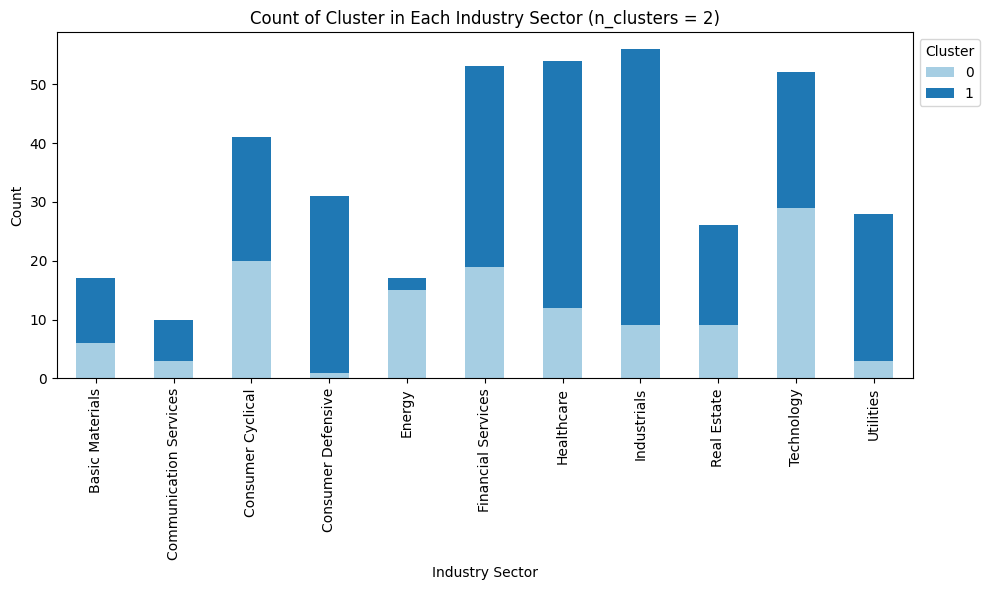

In [73]:
# Stacked bar charts
ax = kmeans_second_sector_counts.transpose().plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Count of Cluster in Each Industry Sector (n_clusters = 2)')
plt.xlabel('Industry Sector')
plt.ylabel('Count')
plt.legend(title='Cluster', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

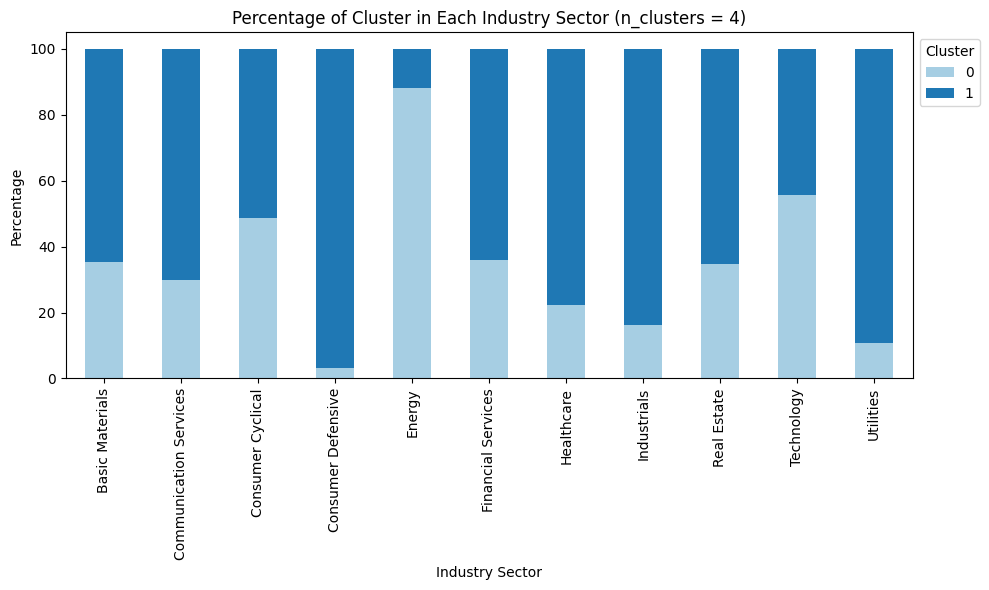

In [74]:
# Stacked bar charts
ax = kmeans_second_cluster_percentages.transpose().plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Percentage of Cluster in Each Industry Sector (n_clusters = 4)')
plt.xlabel('Industry Sector')
plt.ylabel('Percentage')
plt.legend(title='Cluster', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

###**8.1.4 Track Amazon**

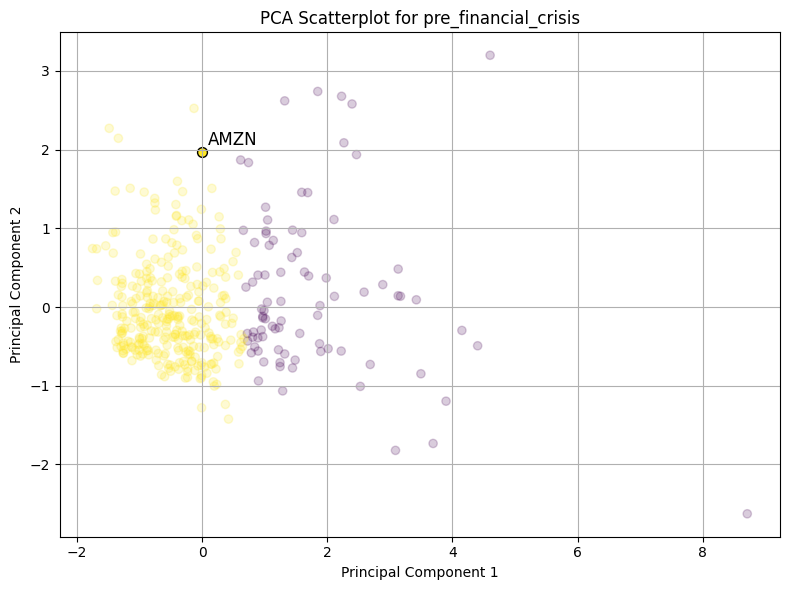

********** Period:  pre_financial_crisis **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Financial Services        48
Industrials               46
Healthcare                41
Consumer Cyclical         31
Technology                30
Consumer Defensive        29
Utilities                 26
Real Estate               22
Basic Materials           13
Communication Services     8
Energy                     6
Name: 1, dtype: int64 

Industry Sector
Financial Services        16.000000
Industrials               15.333333
Healthcare                13.666667
Consumer Cyclical         10.333333
Technology                10.000000
Consumer Defensive         9.666667
Utilities                  8.666667
Real Estate                7.333333
Basic Materials            4.333333
Communication Services     2.666667
Energy                     2.000000
Name: 1, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Se

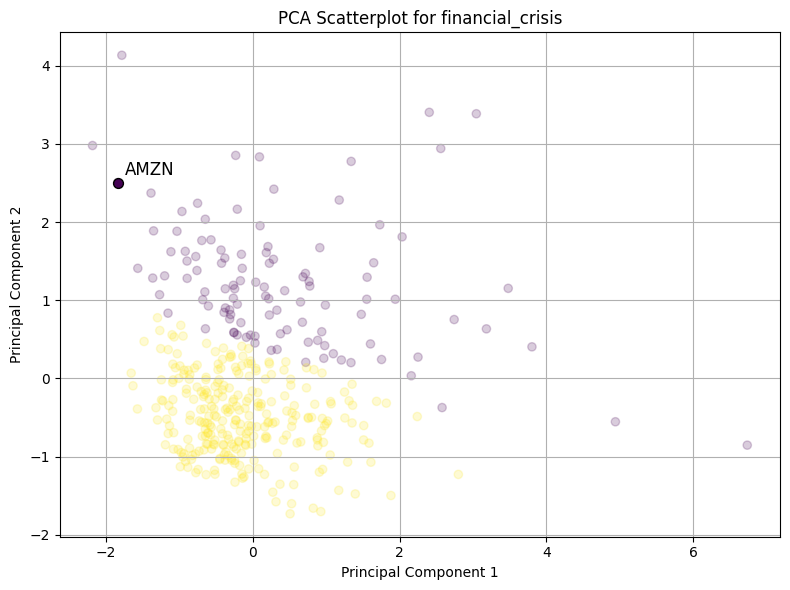

********** Period:  financial_crisis **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Financial Services        31
Real Estate               18
Consumer Cyclical         14
Industrials               13
Technology                10
Energy                     7
Basic Materials            6
Healthcare                 6
Communication Services     2
Consumer Defensive         2
Utilities                  1
Name: 0, dtype: int64 

Industry Sector
Financial Services        28.181818
Real Estate               16.363636
Consumer Cyclical         12.727273
Industrials               11.818182
Technology                 9.090909
Energy                     6.363636
Basic Materials            5.454545
Healthcare                 5.454545
Communication Services     1.818182
Consumer Defensive         1.818182
Utilities                  0.909091
Name: 0, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Sector

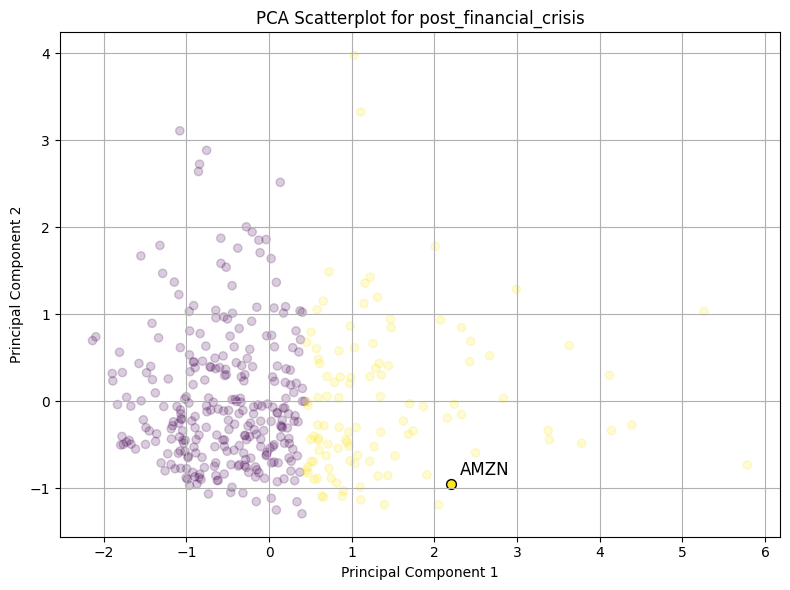

********** Period:  post_financial_crisis **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Technology                28
Consumer Cyclical         19
Healthcare                19
Industrials               14
Financial Services         9
Communication Services     5
Consumer Defensive         4
Energy                     4
Basic Materials            2
Real Estate                2
Utilities                  1
Name: 1, dtype: int64 

Industry Sector
Technology                26.168224
Consumer Cyclical         17.757009
Healthcare                17.757009
Industrials               13.084112
Financial Services         8.411215
Communication Services     4.672897
Consumer Defensive         3.738318
Energy                     3.738318
Basic Materials            1.869159
Real Estate                1.869159
Utilities                  0.934579
Name: 1, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry S

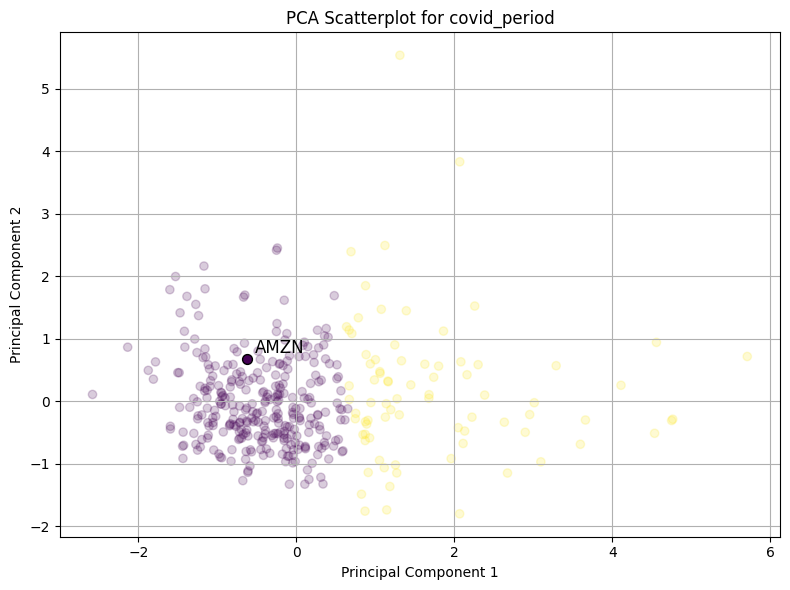

********** Period:  covid_period **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Healthcare                49
Industrials               49
Financial Services        43
Technology                37
Consumer Defensive        31
Consumer Cyclical         27
Utilities                 26
Real Estate               23
Basic Materials           12
Communication Services     8
Energy                     0
Name: 0, dtype: int64 

Industry Sector
Healthcare                16.065574
Industrials               16.065574
Financial Services        14.098361
Technology                12.131148
Consumer Defensive        10.163934
Consumer Cyclical          8.852459
Utilities                  8.524590
Real Estate                7.540984
Basic Materials            3.934426
Communication Services     2.622951
Energy                     0.000000
Name: 0, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Sector  Ba

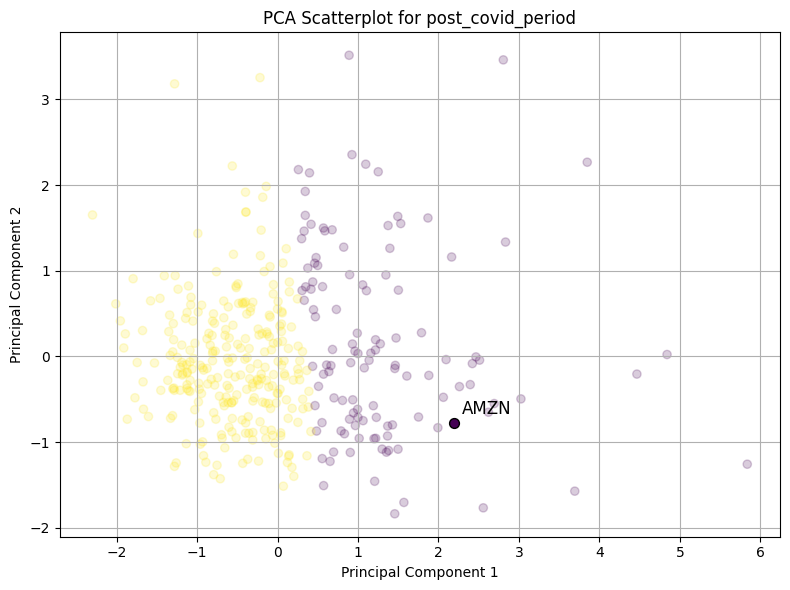

********** Period:  post_covid_period **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Technology                31
Consumer Cyclical         21
Industrials               21
Financial Services        15
Healthcare                 8
Basic Materials            7
Energy                     7
Real Estate                4
Communication Services     3
Utilities                  1
Consumer Defensive         0
Name: 0, dtype: int64 

Industry Sector
Technology                26.271186
Consumer Cyclical         17.796610
Industrials               17.796610
Financial Services        12.711864
Healthcare                 6.779661
Basic Materials            5.932203
Energy                     5.932203
Real Estate                3.389831
Communication Services     2.542373
Utilities                  0.847458
Consumer Defensive         0.000000
Name: 0, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Secto

In [75]:
n_cluster = 2
pca = PCA(n_components=2)

# Iterate over each period data
for index, period_data in enumerate(periods):
    # Use only the columns corresponding to this period
    scaler = StandardScaler()
    scaled_features_1 = scaler.fit_transform(merged_data[period_columns[index]])
    pca_components = pca.fit_transform(scaled_features_1)

    # Use the best hyperparameters
    kmeans = KMeans(n_clusters=2, random_state=123, algorithm='lloyd', init='k-means++', max_iter=300, n_init=30)
    kmeans.fit(scaled_features_1)
    kmeans_labels = kmeans.labels_

    plt.figure(figsize=(8, 6))

    # Create a colormap from the k-means labels
    unique_labels_length = len(np.unique(kmeans_labels))
    cmap = ListedColormap(plt.cm.viridis(np.linspace(0, 1, unique_labels_length)))
    colors = cmap(kmeans_labels)

    plt.scatter(pca_components[:, 0], pca_components[:, 1], c=colors, cmap='viridis', alpha=0.2)

    # Highlight 'AMZN'
    amzn_index = correlation_matrix.index.get_loc('AMZN')
    plt.scatter(pca_components[amzn_index, 0], pca_components[amzn_index, 1], color=colors[amzn_index], marker='o', s=50, edgecolors='black', alpha=1.0)
    plt.annotate('AMZN', xy=(pca_components[amzn_index, 0], pca_components[amzn_index, 1]), xytext=(pca_components[amzn_index, 0] + 0.1, pca_components[amzn_index, 1] + 0.1), fontsize=12, color='black')

    plt.title(f'PCA Scatterplot for {period_names[index]}')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    amazons_cluster = kmeans_labels[amzn_index]

    print("********** Period: ", period_names[index], "**********")
    sector_counts_amzn = pd.DataFrame({'Cluster': kmeans_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
    sector_percentages_amzn = sector_counts_amzn.div(sector_counts_amzn.sum(axis=1), axis=0) * 100
    print("\n1. Count and percentage of industry sector in the cluster that Amazon is in: ")
    #count
    print(sector_counts_amzn.loc[amazons_cluster].sort_values(ascending=False), "\n")
    #order by percentage in descending order
    print(sector_percentages_amzn.loc[amazons_cluster].sort_values(ascending=False))

    print("\n2. Count and percentage of industry sector in all clusters: \n")
    #count
    print(sector_counts_amzn)
    print(sector_percentages_amzn)
    print("\n")

    # cluster_percentages_amzn = sector_counts_amzn.div(sector_counts_amzn.sum(axis=0), axis=1) * 100
    # print("\n3. Count and percentage of cluster in each sector: \n")
    # #count
    # print(sector_counts_amzn)
    # print(cluster_percentages_amzn)
    # print("\n")

##**8.2 Hierarchical clustering**

###**8.2.1 Hyperparameter tuning**

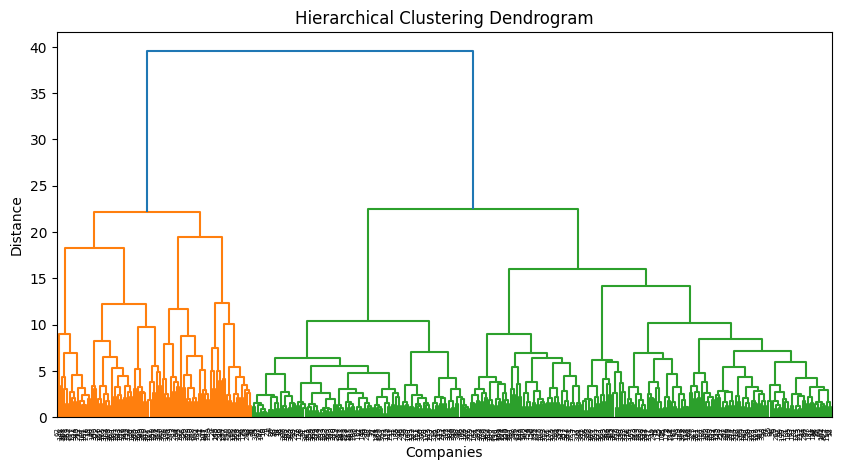

In [76]:
# Plot a dendogram to get an idea of the distance
link = linkage(scaled_features, method='ward', metric='euclidean')  #AgglomerativeClustering from scikitlearn uses linkage=ward by default, so use ward here as well

# Plot dendrogram
plt.figure(figsize=(10, 5))
dendrogram(link)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Companies')
plt.ylabel('Distance')
plt.show()

In [77]:
# *****
param_grid_hierarchical = {
    'n_clusters': range(2, 21),
    #'linkage': ['ward', 'complete', 'average', 'single'],
    'linkage': ['ward'],
    #'metric': ['euclidean', 'l1', 'l2', 'manhattan', 'cosine', 'precomputed']
    'metric': ['euclidean'],
    #'distance_threshold': [5, 10, 2]
}

# In the variable name kmeans_second, I use 'second' to indicate 'first approach'
hierarchical_second = AgglomerativeClustering(n_clusters=None)

# Initialize variables
best_hierarchical_second_score = -2    # The lowest that silhouette score can be is -1
#best_hierarchical_second_score = float('inf')
best_hierarchical_second_grid = None
best_hierarchical_second_labels = None
hierarchical_second_results = []

# Find the best hyperparameter combination
for g in ParameterGrid(param_grid_hierarchical):
    # Skip invalid combinations
    # ward can only work with euclidean, otherwise it will throw an error
    if g['linkage'] == 'ward' and g['metric'] != 'euclidean':
        continue

    hierarchical_second.set_params(**g)

    if g['metric'] == 'precomputed':
        distance_matrix = pairwise_distances(scaled_features, metric='euclidean')
        hierarchical_second.fit(distance_matrix)
    else:
        hierarchical_second.fit(scaled_features)

    hierarchical_second_labels = hierarchical_second.labels_
    score = silhouette_score(scaled_features, hierarchical_second_labels)
    #score = davies_bouldin_score(scaled_features, hierarchical_second_labels)
    hierarchical_second_results.append({'hyperparameters': g, 'silhouette_score': score, 'cluster_count': np.unique(hierarchical_second_labels, return_counts=True)})

    if score > best_hierarchical_second_score:
    #if score < best_hierarchical_second_score:
        best_hierarchical_second_score = score
        best_hierarchical_second_grid = g
        best_hierarchical_second_labels = hierarchical_second_labels

print("The best silhouette score is: ", best_hierarchical_second_score)
print("The best hyperparameters are: ", best_hierarchical_second_grid)
hierarchical_second_results_df = pd.DataFrame(hierarchical_second_results)

The best silhouette score is:  0.30771606460048334
The best hyperparameters are:  {'linkage': 'ward', 'metric': 'euclidean', 'n_clusters': 2}


For the record:

The best silhouette score is:  0.3077160519618732

The best hyperparameters are:  {'linkage': 'ward', 'metric': 'euclidean', 'n_clusters': 2}

In [78]:
hierarchical_second_results_df.sort_values(by='silhouette_score', ascending=False)

,hyperparameters,silhouette_score,cluster_count
0,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.307716,"([0, 1], [288, 97])"
9,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.148209,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10], [108, 102..."
8,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.144022,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], [24, 102, 108..."
7,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.143030,"([0, 1, 2, 3, 4, 5, 6, 7, 8], [35, 24, 108, 10..."
6,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.139026,"([0, 1, 2, 3, 4, 5, 6, 7], [21, 35, 108, 102, ..."
5,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.133369,"([0, 1, 2, 3, 4, 5, 6], [124, 21, 108, 35, 24,..."
4,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.130379,"([0, 1, 2, 3, 4, 5], [180, 21, 108, 35, 24, 17])"
3,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.116592,"([0, 1, 2, 3, 4], [52, 180, 108, 21, 24])"
18,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.115555,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
17,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.112633,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."


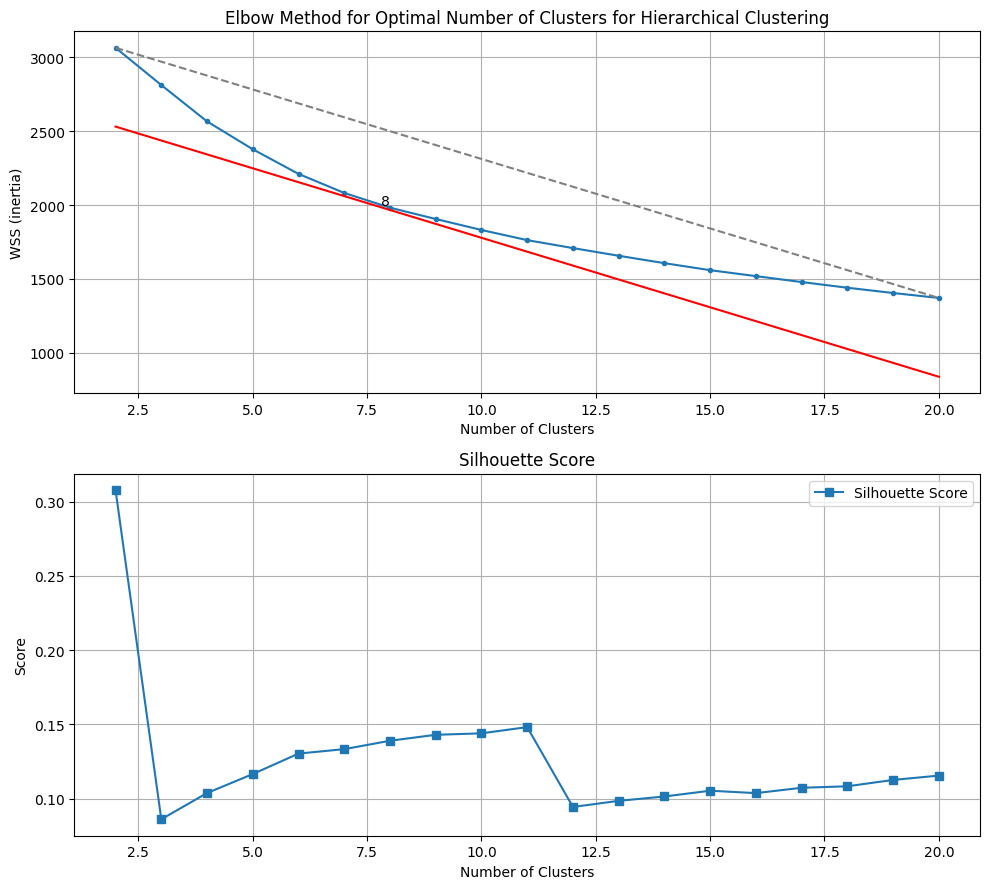

In [79]:
def wss_calculation2(K, data):
    WSS = []
    for i in range(1, K):
        cluster = AgglomerativeClustering(n_clusters=i + 1)
        labels = cluster.fit_predict(data)
        wss = []
        for j in range(i + 1):
            # extract each cluster according to its index
            cluster_data = data[labels == j]
            cluster_mean = cluster_data.mean(axis=0)
            distance = np.sum(np.square(cluster_data - cluster_mean))
            wss.append(distance)
        WSS.append(sum(wss))
    return WSS

WSS = wss_calculation2(20, scaled_features)

# Test out different values of n_clusters using the elbow method
# Try the numbers between 2 to 20
n_cluster_options = range(2, 21)

silhouette_scores_hierarchical = []
hierarchical_results = {}

for n_cluster in n_cluster_options:
    hierarchical = AgglomerativeClustering(n_clusters=n_cluster, linkage='ward', metric='euclidean')
    hierarchical.fit(scaled_features)
    hierarchical_labels = hierarchical.labels_
    hierarchical_results[n_cluster] = hierarchical_labels

    # Record the metrics
    silhouette_scores_hierarchical.append(silhouette_score(scaled_features, hierarchical_labels))

start_point = (n_cluster_options[0], WSS[0])
end_point = (n_cluster_options[-1], WSS[-1])
slope = (end_point[1] - start_point[1]) / (end_point[0] - start_point[0])

x_values = np.linspace(2, 20)
y_values = slope * x_values + 2720

# Plot elbow method (inertia)
# plt.figure(figsize=(8, 6))
# plt.plot(n_cluster_options, WSS, marker='.')
# plt.plot([start_point[0], end_point[0]], [start_point[1], end_point[1]], linestyle='--', color='gray')
# plt.plot(x_values, y_values, color='red')
# plt.text(n_cluster_options[6], inertia_array[6], f'{n_cluster_options[6]}', ha='right', va='bottom')
# plt.xlabel('Number of Clusters')
# plt.ylabel('WSS (inertia)')
# plt.title('Elbow Method for Optimal Number of Clusters for Hierarchical Clustering')
# plt.grid(True)
# plt.show()

#plot subplots
fig, ax = plt.subplots(2, 1, figsize=(10, 9))

# Plot elbow method (inertia)
ax[0].plot(n_cluster_options, WSS, marker='.')
ax[0].plot([start_point[0], end_point[0]], [start_point[1], end_point[1]], linestyle='--', color='gray')
ax[0].plot(x_values, y_values, color='red')
ax[0].text(n_cluster_options[6], WSS[6], f'{n_cluster_options[6]}', ha='right', va='bottom')
ax[0].set_xlabel('Number of Clusters')
ax[0].set_ylabel('WSS (inertia)')
ax[0].set_title('Elbow Method for Optimal Number of Clusters for Hierarchical Clustering')
ax[0].grid(True)

# Plot the silhoutte score and davies-bouldin index
ax[1].plot(n_cluster_options, silhouette_scores_hierarchical, marker='s', label='Silhouette Score')
ax[1].set_xlabel('Number of Clusters')
ax[1].set_ylabel('Score')
ax[1].set_title('Silhouette Score')
ax[1].legend()
ax[1].grid(True)

plt.tight_layout()
plt.show()

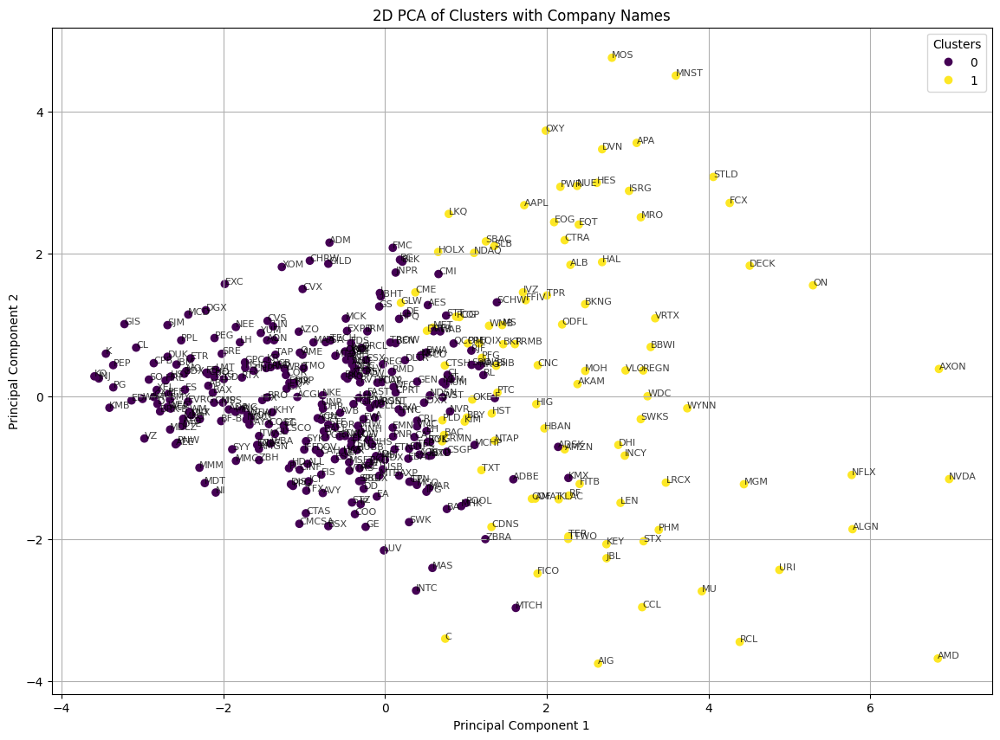

In [80]:
pca_2d = PCA(n_components=2)
components_2d = pca_2d.fit_transform(scaled_features)

# Apply hierarchical clustering with the optimal number of clusters
hierarchical = AgglomerativeClustering(n_clusters=2, linkage='ward', metric='euclidean')
clusters = hierarchical.fit_predict(scaled_features)

# Create 2D plot with annotations
plt.figure(figsize=(14, 10))
scatter = plt.scatter(components_2d[:, 0], components_2d[:, 1], c=clusters, cmap='viridis')
plt.legend(*scatter.legend_elements(), title="Clusters")
plt.title('2D PCA of Clusters with Company Names')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)

for i, txt in enumerate(merged_data['Company']):
    plt.annotate(txt, (components_2d[i, 0], components_2d[i, 1]), fontsize=8, alpha=0.75)

plt.show()

###**8.2.2 Count and percentage of industry sector in each cluster**

In [81]:
hierarchical_second_sector_counts = pd.DataFrame({'Cluster': best_hierarchical_second_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
hierarchical_second_sector_percentages = hierarchical_second_sector_counts.div(hierarchical_second_sector_counts.sum(axis=1), axis=0) * 100

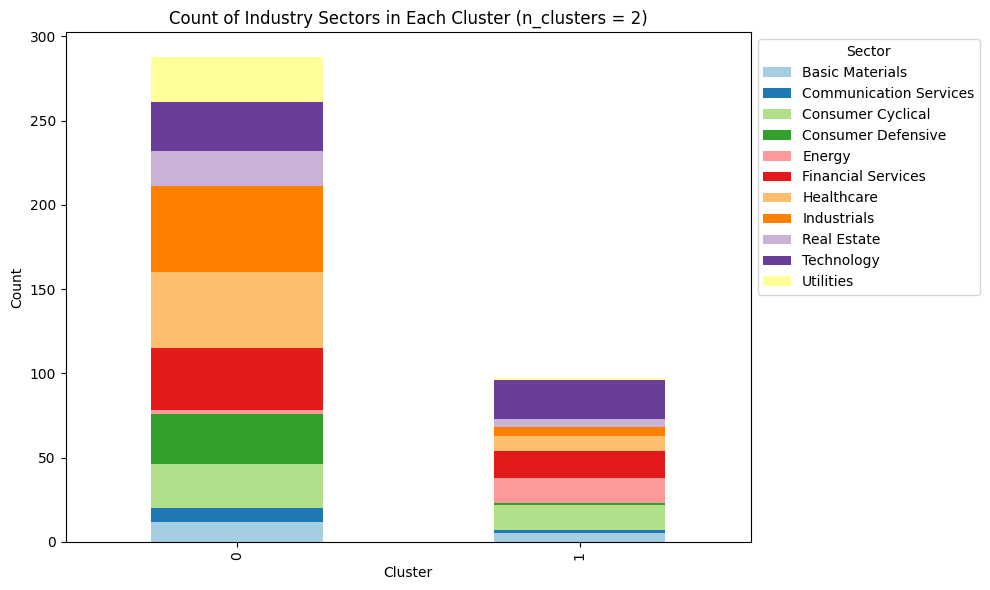

In [82]:
# Stacked bar chart
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))
ax = hierarchical_second_sector_counts.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Count of Industry Sectors in Each Cluster (n_clusters = 2)')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

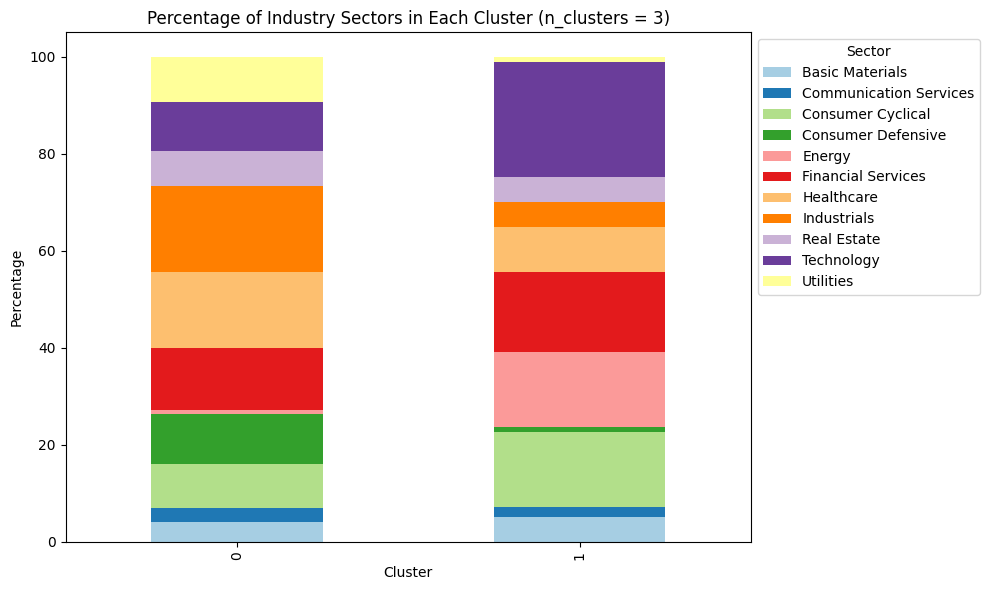

In [83]:
# Stacked bar chart
ax = hierarchical_second_sector_percentages.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Percentage of Industry Sectors in Each Cluster (n_clusters = 3)')
plt.xlabel('Cluster')
plt.ylabel('Percentage')
plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

###**8.2.3 Count and percentage of cluster in each industry sector**

In [84]:
# Similar as before, but switch 0 and 1 in "axis="
hierarchical_second_cluster_percentages = hierarchical_second_sector_counts.div(hierarchical_second_sector_counts.sum(axis=0), axis=1) * 100

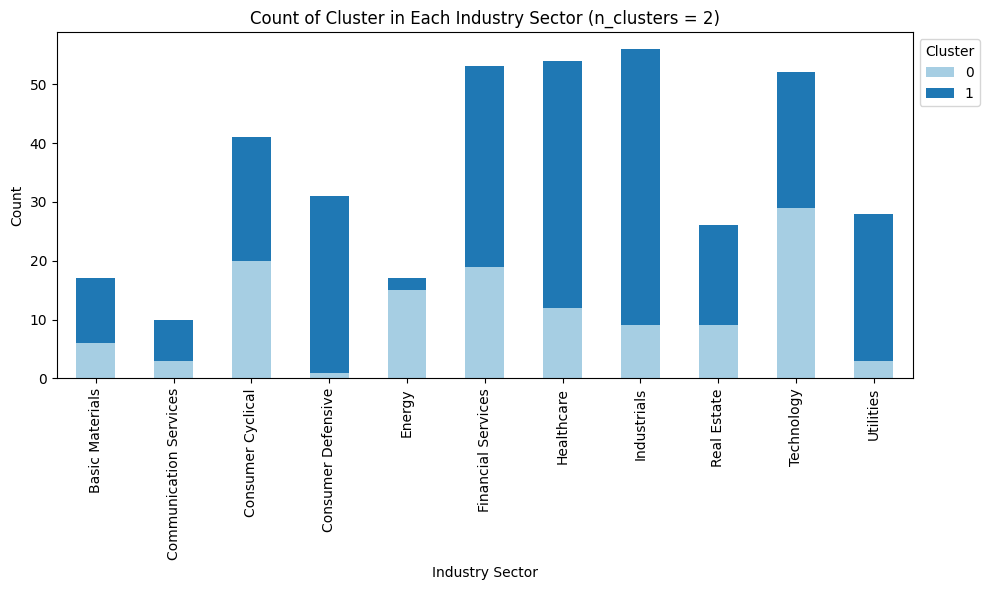

In [85]:
# Stacked bar charts
ax = kmeans_second_sector_counts.transpose().plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Count of Cluster in Each Industry Sector (n_clusters = 2)')
plt.xlabel('Industry Sector')
plt.ylabel('Count')
plt.legend(title='Cluster', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

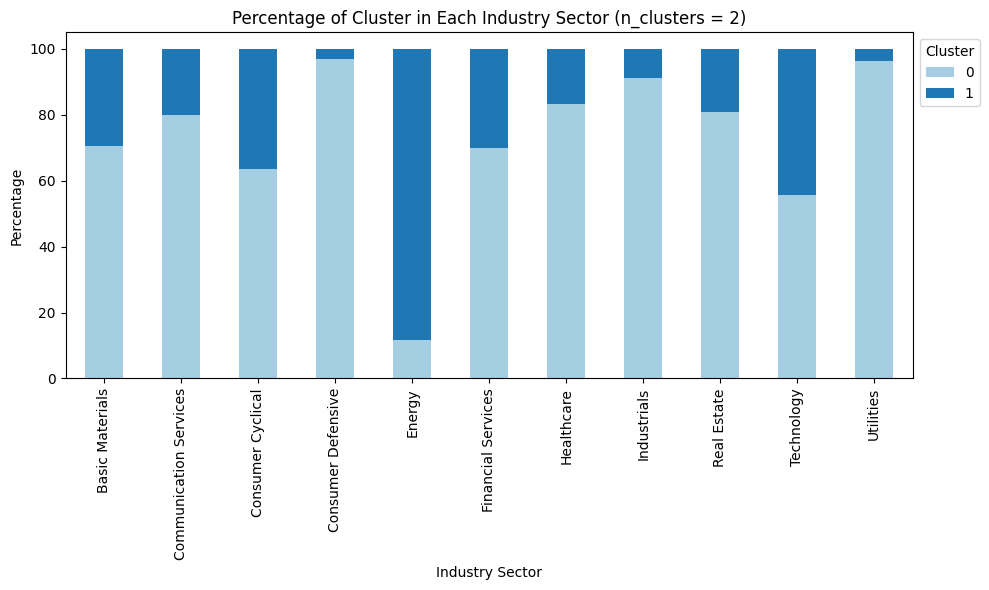

In [86]:
# Stacked bar charts
ax = hierarchical_second_cluster_percentages.transpose().plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Percentage of Cluster in Each Industry Sector (n_clusters = 2)')
plt.xlabel('Industry Sector')
plt.ylabel('Percentage')
plt.legend(title='Cluster', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

###**8.2.4 Track Amazon**

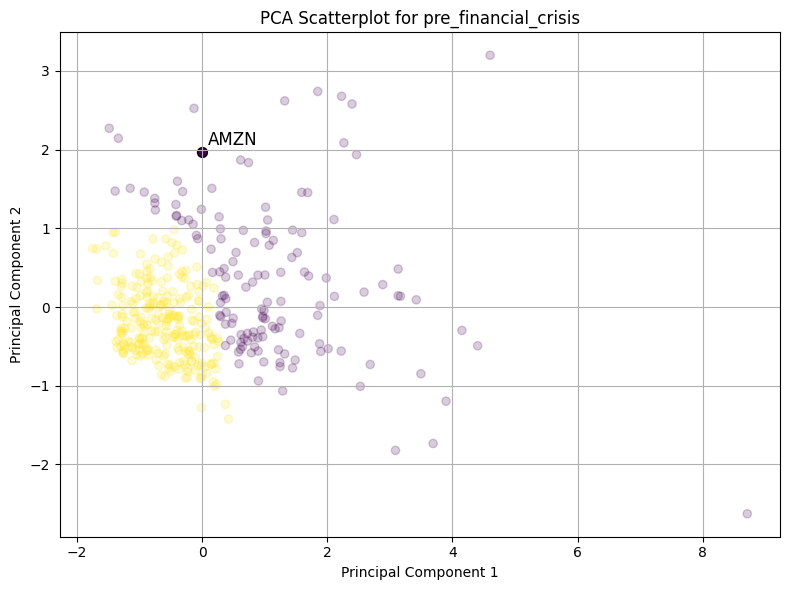

********** Period:  pre_financial_crisis **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Technology                31
Consumer Cyclical         21
Industrials               21
Financial Services        15
Healthcare                 8
Basic Materials            7
Energy                     7
Real Estate                4
Communication Services     3
Utilities                  1
Consumer Defensive         0
Name: 0, dtype: int64 

Industry Sector
Technology                26.271186
Consumer Cyclical         17.796610
Industrials               17.796610
Financial Services        12.711864
Healthcare                 6.779661
Basic Materials            5.932203
Energy                     5.932203
Real Estate                3.389831
Communication Services     2.542373
Utilities                  0.847458
Consumer Defensive         0.000000
Name: 0, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Se

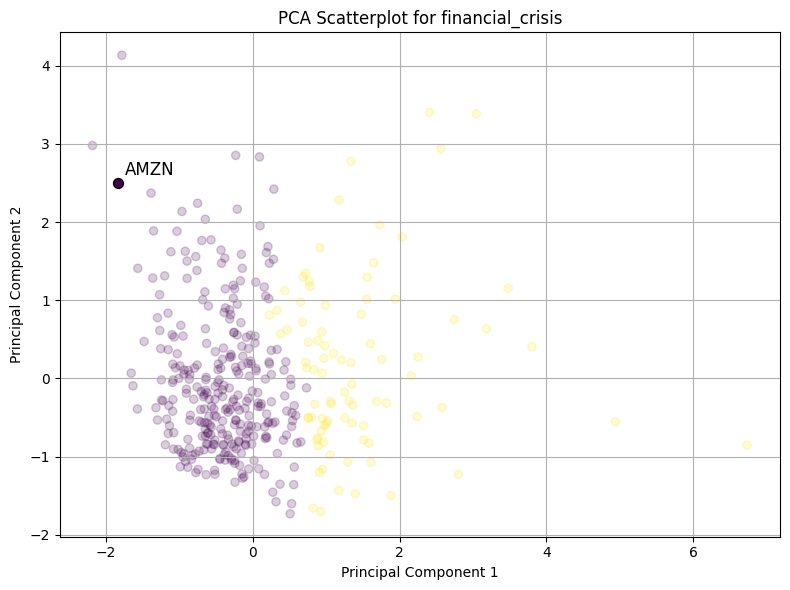

********** Period:  financial_crisis **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Technology                31
Consumer Cyclical         21
Industrials               21
Financial Services        15
Healthcare                 8
Basic Materials            7
Energy                     7
Real Estate                4
Communication Services     3
Utilities                  1
Consumer Defensive         0
Name: 0, dtype: int64 

Industry Sector
Technology                26.271186
Consumer Cyclical         17.796610
Industrials               17.796610
Financial Services        12.711864
Healthcare                 6.779661
Basic Materials            5.932203
Energy                     5.932203
Real Estate                3.389831
Communication Services     2.542373
Utilities                  0.847458
Consumer Defensive         0.000000
Name: 0, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Sector

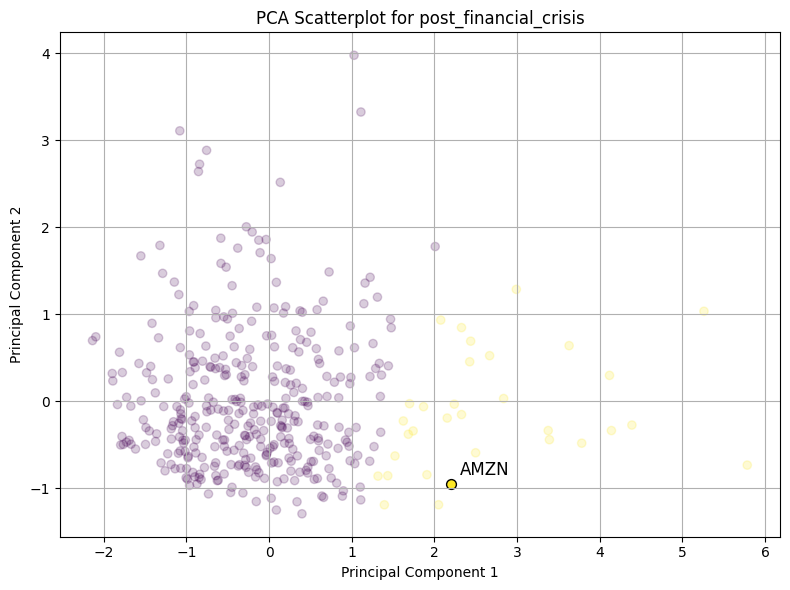

********** Period:  post_financial_crisis **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Technology                31
Consumer Cyclical         21
Industrials               21
Financial Services        15
Healthcare                 8
Basic Materials            7
Energy                     7
Real Estate                4
Communication Services     3
Utilities                  1
Consumer Defensive         0
Name: 0, dtype: int64 

Industry Sector
Technology                26.271186
Consumer Cyclical         17.796610
Industrials               17.796610
Financial Services        12.711864
Healthcare                 6.779661
Basic Materials            5.932203
Energy                     5.932203
Real Estate                3.389831
Communication Services     2.542373
Utilities                  0.847458
Consumer Defensive         0.000000
Name: 0, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry S

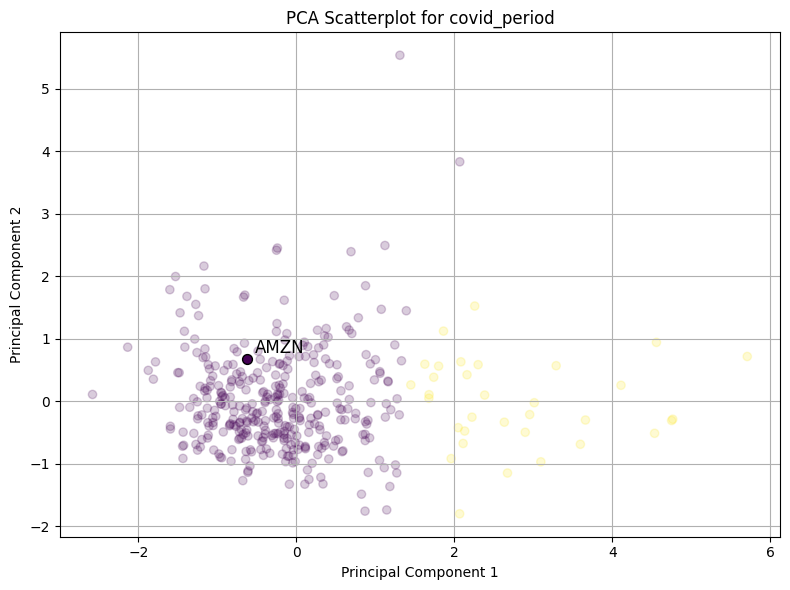

********** Period:  covid_period **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Technology                31
Consumer Cyclical         21
Industrials               21
Financial Services        15
Healthcare                 8
Basic Materials            7
Energy                     7
Real Estate                4
Communication Services     3
Utilities                  1
Consumer Defensive         0
Name: 0, dtype: int64 

Industry Sector
Technology                26.271186
Consumer Cyclical         17.796610
Industrials               17.796610
Financial Services        12.711864
Healthcare                 6.779661
Basic Materials            5.932203
Energy                     5.932203
Real Estate                3.389831
Communication Services     2.542373
Utilities                  0.847458
Consumer Defensive         0.000000
Name: 0, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Sector  Ba

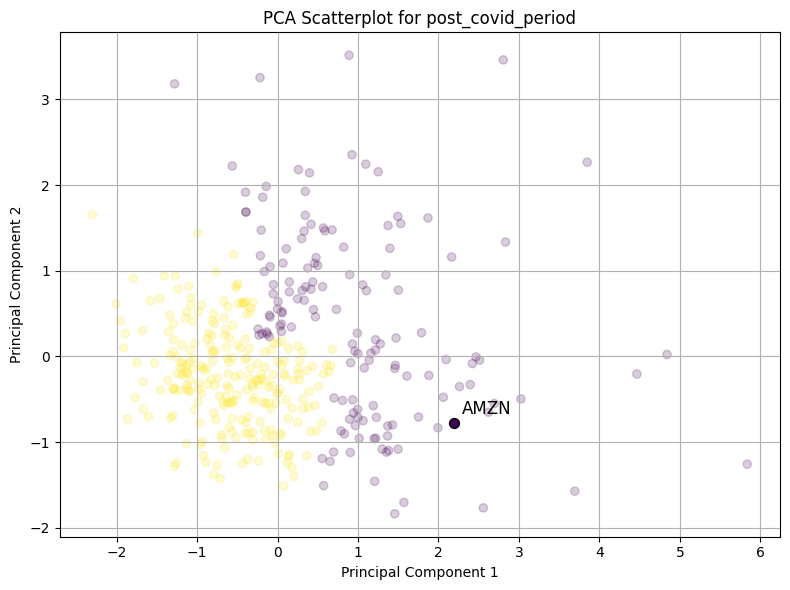

********** Period:  post_covid_period **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Technology                31
Consumer Cyclical         21
Industrials               21
Financial Services        15
Healthcare                 8
Basic Materials            7
Energy                     7
Real Estate                4
Communication Services     3
Utilities                  1
Consumer Defensive         0
Name: 0, dtype: int64 

Industry Sector
Technology                26.271186
Consumer Cyclical         17.796610
Industrials               17.796610
Financial Services        12.711864
Healthcare                 6.779661
Basic Materials            5.932203
Energy                     5.932203
Real Estate                3.389831
Communication Services     2.542373
Utilities                  0.847458
Consumer Defensive         0.000000
Name: 0, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Secto

In [87]:
n_cluster = 2
pca = PCA(n_components=2)

# Iterate over each period data
for index, period_data in enumerate(periods):
    # Use only the columns corresponding to this period
    scaler = StandardScaler()
    scaled_features_1 = scaler.fit_transform(merged_data[period_columns[index]])
    pca_components = pca.fit_transform(scaled_features_1)

    # Use the best hyperparameters
    hierarchical = AgglomerativeClustering(n_clusters=n_cluster, linkage='ward', metric='euclidean')
    hierarchical.fit(scaled_features_1)
    hierarchical_labels = hierarchical.labels_

    plt.figure(figsize=(8, 6))

    # Create a colormap from the hierarchical labels
    unique_labels_length = len(np.unique(hierarchical_labels))
    cmap = ListedColormap(plt.cm.viridis(np.linspace(0, 1, unique_labels_length)))
    colors = cmap(hierarchical_labels)

    plt.scatter(pca_components[:, 0], pca_components[:, 1], c=colors, cmap='viridis', alpha=0.2)

    # Highlight 'AMZN'
    amzn_index = correlation_matrix.index.get_loc('AMZN')
    plt.scatter(pca_components[amzn_index, 0], pca_components[amzn_index, 1], color=colors[amzn_index], marker='o', s=50, edgecolors='black', alpha=1.0)
    plt.annotate('AMZN', xy=(pca_components[amzn_index, 0], pca_components[amzn_index, 1]), xytext=(pca_components[amzn_index, 0] + 0.1, pca_components[amzn_index, 1] + 0.1), fontsize=12, color='black')

    plt.title(f'PCA Scatterplot for {period_names[index]}')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    amazons_cluster = kmeans_labels[amzn_index]

    print("********** Period: ", period_names[index], "**********")
    sector_counts_amzn = pd.DataFrame({'Cluster': kmeans_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
    sector_percentages_amzn = sector_counts_amzn.div(sector_counts_amzn.sum(axis=1), axis=0) * 100
    print("\n1. Count and percentage of industry sector in the cluster that Amazon is in: ")
    #count
    print(sector_counts_amzn.loc[amazons_cluster].sort_values(ascending=False), "\n")
    #order by percentage in descending order
    print(sector_percentages_amzn.loc[amazons_cluster].sort_values(ascending=False))

    print("\n2. Count and percentage of industry sector in all clusters: \n")
    #count
    print(sector_counts_amzn)
    print(sector_percentages_amzn)
    print("\n")

    # cluster_percentages_amzn = sector_counts_amzn.div(sector_counts_amzn.sum(axis=0), axis=1) * 100
    # print("\n3. Count and percentage of cluster in each sector: \n")
    # #count
    # print(sector_counts_amzn)
    # print(cluster_percentages_amzn)
    # print("\n")

#**9. Third approach: correlation matrix + feature engineering**

##**9.1 K-means clustering**

###**9.1.1 🌼🌼🌼 Hyperparameter tuning**

In [88]:
feature_matrix.set_index('Company', inplace=True)

In [89]:
if not all(correlation_matrix.index == feature_matrix.index):
    print("Indices do not match between the correlation matrix and feature matrix.")
else:
    # Concatenate the correlation matrix and the feature matrix horizontally
    # Use PCA to reduce the correlation matrix to 8 principal components
    pca = PCA(n_components=10)
    correlation_matrix_reduced = pca.fit_transform(correlation_matrix)
    correlation_matrix_reduced = pd.DataFrame(correlation_matrix_reduced)
    correlation_matrix_reduced.rename(columns={0: "Corr_PCA_1", 1: "Corr_PCA_2", 2: "Corr_PCA_3", 3: "Corr_PCA_4", 4: "Corr_PCA_5", 5: "Corr_PCA_6", 6: "Corr_PCA_7", 7: "Corr_PCA_8", 8: "Corr_PCA_9", 9: "Corr_PCA_10"}, inplace=True)
    correlation_matrix_reduced.index = correlation_matrix.index   # The underlying order of the rows remains after PCA

    combined_matrix = pd.concat([feature_matrix, correlation_matrix_reduced], axis=1)

In [90]:
combined_matrix.head()

,avg_return_pre_crisis,volatility_pre_crisis,avg_return_crisis,volatility_crisis,avg_return_post_crisis,volatility_post_crisis,avg_return_covid,volatility_covid,avg_return_post_covid,volatility_post_covid,Corr_PCA_1,Corr_PCA_2,Corr_PCA_3,Corr_PCA_4,Corr_PCA_5,Corr_PCA_6,Corr_PCA_7,Corr_PCA_8,Corr_PCA_9,Corr_PCA_10
MSFT,0.000356,0.011085,0.000020,0.025123,0.000914,0.014376,0.000832,0.021890,0.001960,0.015794,-0.378808,-0.102554,-0.884705,-0.043815,-0.051669,-0.328803,-0.074152,0.135557,0.302901,0.160217
AAPL,0.003060,0.024775,0.001281,0.030126,0.001194,0.016205,0.001053,0.023264,0.001678,0.012788,0.672403,-0.653635,-0.443667,-0.056128,-0.229598,-0.190066,-0.162563,0.152557,0.141500,0.104978
NVDA,0.002036,0.030606,-0.000298,0.042996,0.001507,0.025704,0.001829,0.035245,0.005338,0.030507,0.709743,-1.131154,-0.652117,-0.052182,-0.463892,-0.328701,-0.143165,0.299999,0.134455,-0.002337
AMZN,-0.000049,0.024757,0.001856,0.036857,0.001374,0.020287,0.000177,0.024624,0.002588,0.020798,1.292061,-0.888674,-0.403927,-0.348478,-0.260385,-0.168526,-0.150053,0.081144,0.131398,0.199323
BRK-B,0.000391,0.008356,-0.000154,0.021217,0.000582,0.011497,0.000540,0.016116,0.000612,0.008594,-0.959177,0.069834,0.071321,0.119224,0.420520,-0.023988,0.065813,0.101182,-0.017378,0.017296


In [91]:
# The correlation matrix columns are reduced to 10 columns
# which explain around 89% of the variance in the data
pca.explained_variance_ratio_.cumsum()

array([0.50102157, 0.66862823, 0.74375909, 0.80532291, 0.83333403,
       0.84894623, 0.86229678, 0.87344251, 0.88175436, 0.88727921])

In [92]:
# Standardize the combined matrix
scaler2 = StandardScaler()
combined_matrix_scaled = scaler2.fit_transform(combined_matrix)

In [93]:
# *****Can take up to 8 minutes
param_grid_kmeans = {
    'n_clusters': range(2, 21),
    'n_init': ['auto', 10, 20, 30],
    'max_iter': [300, 400, 500],
    'init': ['k-means++', 'random'],
    'algorithm': ['lloyd', 'elkan'],
}

# In the variable name kmeans_third, I use 'third' to indicate 'third approach'
kmeans_third = KMeans(random_state=123)

# Initialize variables
best_kmeans_third_score = -2    # The lowest that silhouette score can be is -1
best_kmeans_third_grid = None
best_kmeans_third_labels = None

# To keep track of all combinations and their silhouette scores
kmeans_third_results = []

# Find the best hyperparameter combination
for g in ParameterGrid(param_grid_kmeans):
    kmeans_third.set_params(**g)
    kmeans_third.fit(combined_matrix_scaled)
    kmeans_third_labels = kmeans_third.labels_
    score = silhouette_score(combined_matrix_scaled, kmeans_third_labels)
    kmeans_third_results.append({'hyperparameters': g, 'silhouette_score': score, 'cluster_count': np.unique(kmeans_third_labels, return_counts=True)})

    if score > best_kmeans_third_score:
        best_kmeans_third_score = score
        best_kmeans_third_grid = g
        best_kmeans_third_labels = kmeans_third_labels

print("The best silhouette score is: ", best_kmeans_third_score)
print("The best hyperparameters are: ", best_kmeans_third_grid)
kmeans_third_results_df = pd.DataFrame(kmeans_third_results)

The best silhouette score is:  0.20508046141236524
The best hyperparameters are:  {'algorithm': 'lloyd', 'init': 'k-means++', 'max_iter': 300, 'n_clusters': 14, 'n_init': 30}


For the record:  

The best silhouette score is:  0.20496441332374077

The best hyperparameters are:  {'algorithm': 'lloyd', 'init': 'k-means++', 'max_iter': 300, 'n_clusters': 12, 'n_init': 30}


In [94]:
kmeans_third_results_df.sort_values(by='silhouette_score', ascending=False)

,hyperparameters,silhouette_score,cluster_count
507,"{'algorithm': 'elkan', 'init': 'k-means++', 'm...",0.205080,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
203,"{'algorithm': 'lloyd', 'init': 'k-means++', 'm...",0.205080,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
51,"{'algorithm': 'lloyd', 'init': 'k-means++', 'm...",0.205080,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
127,"{'algorithm': 'lloyd', 'init': 'k-means++', 'm...",0.205080,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
583,"{'algorithm': 'elkan', 'init': 'k-means++', 'm...",0.205080,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
659,"{'algorithm': 'elkan', 'init': 'k-means++', 'm...",0.205080,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
575,"{'algorithm': 'elkan', 'init': 'k-means++', 'm...",0.204643,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], [15, ..."
43,"{'algorithm': 'lloyd', 'init': 'k-means++', 'm...",0.204643,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], [15, ..."
499,"{'algorithm': 'elkan', 'init': 'k-means++', 'm...",0.204643,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], [15, ..."
119,"{'algorithm': 'lloyd', 'init': 'k-means++', 'm...",0.204643,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], [15, ..."


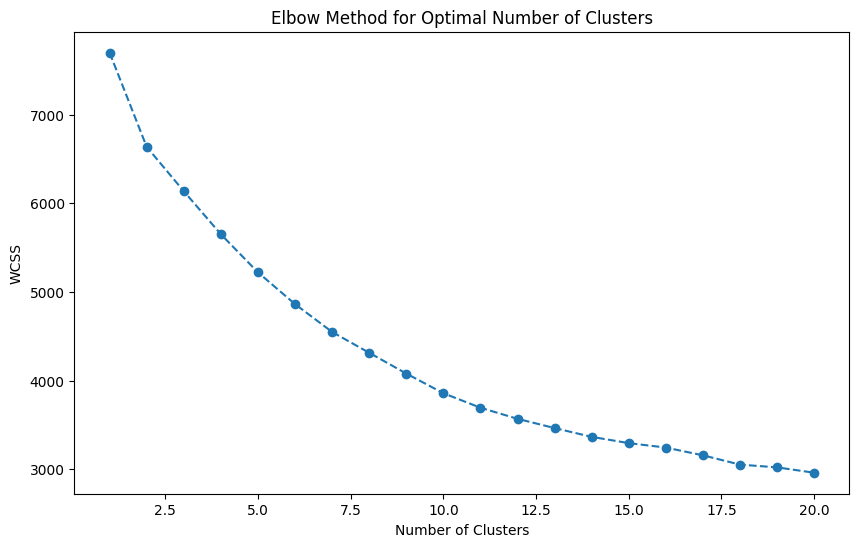

In [95]:
# Determine the optimal number of clusters using the elbow method
wcss = []
for i in range(1, 21):
    kmeans = KMeans(n_clusters=i, random_state=123, algorithm='lloyd', init='random', max_iter=300, n_init=30)
    kmeans.fit(combined_matrix_scaled)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 21), wcss, marker='o', linestyle='--')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

In [96]:
# Apply K-means clustering with the best hyperparameters
kmeans = KMeans(n_clusters=12, random_state=123, algorithm='lloyd', init='random', max_iter=300, n_init=30)
clusters = kmeans.fit_predict(combined_matrix_scaled)

# Add the cluster labels to the merged data
combined_matrix.reset_index(inplace=True)
combined_matrix['Cluster'] = clusters

In [97]:
combined_matrix.rename(columns={'index': 'Company'}, inplace=True)

In [98]:
combined_matrix = pd.merge(combined_matrix, gics_df, on='Company')

In [99]:
combined_matrix.head()

,Company,avg_return_pre_crisis,volatility_pre_crisis,avg_return_crisis,volatility_crisis,avg_return_post_crisis,volatility_post_crisis,avg_return_covid,volatility_covid,avg_return_post_covid,...,Corr_PCA_4,Corr_PCA_5,Corr_PCA_6,Corr_PCA_7,Corr_PCA_8,Corr_PCA_9,Corr_PCA_10,Cluster,GICS Sector,GICS Industry
0,MSFT,0.000356,0.011085,0.000020,0.025123,0.000914,0.014376,0.000832,0.021890,0.001960,...,-0.043815,-0.051669,-0.328803,-0.074152,0.135557,0.302901,0.160217,6,Technology,Software - Infrastructure
1,AAPL,0.003060,0.024775,0.001281,0.030126,0.001194,0.016205,0.001053,0.023264,0.001678,...,-0.056128,-0.229598,-0.190066,-0.162563,0.152557,0.141500,0.104978,3,Technology,Consumer Electronics
2,NVDA,0.002036,0.030606,-0.000298,0.042996,0.001507,0.025704,0.001829,0.035245,0.005338,...,-0.052182,-0.463892,-0.328701,-0.143165,0.299999,0.134455,-0.002337,11,Technology,Semiconductors
3,AMZN,-0.000049,0.024757,0.001856,0.036857,0.001374,0.020287,0.000177,0.024624,0.002588,...,-0.348478,-0.260385,-0.168526,-0.150053,0.081144,0.131398,0.199323,1,Consumer Cyclical,Internet Retail
4,BRK-B,0.000391,0.008356,-0.000154,0.021217,0.000582,0.011497,0.000540,0.016116,0.000612,...,0.119224,0.420520,-0.023988,0.065813,0.101182,-0.017378,0.017296,6,Financial Services,Insurance - Diversified


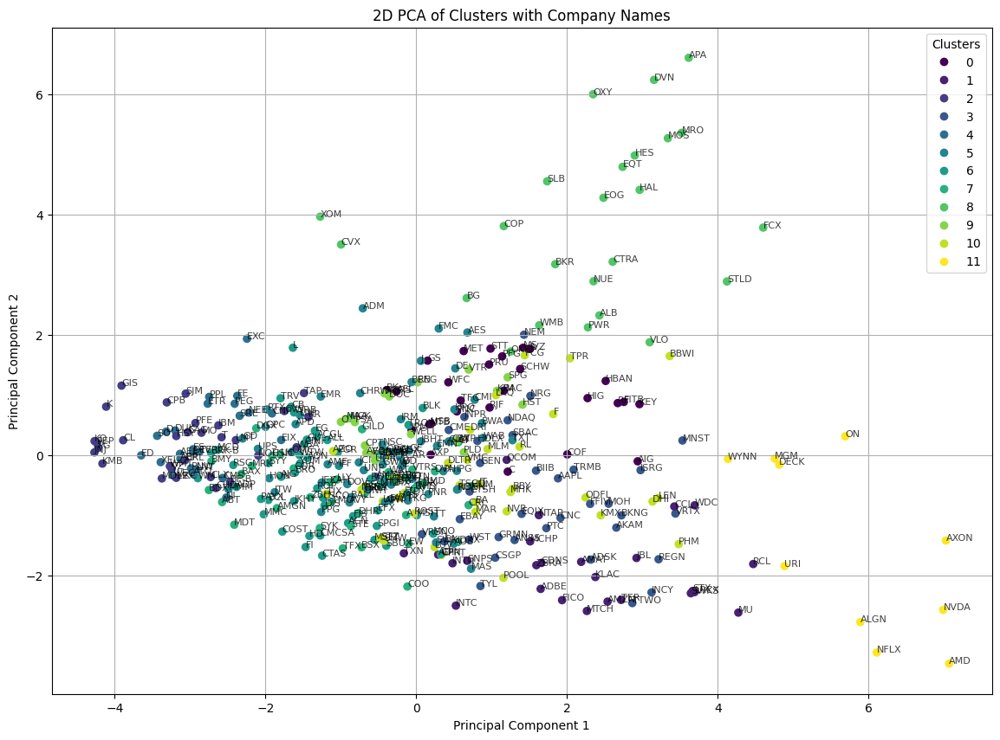

In [100]:
pca_2d = PCA(n_components=2)
components_2d = pca_2d.fit_transform(combined_matrix_scaled)

# Create 2D plot with annotations
plt.figure(figsize=(14, 10))
scatter = plt.scatter(components_2d[:, 0], components_2d[:, 1], c=clusters, cmap='viridis')
plt.legend(*scatter.legend_elements(), title="Clusters")
plt.title('2D PCA of Clusters with Company Names')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)

for i, txt in enumerate(combined_matrix['Company']):
    plt.annotate(txt, (components_2d[i, 0], components_2d[i, 1]), fontsize=8, alpha=0.75)

plt.show()

###**9.1.2 🌼🌼🌼 Count and percentage of industry sector in each cluster**

Update: repeat this for multiple n_clusters

In [101]:
n_cluster_options = range(2, 21)
kmeans_third_labels = {}

for n_cluster in n_cluster_options:
    kmeans = KMeans(n_clusters=n_cluster, random_state=123, algorithm='lloyd', init='k-means++', max_iter=300, n_init=30)
    kmeans.fit(combined_matrix_scaled)
    kmeans_labels = kmeans.labels_
    kmeans_third_labels[n_cluster] = kmeans_labels

In [102]:
kmeans_third_sector_count_dfs = {}
kmeans_third_sector_percentage_dfs = {}

for n_cluster in n_cluster_options:
    cluster_labels = kmeans_third_labels[n_cluster]
    sector_counts = pd.DataFrame({'Cluster': cluster_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
    kmeans_third_sector_count_dfs[n_cluster] = sector_counts
    sector_percentages = sector_counts.div(sector_counts.sum(axis=1), axis=0) * 100
    kmeans_third_sector_percentage_dfs[n_cluster] = sector_percentages

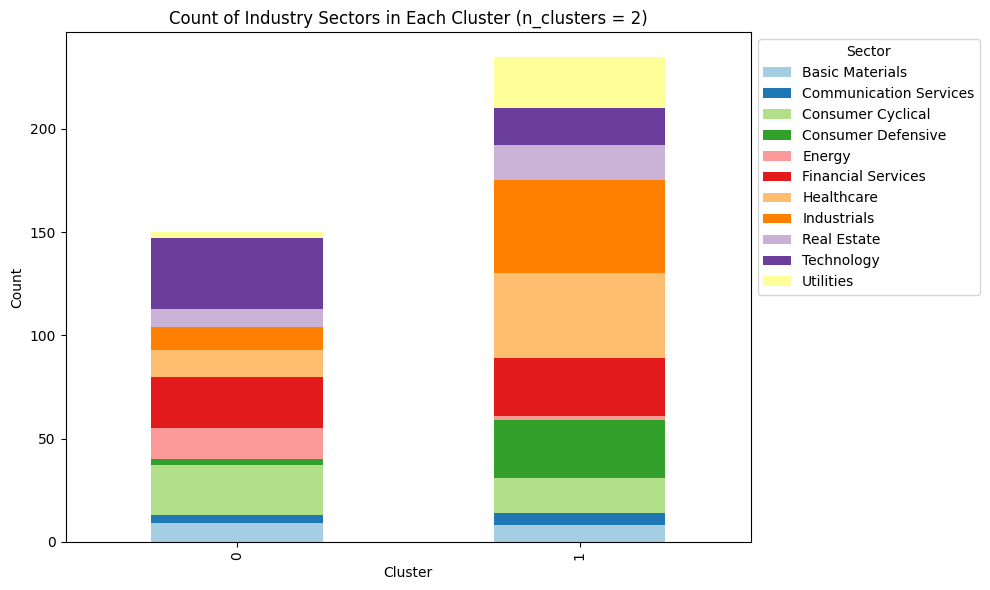

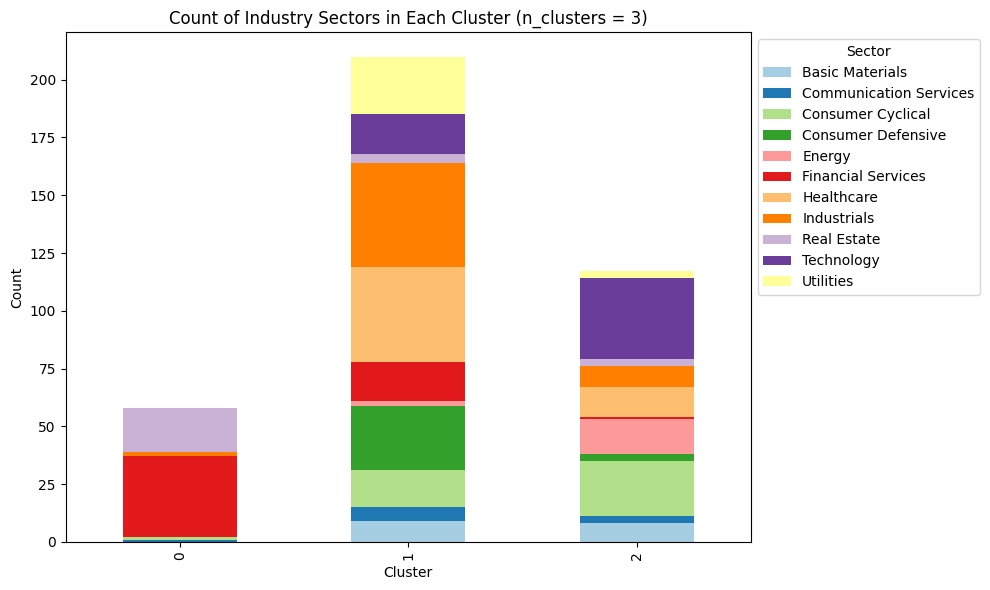

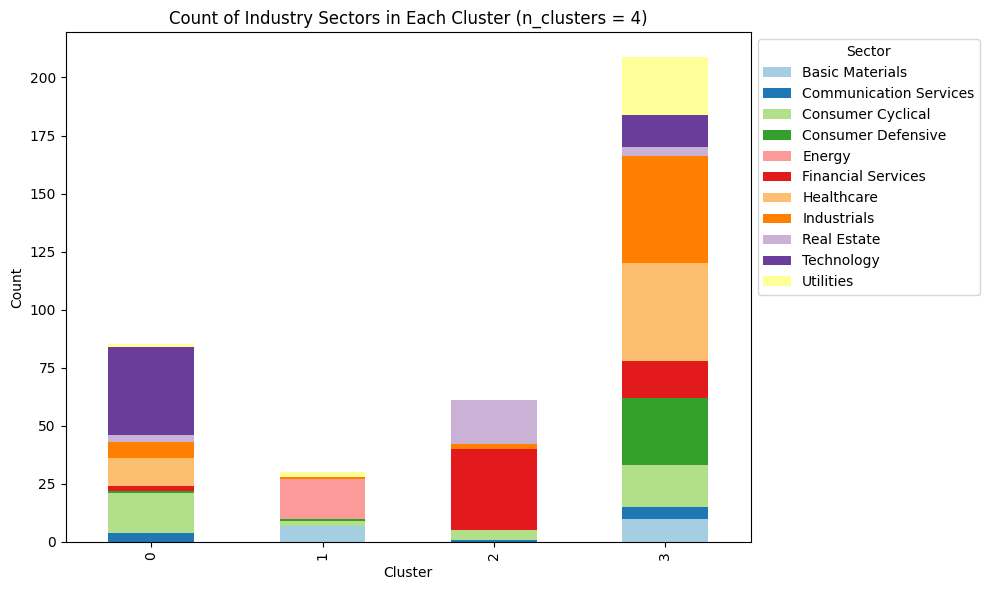

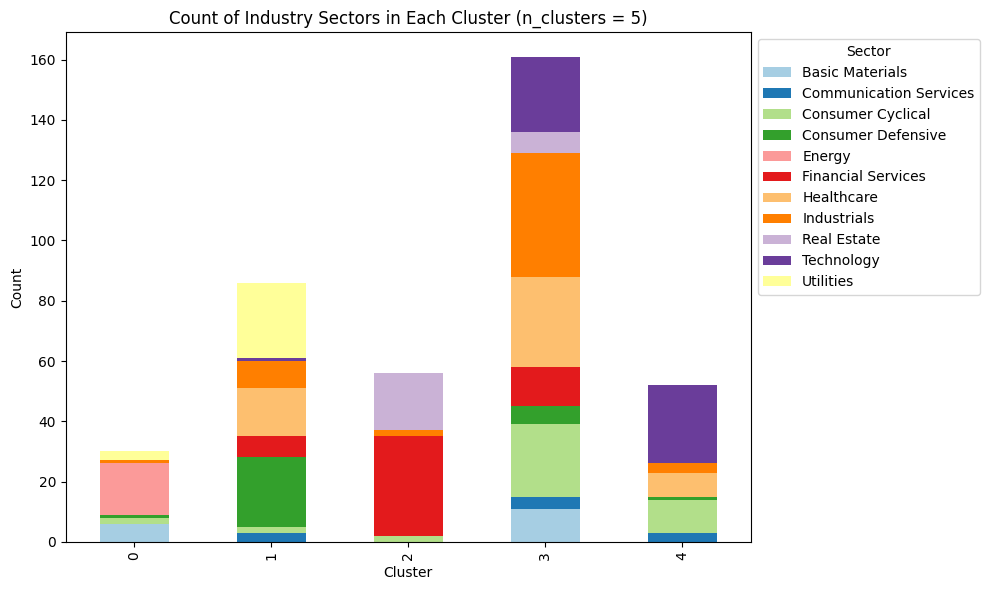

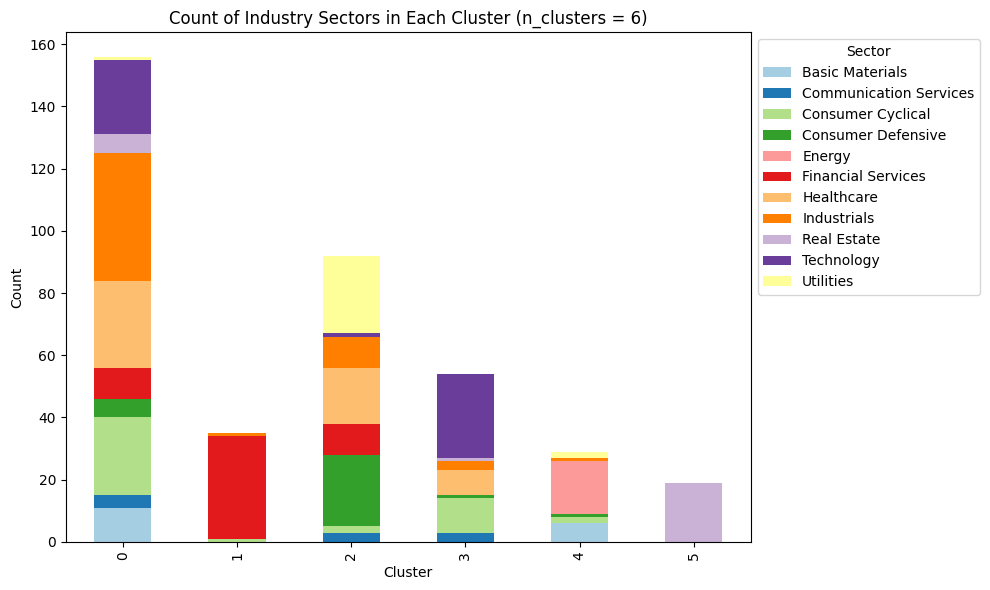

...

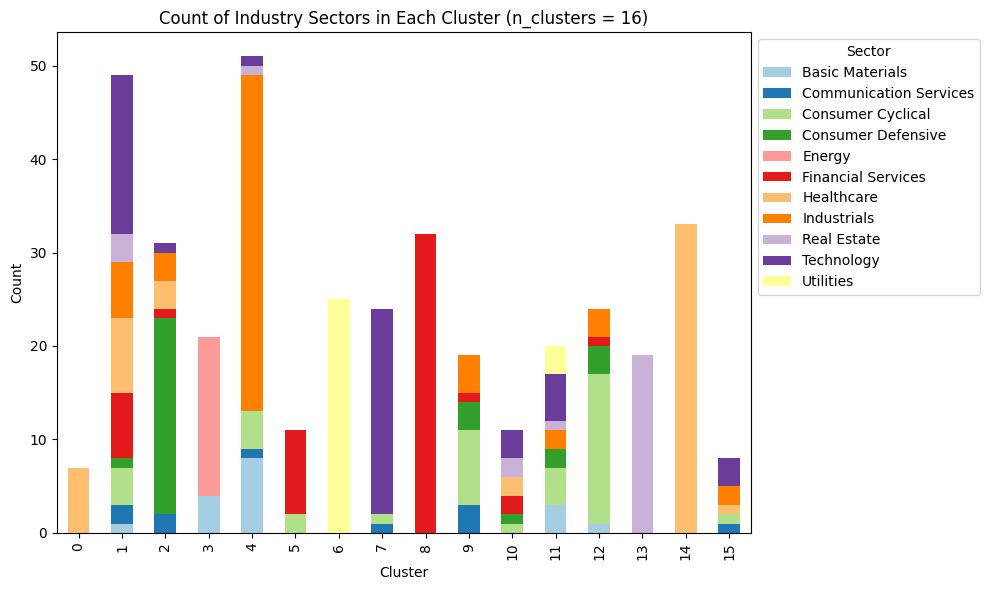

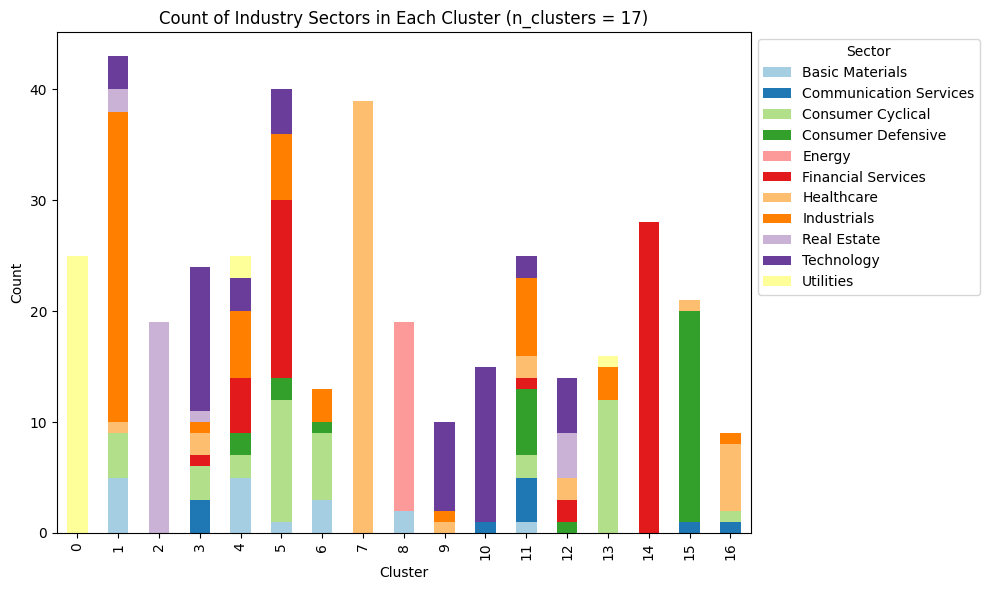

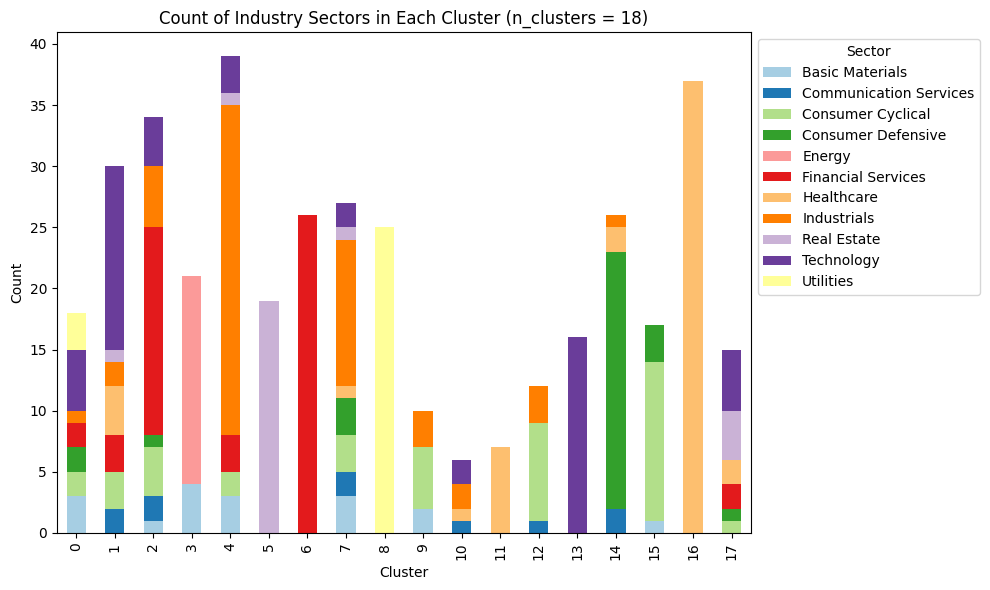

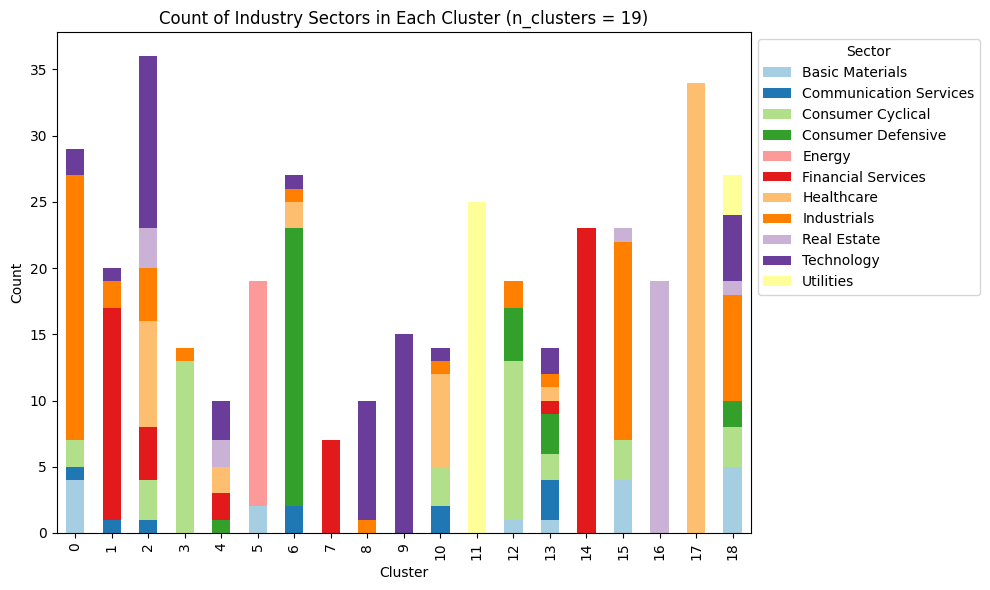

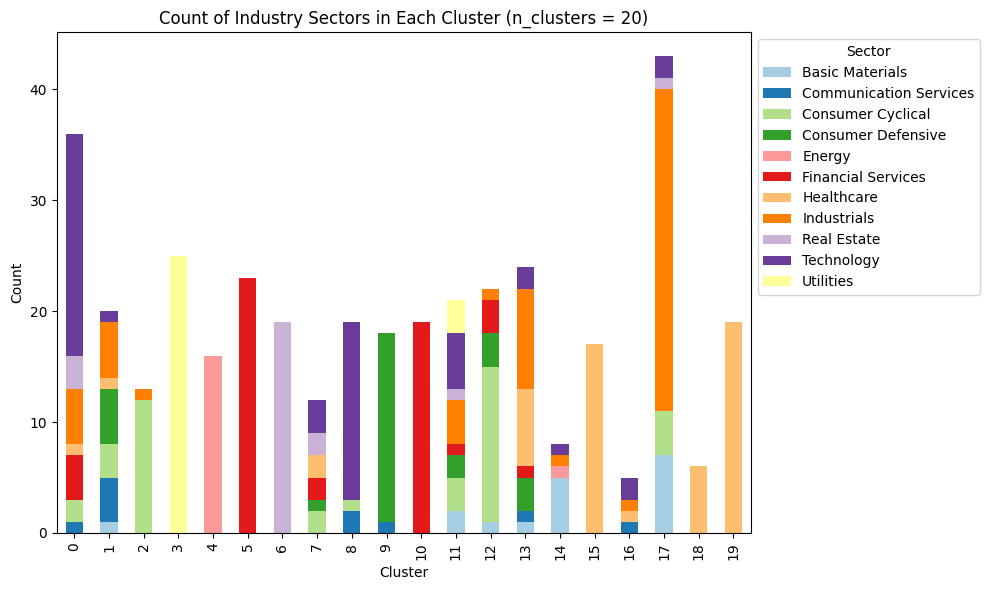

In [103]:
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))

# Stacked bar charts
for n_cluster in n_cluster_options:
    kmeans_third_sector_count_df = kmeans_third_sector_count_dfs[n_cluster]

    ax = kmeans_third_sector_count_df.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
    plt.title(f'Count of Industry Sectors in Each Cluster (n_clusters = {n_cluster})')
    plt.xlabel('Cluster')
    plt.ylabel('Count')
    plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

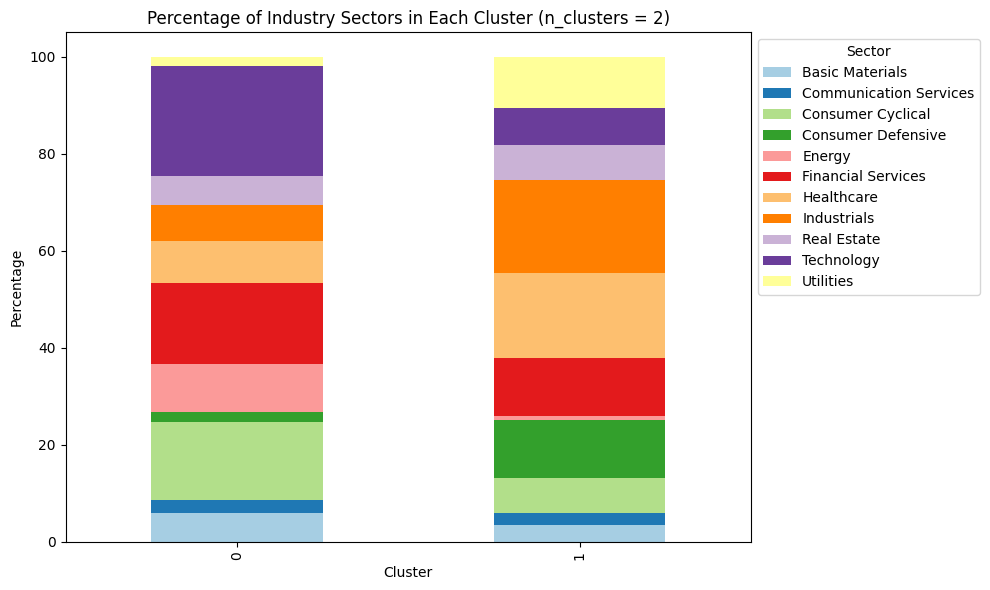

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       6.000000                2.666667          16.000000   
1                       3.404255                2.553191           7.234043   

Industry Sector  Consumer Defensive     Energy  Financial Services  \
Cluster                                                              
0                          2.000000  10.000000           16.666667   
1                         11.914894   0.851064           11.914894   

Industry Sector  Healthcare  Industrials  Real Estate  Technology  Utilities  
Cluster                                                                       
0                  8.666667     7.333333     6.000000   22.666667   2.000000  
1                 17.446809    19.148936     7.234043    7.659574  10.638298  


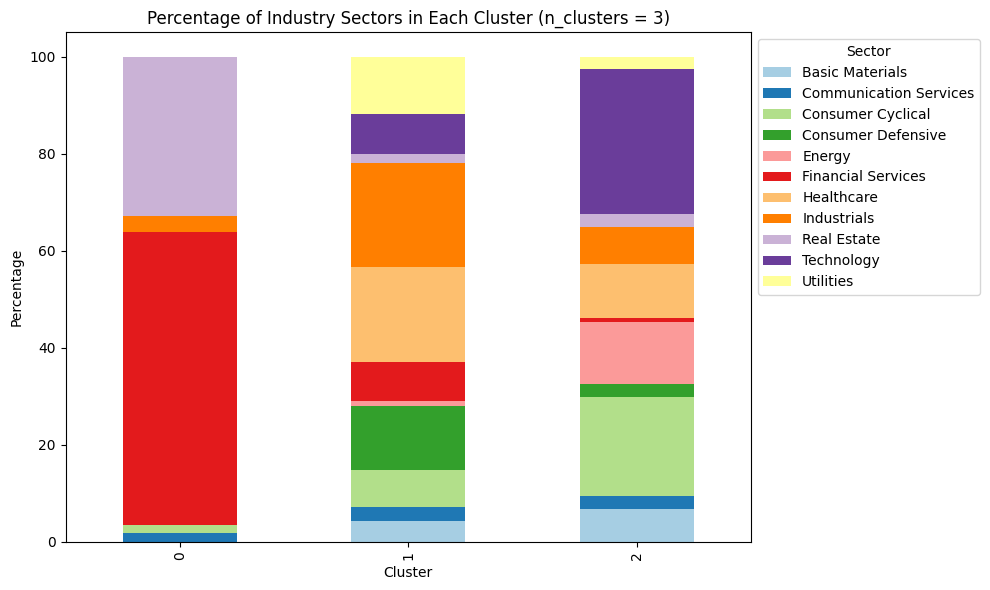

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                1.724138           1.724138   
1                       4.285714                2.857143           7.619048   
2                       6.837607                2.564103          20.512821   

Industry Sector  Consumer Defensive     Energy  Financial Services  \
Cluster                                                              
0                          0.000000   0.000000           60.344828   
1                         13.333333   0.952381            8.095238   
2                          2.564103  12.820513            0.854701   

Industry Sector  Healthcare  Industrials  Real Estate  Technology  Utilities  
Cluster                                                                       
0                  0.000000     3.448276    32.758621    0.000000   0.000000  
1               

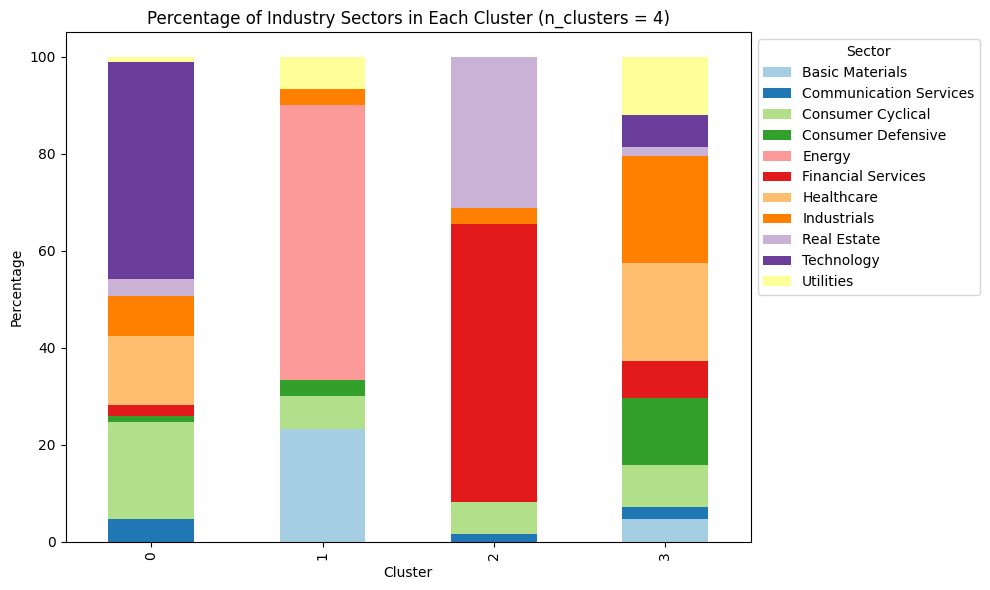

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                4.705882          20.000000   
1                      23.333333                0.000000           6.666667   
2                       0.000000                1.639344           6.557377   
3                       4.784689                2.392344           8.612440   

Industry Sector  Consumer Defensive     Energy  Financial Services  \
Cluster                                                              
0                          1.176471   0.000000            2.352941   
1                          3.333333  56.666667            0.000000   
2                          0.000000   0.000000           57.377049   
3                         13.875598   0.000000            7.655502   

Industry Sector  Healthcare  Industrials  Real Estate  Technology  Utilities  
Cluster                  

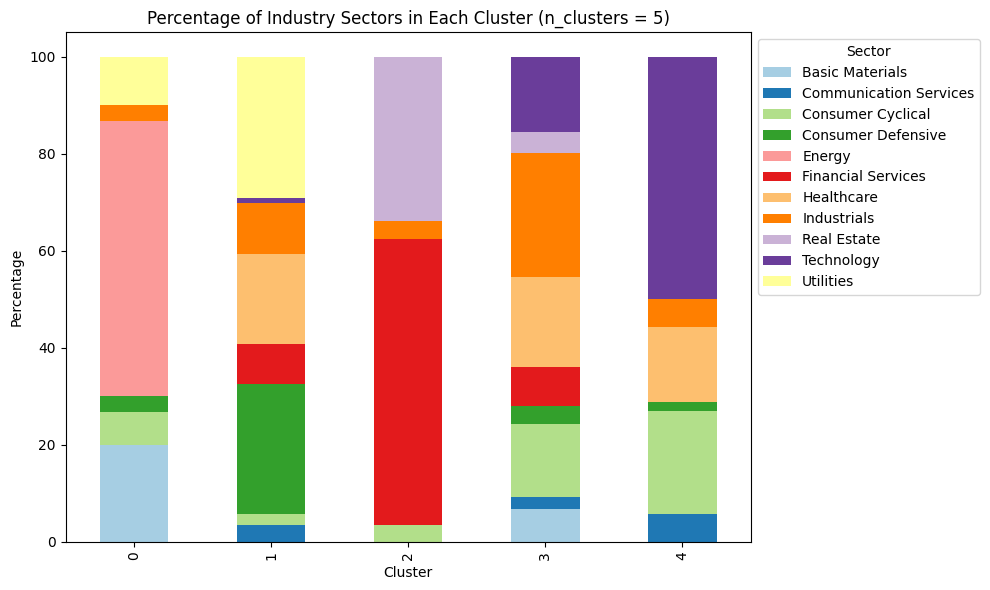

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      20.000000                0.000000           6.666667   
1                       0.000000                3.488372           2.325581   
2                       0.000000                0.000000           3.571429   
3                       6.832298                2.484472          14.906832   
4                       0.000000                5.769231          21.153846   

Industry Sector  Consumer Defensive     Energy  Financial Services  \
Cluster                                                              
0                          3.333333  56.666667            0.000000   
1                         26.744186   0.000000            8.139535   
2                          0.000000   0.000000           58.928571   
3                          3.726708   0.000000            8.074534   
4                         

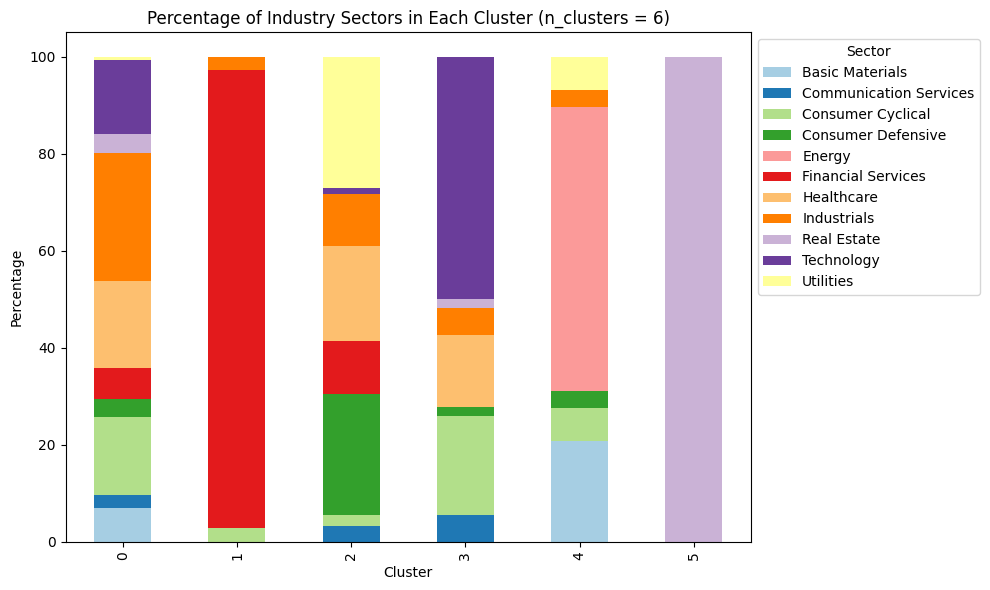

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       7.051282                2.564103          16.025641   
1                       0.000000                0.000000           2.857143   
2                       0.000000                3.260870           2.173913   
3                       0.000000                5.555556          20.370370   
4                      20.689655                0.000000           6.896552   
5                       0.000000                0.000000           0.000000   

Industry Sector  Consumer Defensive    Energy  Financial Services  Healthcare  \
Cluster                                                                         
0                          3.846154   0.00000            6.410256   17.948718   
1                          0.000000   0.00000           94.285714    0.000000   
2                         25.000000   0.000

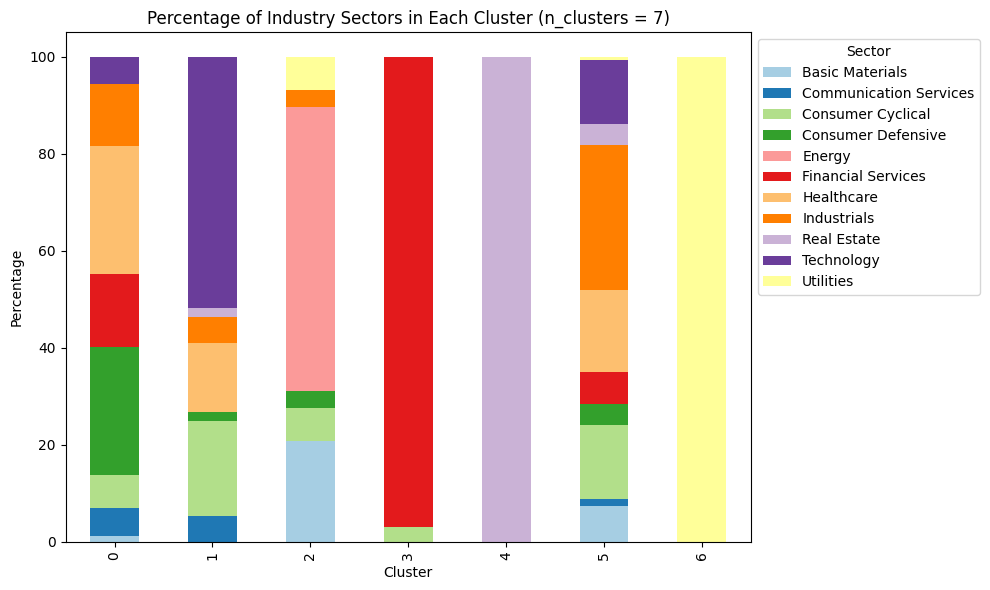

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       1.149425                5.747126           6.896552   
1                       0.000000                5.357143          19.642857   
2                      20.689655                0.000000           6.896552   
3                       0.000000                0.000000           3.125000   
4                       0.000000                0.000000           0.000000   
5                       7.299270                1.459854          15.328467   
6                       0.000000                0.000000           0.000000   

Industry Sector  Consumer Defensive    Energy  Financial Services  Healthcare  \
Cluster                                                                         
0                         26.436782   0.00000           14.942529   26.436782   
1                          1.785714   0.00000

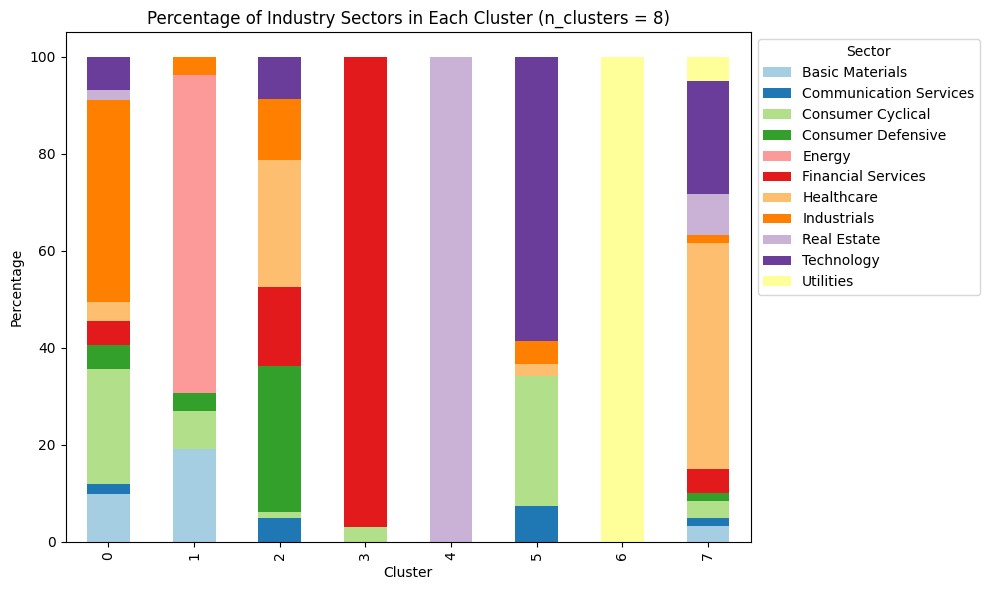

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       9.900990                1.980198          23.762376   
1                      19.230769                0.000000           7.692308   
2                       0.000000                5.000000           1.250000   
3                       0.000000                0.000000           3.030303   
4                       0.000000                0.000000           0.000000   
5                       0.000000                7.317073          26.829268   
6                       0.000000                0.000000           0.000000   
7                       3.333333                1.666667           3.333333   

Industry Sector  Consumer Defensive     Energy  Financial Services  \
Cluster                                                              
0                          4.950495   0.000000            4.950495   

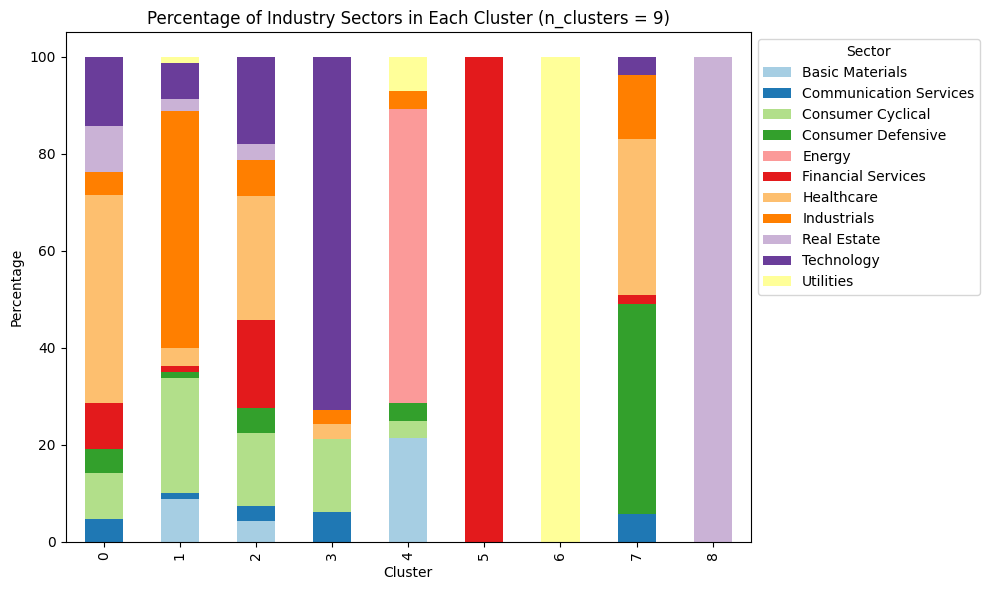

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                4.761905           9.523810   
1                       8.750000                1.250000          23.750000   
2                       4.255319                3.191489          14.893617   
3                       0.000000                6.060606          15.151515   
4                      21.428571                0.000000           3.571429   
5                       0.000000                0.000000           0.000000   
6                       0.000000                0.000000           0.000000   
7                       0.000000                5.660377           0.000000   
8                       0.000000                0.000000           0.000000   

Industry Sector  Consumer Defensive     Energy  Financial Services  \
Cluster                                                     

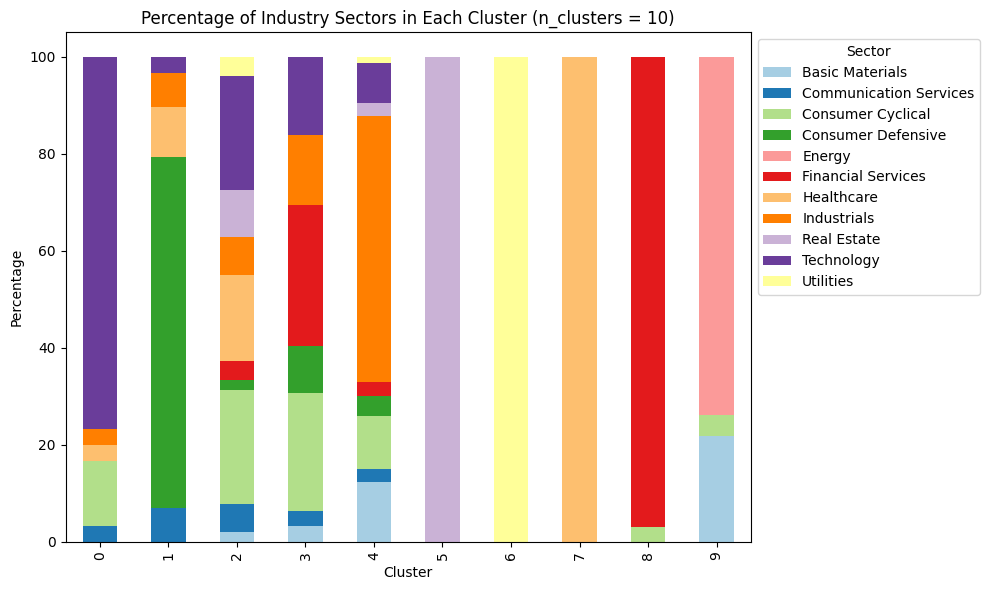

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                3.333333          13.333333   
1                       0.000000                6.896552           0.000000   
2                       1.960784                5.882353          23.529412   
3                       3.225806                3.225806          24.193548   
4                      12.328767                2.739726          10.958904   
5                       0.000000                0.000000           0.000000   
6                       0.000000                0.000000           0.000000   
7                       0.000000                0.000000           0.000000   
8                       0.000000                0.000000           3.125000   
9                      21.739130                0.000000           4.347826   

Industry Sector  Consumer Defensive     Energy  Fin

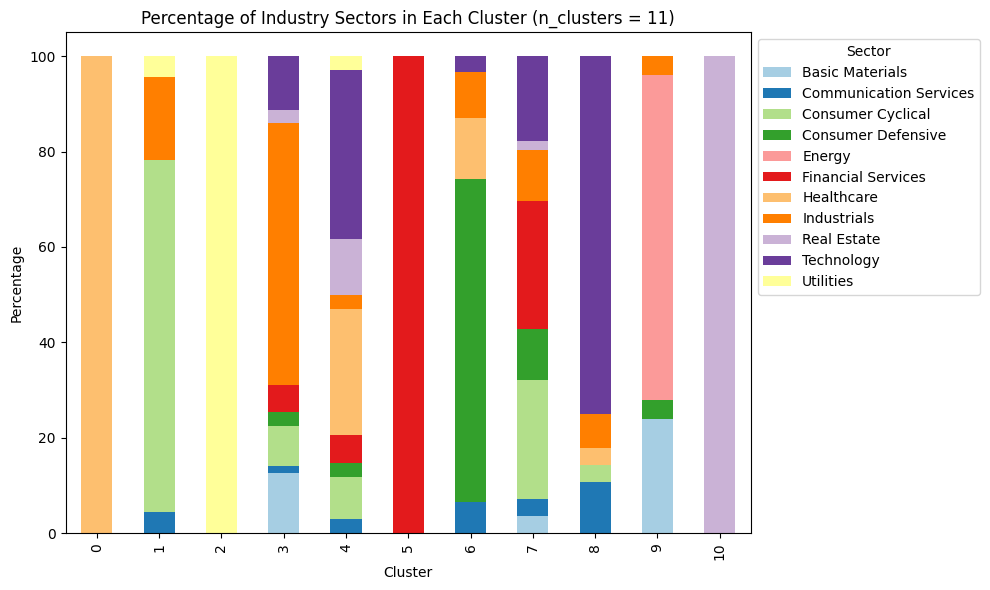

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                0.000000           0.000000   
1                       0.000000                4.347826          73.913043   
2                       0.000000                0.000000           0.000000   
3                      12.676056                1.408451           8.450704   
4                       0.000000                2.941176           8.823529   
5                       0.000000                0.000000           0.000000   
6                       0.000000                6.451613           0.000000   
7                       3.571429                3.571429          25.000000   
8                       0.000000               10.714286           3.571429   
9                      24.000000                0.000000           0.000000   
10                      0.000000                0.00

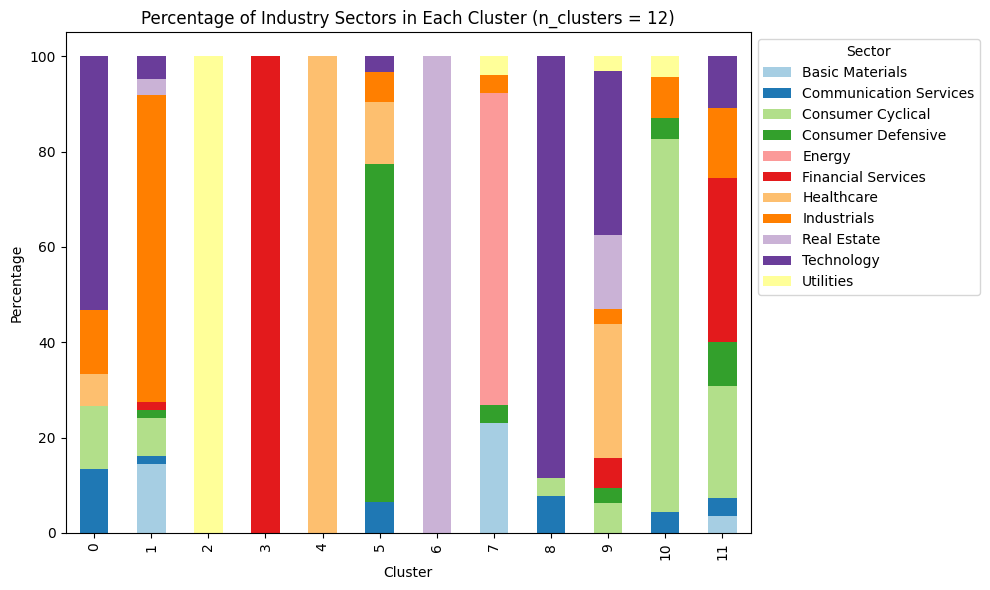

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000               13.333333          13.333333   
1                      14.516129                1.612903           8.064516   
2                       0.000000                0.000000           0.000000   
3                       0.000000                0.000000           0.000000   
4                       0.000000                0.000000           0.000000   
5                       0.000000                6.451613           0.000000   
6                       0.000000                0.000000           0.000000   
7                      23.076923                0.000000           0.000000   
8                       0.000000                7.692308           3.846154   
9                       0.000000                0.000000           6.250000   
10                      0.000000                4.34

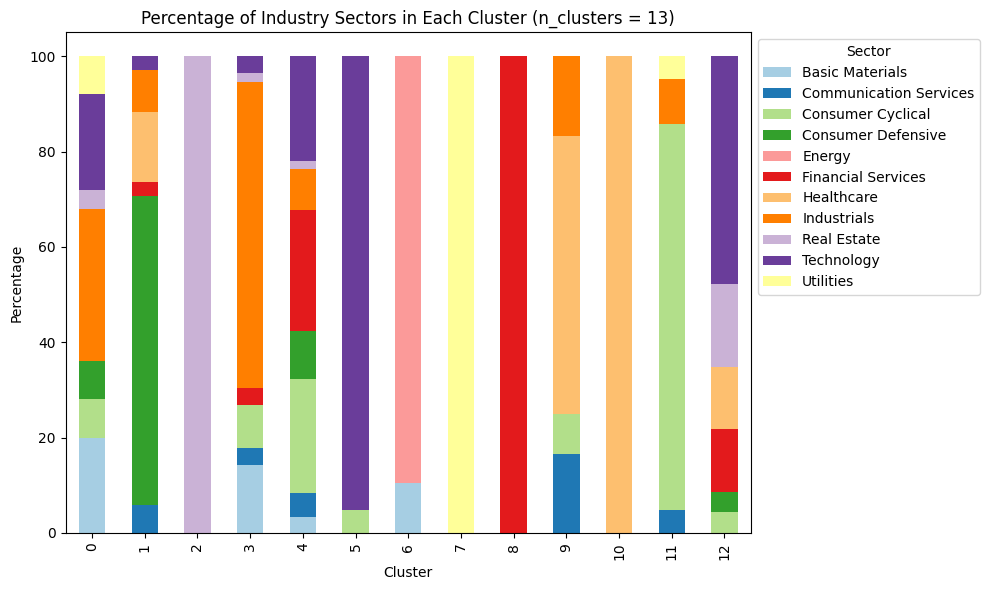

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      20.000000                0.000000           8.000000   
1                       0.000000                5.882353           0.000000   
2                       0.000000                0.000000           0.000000   
3                      14.285714                3.571429           8.928571   
4                       3.389831                5.084746          23.728814   
5                       0.000000                0.000000           4.761905   
6                      10.526316                0.000000           0.000000   
7                       0.000000                0.000000           0.000000   
8                       0.000000                0.000000           0.000000   
9                       0.000000               16.666667           8.333333   
10                      0.000000                0.00

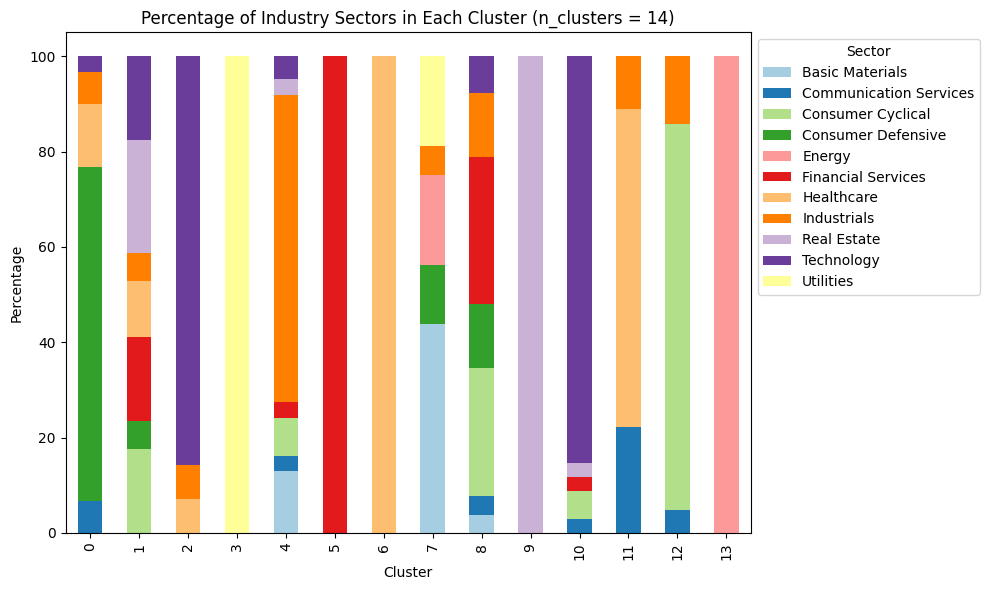

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                6.666667           0.000000   
1                       0.000000                0.000000          17.647059   
2                       0.000000                0.000000           0.000000   
3                       0.000000                0.000000           0.000000   
4                      12.903226                3.225806           8.064516   
5                       0.000000                0.000000           0.000000   
6                       0.000000                0.000000           0.000000   
7                      43.750000                0.000000           0.000000   
8                       3.846154                3.846154          26.923077   
9                       0.000000                0.000000           0.000000   
10                      0.000000                2.94

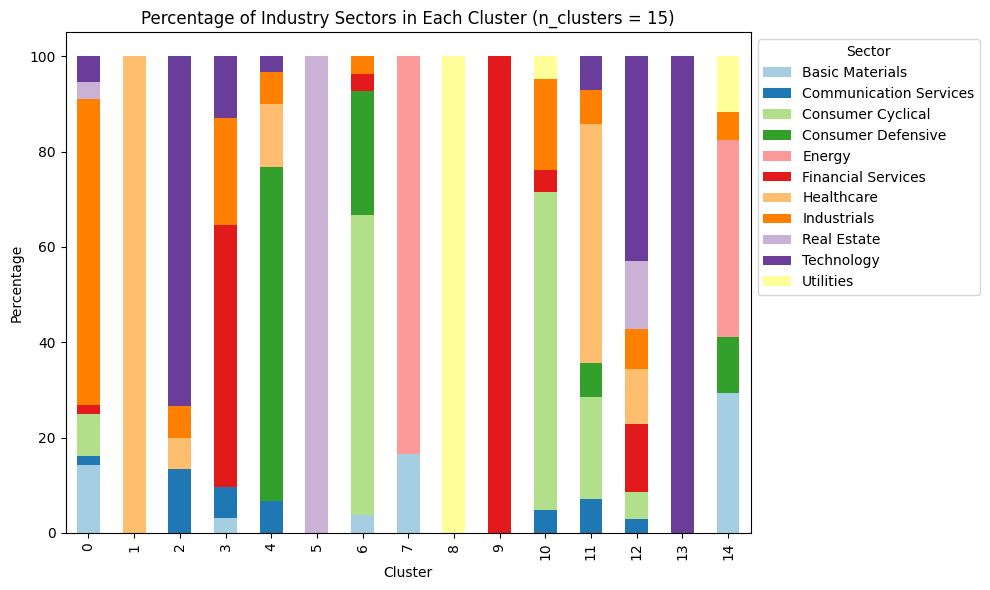

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      14.285714                1.785714           8.928571   
1                       0.000000                0.000000           0.000000   
2                       0.000000               13.333333           0.000000   
3                       3.225806                6.451613           0.000000   
4                       0.000000                6.666667           0.000000   
5                       0.000000                0.000000           0.000000   
6                       3.703704                0.000000          62.962963   
7                      16.666667                0.000000           0.000000   
8                       0.000000                0.000000           0.000000   
9                       0.000000                0.000000           0.000000   
10                      0.000000                4.76

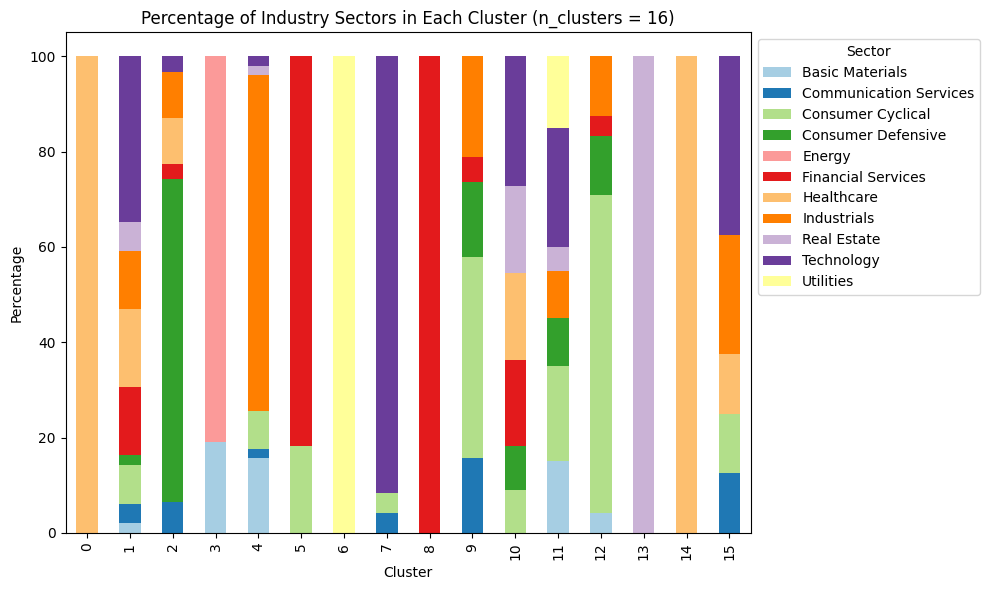

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                0.000000           0.000000   
1                       2.040816                4.081633           8.163265   
2                       0.000000                6.451613           0.000000   
3                      19.047619                0.000000           0.000000   
4                      15.686275                1.960784           7.843137   
5                       0.000000                0.000000          18.181818   
6                       0.000000                0.000000           0.000000   
7                       0.000000                4.166667           4.166667   
8                       0.000000                0.000000           0.000000   
9                       0.000000               15.789474          42.105263   
10                      0.000000                0.00

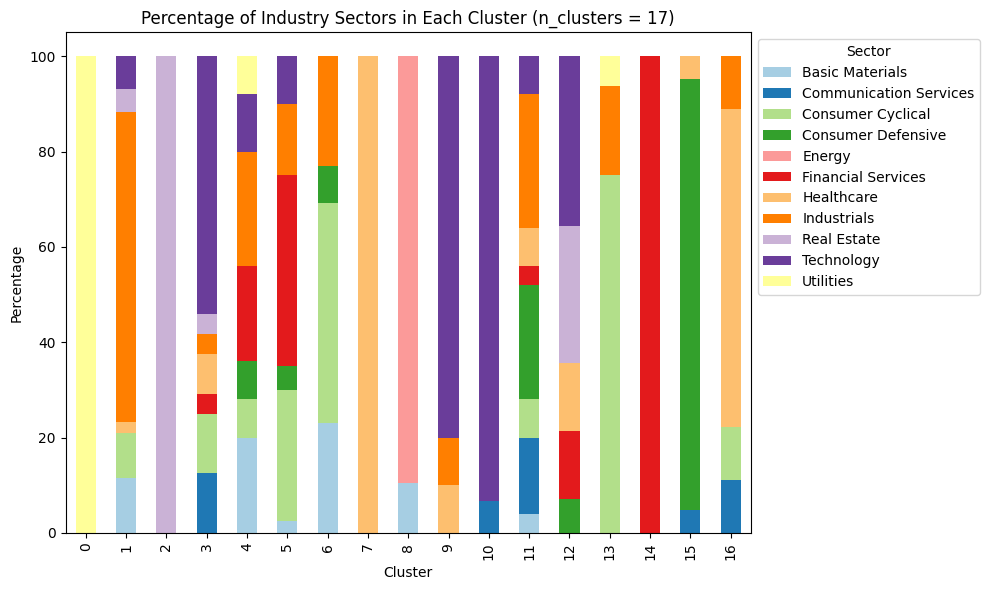

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                0.000000           0.000000   
1                      11.627907                0.000000           9.302326   
2                       0.000000                0.000000           0.000000   
3                       0.000000               12.500000          12.500000   
4                      20.000000                0.000000           8.000000   
5                       2.500000                0.000000          27.500000   
6                      23.076923                0.000000          46.153846   
7                       0.000000                0.000000           0.000000   
8                      10.526316                0.000000           0.000000   
9                       0.000000                0.000000           0.000000   
10                      0.000000                6.66

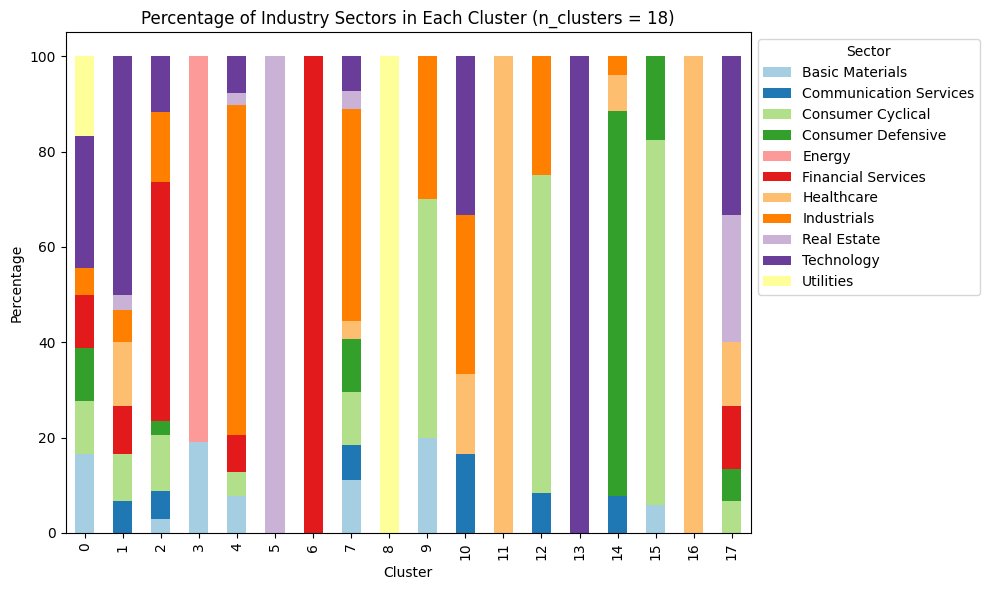

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      16.666667                0.000000          11.111111   
1                       0.000000                6.666667          10.000000   
2                       2.941176                5.882353          11.764706   
3                      19.047619                0.000000           0.000000   
4                       7.692308                0.000000           5.128205   
5                       0.000000                0.000000           0.000000   
6                       0.000000                0.000000           0.000000   
7                      11.111111                7.407407          11.111111   
8                       0.000000                0.000000           0.000000   
9                      20.000000                0.000000          50.000000   
10                      0.000000               16.66

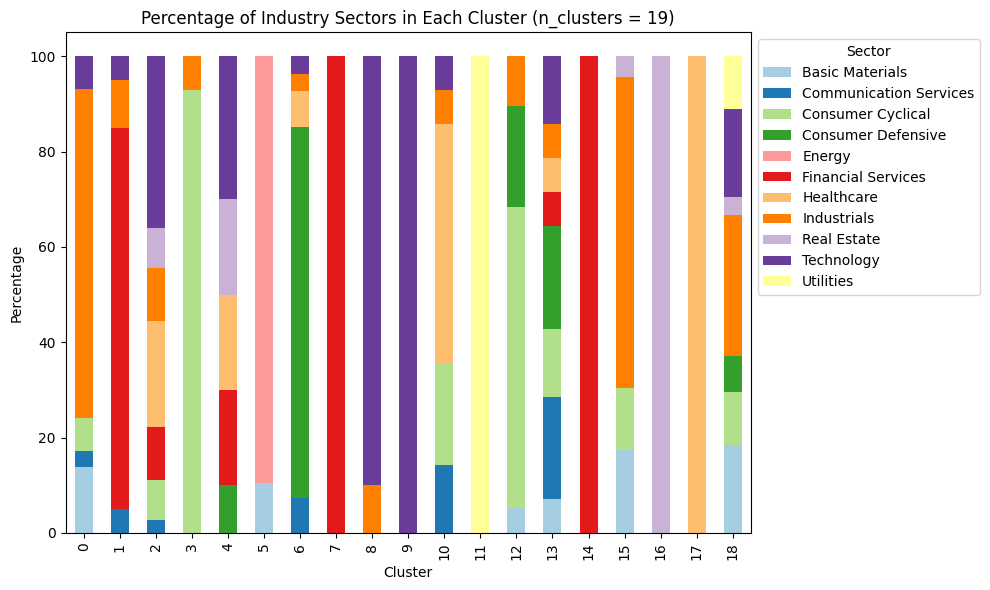

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      13.793103                3.448276           6.896552   
1                       0.000000                5.000000           0.000000   
2                       0.000000                2.777778           8.333333   
3                       0.000000                0.000000          92.857143   
4                       0.000000                0.000000           0.000000   
5                      10.526316                0.000000           0.000000   
6                       0.000000                7.407407           0.000000   
7                       0.000000                0.000000           0.000000   
8                       0.000000                0.000000           0.000000   
9                       0.000000                0.000000           0.000000   
10                      0.000000               14.28

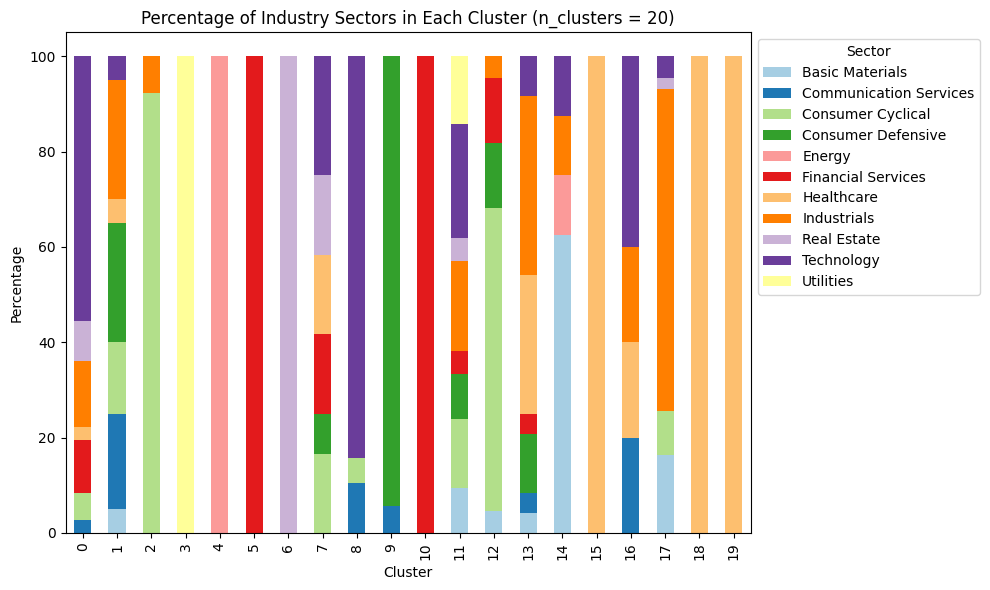

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                2.777778           5.555556   
1                       5.000000               20.000000          15.000000   
2                       0.000000                0.000000          92.307692   
3                       0.000000                0.000000           0.000000   
4                       0.000000                0.000000           0.000000   
5                       0.000000                0.000000           0.000000   
6                       0.000000                0.000000           0.000000   
7                       0.000000                0.000000          16.666667   
8                       0.000000               10.526316           5.263158   
9                       0.000000                5.555556           0.000000   
10                      0.000000                0.00

In [104]:
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))

# Stacked bar charts
for n_cluster in n_cluster_options:
    kmeans_third_sector_percentage_df = kmeans_third_sector_percentage_dfs[n_cluster]

    ax = kmeans_third_sector_percentage_df.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
    plt.title(f'Percentage of Industry Sectors in Each Cluster (n_clusters = {n_cluster})')
    plt.xlabel('Cluster')
    plt.ylabel('Percentage')
    plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    print(kmeans_third_sector_percentage_df)

####🌼🌼🌼 Plots for different periods

[0.33016674 0.51761844 0.62621041 0.6792233  0.71006118 0.72633904
 0.73967569 0.75001593 0.7592605  0.76644442]


<Figure size 800x600 with 0 Axes>

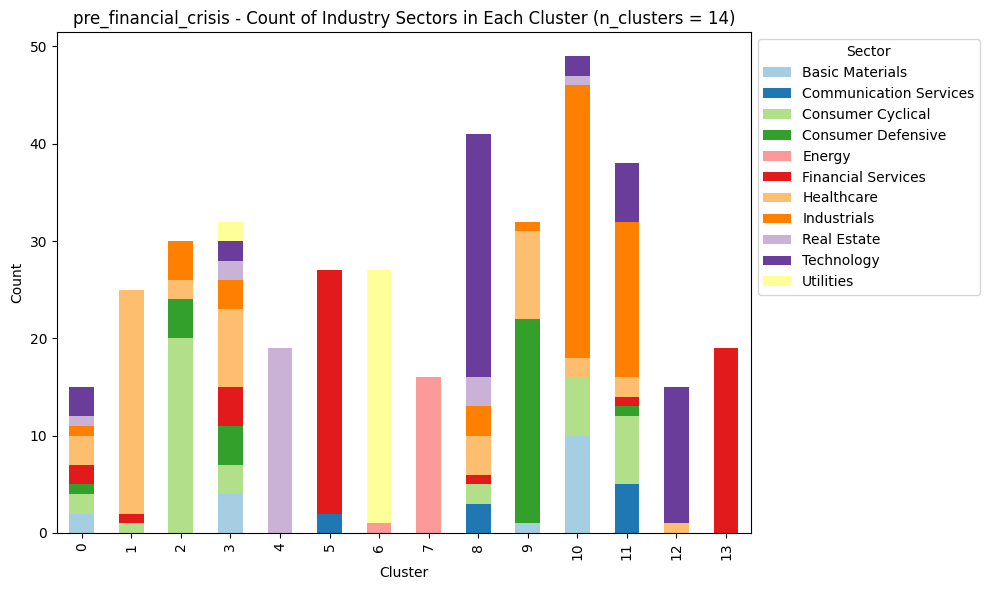

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      13.333333                0.000000          13.333333   
1                       0.000000                0.000000           4.000000   
2                       0.000000                0.000000          66.666667   
3                      12.500000                0.000000           9.375000   
4                       0.000000                0.000000           0.000000   
5                       0.000000                7.407407           0.000000   
6                       0.000000                0.000000           0.000000   
7                       0.000000                0.000000           0.000000   
8                       0.000000                7.317073           4.878049   
9                       3.125000                0.000000           0.000000   
10                     20.408163                0.00

<Figure size 800x600 with 0 Axes>

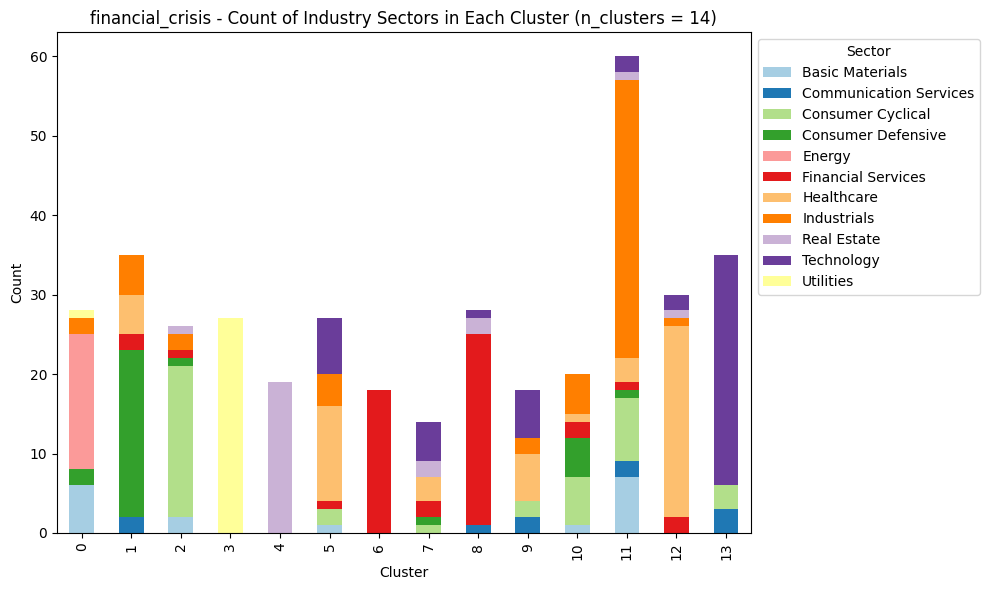

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      21.428571                0.000000           0.000000   
1                       0.000000                5.714286           0.000000   
2                       7.692308                0.000000          73.076923   
3                       0.000000                0.000000           0.000000   
4                       0.000000                0.000000           0.000000   
5                       3.703704                0.000000           7.407407   
6                       0.000000                0.000000           0.000000   
7                       0.000000                0.000000           7.142857   
8                       0.000000                3.571429           0.000000   
9                       0.000000               11.111111          11.111111   
10                      5.000000                0.00

<Figure size 800x600 with 0 Axes>

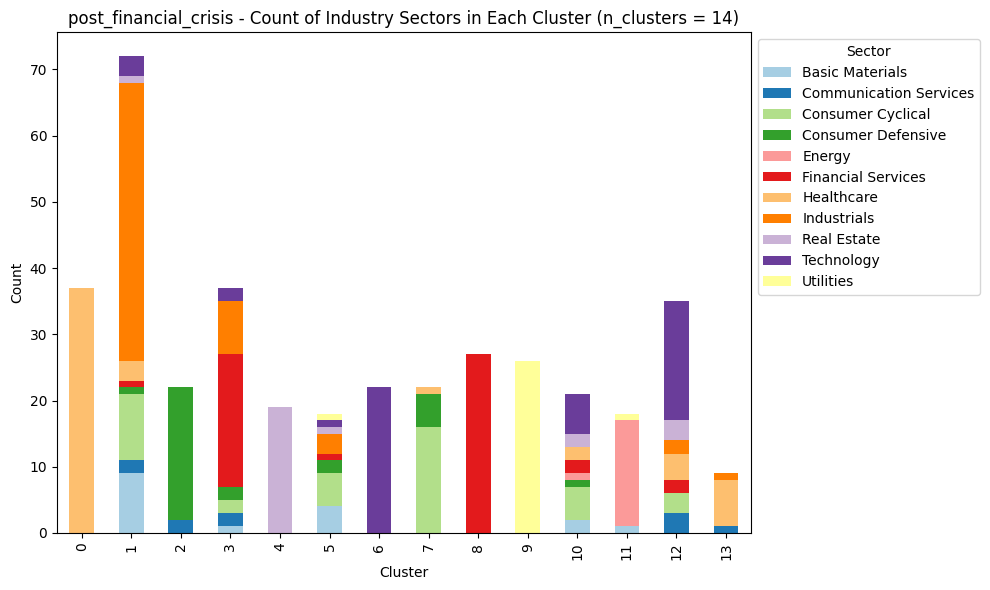

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                0.000000           0.000000   
1                      12.500000                2.777778          13.888889   
2                       0.000000                9.090909           0.000000   
3                       2.702703                5.405405           5.405405   
4                       0.000000                0.000000           0.000000   
5                      22.222222                0.000000          27.777778   
6                       0.000000                0.000000           0.000000   
7                       0.000000                0.000000          72.727273   
8                       0.000000                0.000000           0.000000   
9                       0.000000                0.000000           0.000000   
10                      9.523810                0.00

<Figure size 800x600 with 0 Axes>

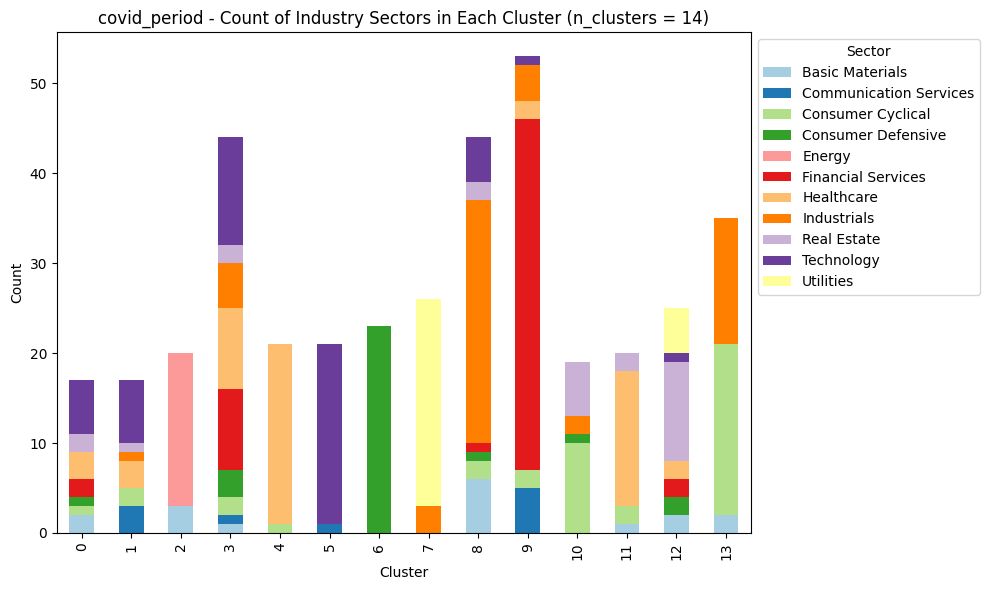

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      11.764706                0.000000           5.882353   
1                       0.000000               17.647059          11.764706   
2                      15.000000                0.000000           0.000000   
3                       2.272727                2.272727           4.545455   
4                       0.000000                0.000000           4.761905   
5                       0.000000                4.761905           0.000000   
6                       0.000000                0.000000           0.000000   
7                       0.000000                0.000000           0.000000   
8                      13.636364                0.000000           4.545455   
9                       0.000000                9.433962           3.773585   
10                      0.000000                0.00

<Figure size 800x600 with 0 Axes>

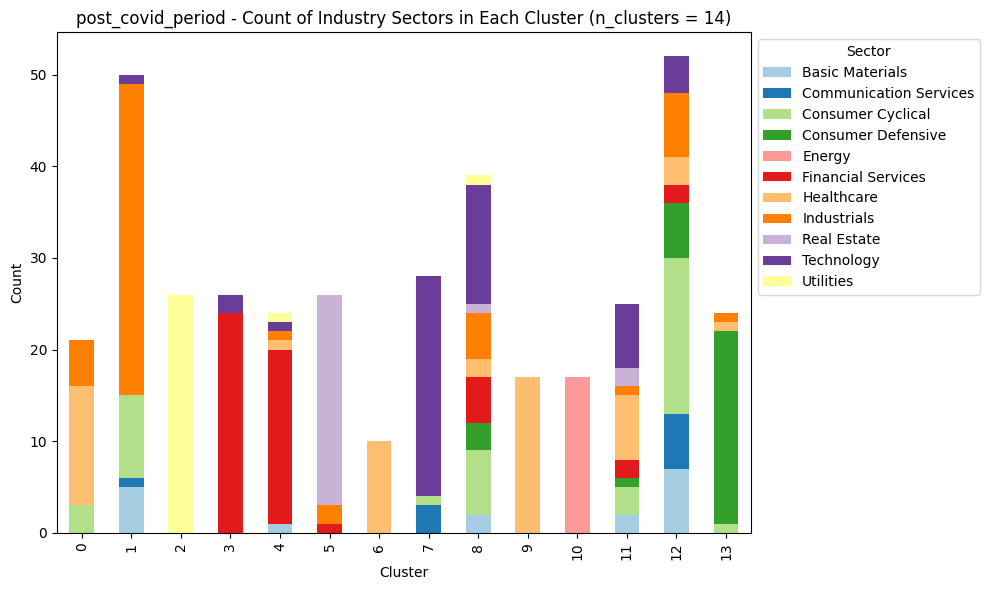

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                0.000000          14.285714   
1                      10.000000                2.000000          18.000000   
2                       0.000000                0.000000           0.000000   
3                       0.000000                0.000000           0.000000   
4                       4.166667                0.000000           0.000000   
5                       0.000000                0.000000           0.000000   
6                       0.000000                0.000000           0.000000   
7                       0.000000               10.714286           3.571429   
8                       5.128205                0.000000          17.948718   
9                       0.000000                0.000000           0.000000   
10                      0.000000                0.00

In [131]:
# Periods by events
n_cluster = 14
pca_corr = PCA(n_components=10)
scaler = StandardScaler()
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))

# Iterate over each period data
for index, period_data in enumerate(periods):
    # Use only the columns corresponding to this period
    # Get the correlation matrix specifically for this period
    period_correlation_matrix = period_data.corr()
    correlation_matrix_reduced2 = pca_corr.fit_transform(period_correlation_matrix)
    correlation_matrix_reduced2 = pd.DataFrame(correlation_matrix_reduced2)
    correlation_matrix_reduced2.rename(columns={0: "Corr_PCA_1", 1: "Corr_PCA_2", 2: "Corr_PCA_3", 3: "Corr_PCA_4", 4: "Corr_PCA_5", 5: "Corr_PCA_6", 6: "Corr_PCA_7", 7: "Corr_PCA_8", 8: "Corr_PCA_9", 9: "Corr_PCA_10"}, inplace=True)
    # print the percentage of variance explained by the 2 pca columns
    print(pca_corr.explained_variance_ratio_.cumsum())
    correlation_matrix_reduced2.index = period_correlation_matrix.index   # The underlying order of the rows remains after PCA

    combined_matrix = pd.concat([feature_matrix[period_columns[0]], correlation_matrix_reduced2], axis=1)

    scaled_features_1 = scaler.fit_transform(combined_matrix)

    # Use the best hyperparameters
    kmeans = KMeans(n_clusters=n_cluster, random_state=123, algorithm='lloyd', init='k-means++', max_iter=300, n_init=30)
    kmeans.fit(scaled_features_1)
    kmeans_labels = kmeans.labels_

    plt.figure(figsize=(8, 6))

    sector_counts = pd.DataFrame({'Cluster': kmeans_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
    sector_percentages = sector_counts.div(sector_counts.sum(axis=1), axis=0) * 100

    ax = sector_counts.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
    plt.title(f'{period_names[index]} - Count of Industry Sectors in Each Cluster (n_clusters = {n_cluster})')
    plt.xlabel('Cluster')
    plt.ylabel('Count')
    plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    print(sector_percentages)

[0.51097428 0.68190879 0.75469743 0.79584498 0.8197564  0.83493279
 0.84643296 0.8558387  0.8614937  0.86677435]


<Figure size 800x600 with 0 Axes>

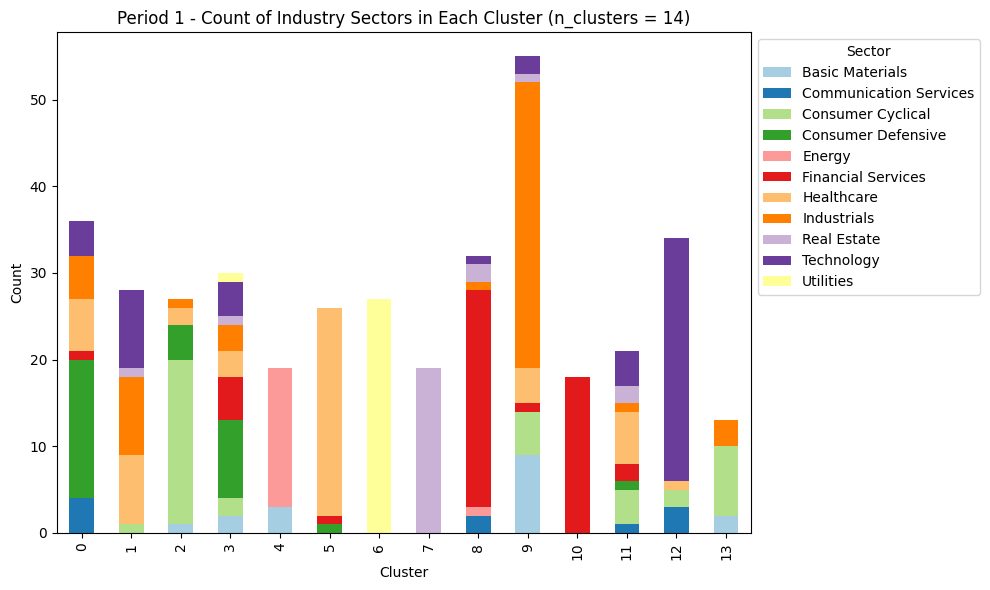

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000               11.111111           0.000000   
1                       0.000000                0.000000           3.571429   
2                       3.703704                0.000000          70.370370   
3                       6.666667                0.000000           6.666667   
4                      15.789474                0.000000           0.000000   
5                       0.000000                0.000000           0.000000   
6                       0.000000                0.000000           0.000000   
7                       0.000000                0.000000           0.000000   
8                       0.000000                6.250000           0.000000   
9                      16.363636                0.000000           9.090909   
10                      0.000000                0.00

<Figure size 800x600 with 0 Axes>

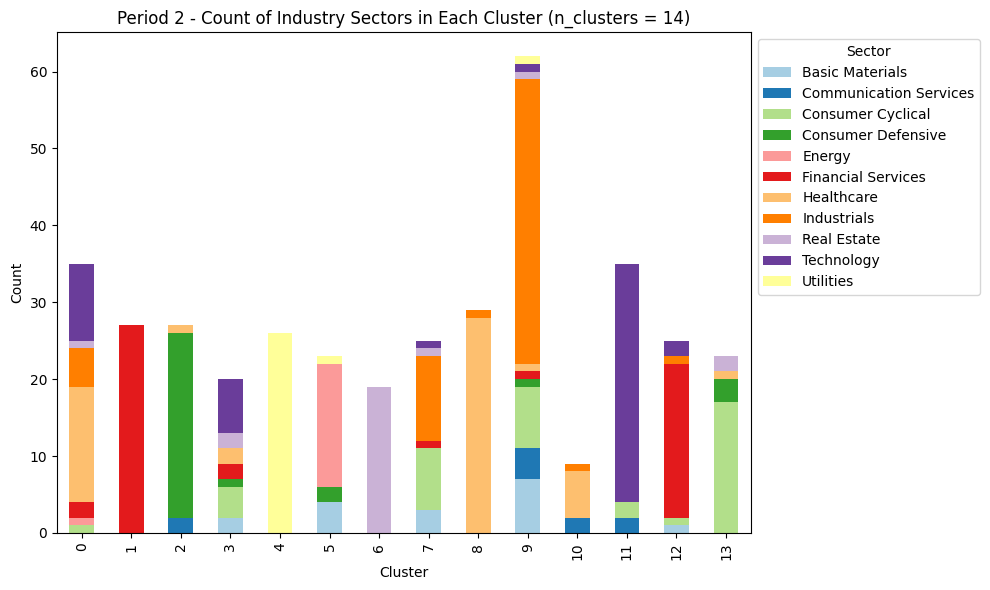

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       0.000000                0.000000           2.857143   
1                       0.000000                0.000000           0.000000   
2                       0.000000                7.407407           0.000000   
3                      10.000000                0.000000          20.000000   
4                       0.000000                0.000000           0.000000   
5                      17.391304                0.000000           0.000000   
6                       0.000000                0.000000           0.000000   
7                      12.000000                0.000000          32.000000   
8                       0.000000                0.000000           0.000000   
9                      11.290323                6.451613          12.903226   
10                      0.000000               22.22

<Figure size 800x600 with 0 Axes>

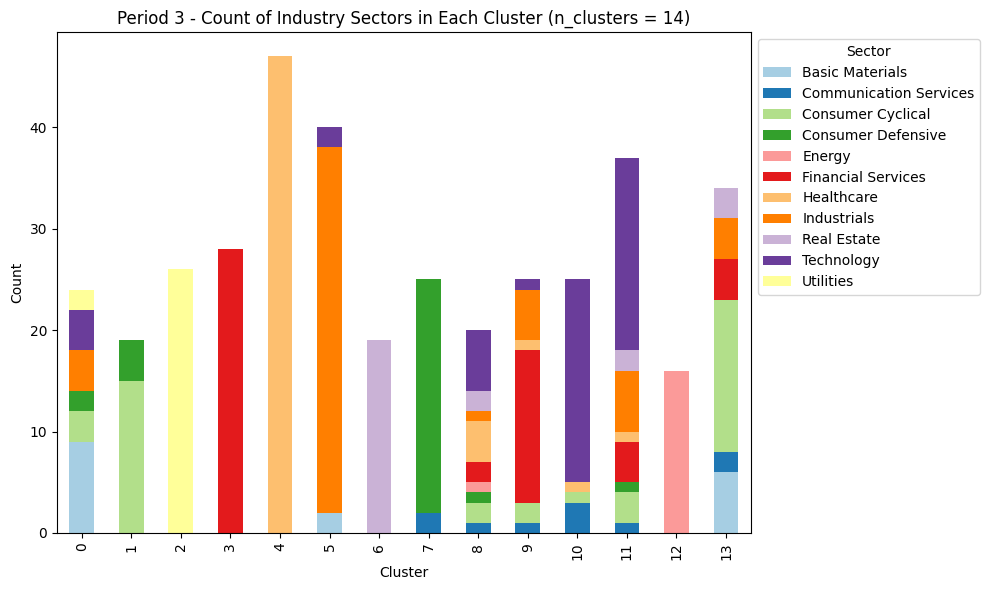

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                      37.500000                0.000000          12.500000   
1                       0.000000                0.000000          78.947368   
2                       0.000000                0.000000           0.000000   
3                       0.000000                0.000000           0.000000   
4                       0.000000                0.000000           0.000000   
5                       5.000000                0.000000           0.000000   
6                       0.000000                0.000000           0.000000   
7                       0.000000                8.000000           0.000000   
8                       0.000000                5.000000          10.000000   
9                       0.000000                4.000000           8.000000   
10                      0.000000               12.00

<Figure size 800x600 with 0 Axes>

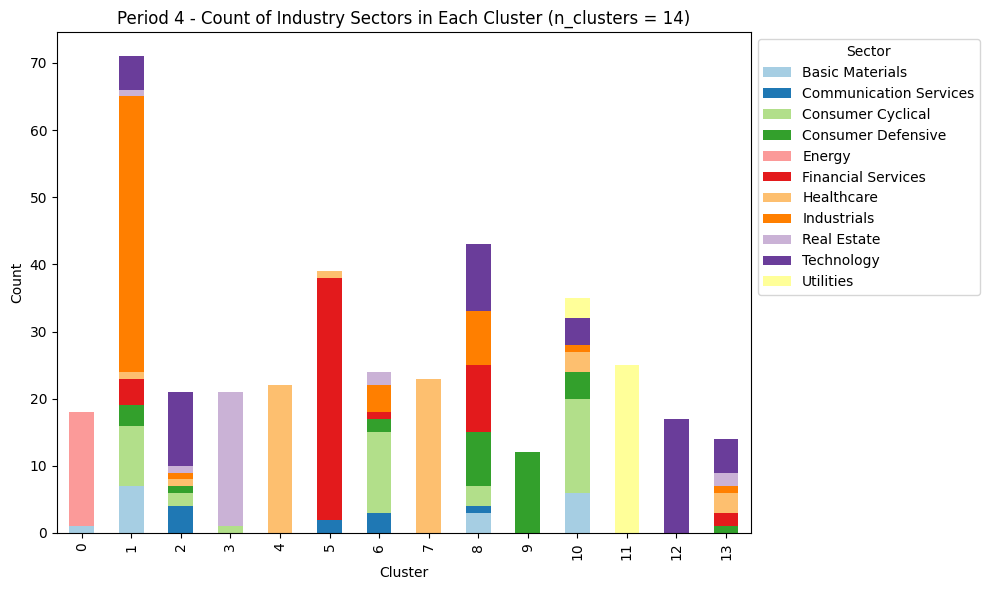

Industry Sector  Basic Materials  Communication Services  Consumer Cyclical  \
Cluster                                                                       
0                       5.555556                0.000000           0.000000   
1                       9.859155                0.000000          12.676056   
2                       0.000000               19.047619           9.523810   
3                       0.000000                0.000000           4.761905   
4                       0.000000                0.000000           0.000000   
5                       0.000000                5.128205           0.000000   
6                       0.000000               12.500000          50.000000   
7                       0.000000                0.000000           0.000000   
8                       6.976744                2.325581           6.976744   
9                       0.000000                0.000000           0.000000   
10                     17.142857                0.00

In [132]:
# 5-year periods
n_cluster = 14
pca_corr = PCA(n_components=10)
scaler = StandardScaler()
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))

# Iterate over each period data
for index, period_data in enumerate(five_year_periods):
    # Use only the columns corresponding to this period
    # Get the correlation matrix specifically for this period
    period_correlation_matrix = period_data.corr()
    correlation_matrix_reduced2 = pca_corr.fit_transform(period_correlation_matrix)
    correlation_matrix_reduced2 = pd.DataFrame(correlation_matrix_reduced2)
    correlation_matrix_reduced2.rename(columns={0: "Corr_PCA_1", 1: "Corr_PCA_2", 2: "Corr_PCA_3", 3: "Corr_PCA_4", 4: "Corr_PCA_5", 5: "Corr_PCA_6", 6: "Corr_PCA_7", 7: "Corr_PCA_8", 8: "Corr_PCA_9", 9: "Corr_PCA_10"}, inplace=True)
    # print the percentage of variance explained by the 2 pca columns
    print(pca_corr.explained_variance_ratio_.cumsum())
    correlation_matrix_reduced2.index = period_correlation_matrix.index   # The underlying order of the rows remains after PCA

    combined_matrix = pd.concat([feature_matrix[period_columns[0]], correlation_matrix_reduced2], axis=1)

    scaled_features_1 = scaler.fit_transform(combined_matrix)

    # Use the best hyperparameters
    kmeans = KMeans(n_clusters=n_cluster, random_state=123, algorithm='lloyd', init='k-means++', max_iter=300, n_init=30)
    kmeans.fit(scaled_features_1)
    kmeans_labels = kmeans.labels_

    plt.figure(figsize=(8, 6))

    sector_counts = pd.DataFrame({'Cluster': kmeans_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
    sector_percentages = sector_counts.div(sector_counts.sum(axis=1), axis=0) * 100

    ax = sector_counts.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
    plt.title(f'{five_year_period_names[index]} - Count of Industry Sectors in Each Cluster (n_clusters = {n_cluster})')
    plt.xlabel('Cluster')
    plt.ylabel('Count')
    plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    print(sector_percentages)

Number of clusters that are predominantly composed (>=80%) of companies from a single sector and the respective sectors:

**Periods by events (pre-financial crisis, financial crisis, post-financial crisis, covid, post-covid)**: \
n_clusters = 14:
*   7 -> 6 -> 7 -> 5 -> 8
*   [Energy, Financial Services, Financial Servicies, Healthcare, Real Estate, Technology, Utilities] -> [Financial Services, Financial Services, Healthcare, Real Estate, Technology, Utilities] -> [Consumer Defensive, Energy, Financial Services, Healthcare, Real Estate, Technology, Utilities] -> [Consumer Defensive, Energy, Healthcare, Technology, Utilities] -> [Consumer Deffensive, Energy, Financial Services, Heatlhcare, Healthcare, Healthcare, Real Estate, Technology Utilities]

**5-year periods**
n_clusters = 14:
*   6 -> 7 -> 8 -> 8
*   [Energy, Financial Services, Healthcare, Real Estate, Technology, Utilities] -> [Consumer Defensive, Financial Services, Financial Services, Healthcare, Real Estate, Technology, Utilities] -> [Consumer Defensive, Energy, Financial Services, Healthcare, Industrials, Real Estate, Technology, Utilities] -> [Consumer Defensive, Energy, Financial Services, Healthcare, Healthcare, Real Estate, Technology, Utilities]




####**🌼🌼🌼Deep dive on K-means with n_clusters = 14**

In [136]:
# Reset combined_matrix's index
combined_matrix = pd.concat([feature_matrix, correlation_matrix_reduced], axis=1)
combined_matrix_2 = combined_matrix.reset_index()
combined_matrix_2.rename(columns={'index': 'Company'}, inplace=True)
combined_matrix_2.head()

,Company,avg_return_pre_crisis,volatility_pre_crisis,avg_return_crisis,volatility_crisis,avg_return_post_crisis,volatility_post_crisis,avg_return_covid,volatility_covid,avg_return_post_covid,...,Corr_PCA_1,Corr_PCA_2,Corr_PCA_3,Corr_PCA_4,Corr_PCA_5,Corr_PCA_6,Corr_PCA_7,Corr_PCA_8,Corr_PCA_9,Corr_PCA_10
0,MSFT,0.000356,0.011085,0.000020,0.025123,0.000914,0.014376,0.000832,0.021890,0.001960,...,-0.378808,-0.102554,-0.884705,-0.043815,-0.051669,-0.328803,-0.074152,0.135557,0.302901,0.160217
1,AAPL,0.003060,0.024775,0.001281,0.030126,0.001194,0.016205,0.001053,0.023264,0.001678,...,0.672403,-0.653635,-0.443667,-0.056128,-0.229598,-0.190066,-0.162563,0.152557,0.141500,0.104978
2,NVDA,0.002036,0.030606,-0.000298,0.042996,0.001507,0.025704,0.001829,0.035245,0.005338,...,0.709743,-1.131154,-0.652117,-0.052182,-0.463892,-0.328701,-0.143165,0.299999,0.134455,-0.002337
3,AMZN,-0.000049,0.024757,0.001856,0.036857,0.001374,0.020287,0.000177,0.024624,0.002588,...,1.292061,-0.888674,-0.403927,-0.348478,-0.260385,-0.168526,-0.150053,0.081144,0.131398,0.199323
4,BRK-B,0.000391,0.008356,-0.000154,0.021217,0.000582,0.011497,0.000540,0.016116,0.000612,...,-0.959177,0.069834,0.071321,0.119224,0.420520,-0.023988,0.065813,0.101182,-0.017378,0.017296


In [137]:
scaler3 = StandardScaler()
combined_matrix_scaled_2 = scaler3.fit_transform(combined_matrix_2.drop(columns=['Company']))

In [139]:
# Deep dive on K-means with n_clusters = 14
kmeans = KMeans(n_clusters=14, random_state=123, algorithm='lloyd', init='k-means++', max_iter=300, n_init=30)
clusters = kmeans.fit_predict(combined_matrix_scaled_2)

# Add the cluster labels to the merged data
combined_matrix_2['Cluster'] = clusters
combined_matrix_2.head()

,Company,avg_return_pre_crisis,volatility_pre_crisis,avg_return_crisis,volatility_crisis,avg_return_post_crisis,volatility_post_crisis,avg_return_covid,volatility_covid,avg_return_post_covid,...,Corr_PCA_2,Corr_PCA_3,Corr_PCA_4,Corr_PCA_5,Corr_PCA_6,Corr_PCA_7,Corr_PCA_8,Corr_PCA_9,Corr_PCA_10,Cluster
0,MSFT,0.000356,0.011085,0.000020,0.025123,0.000914,0.014376,0.000832,0.021890,0.001960,...,-0.102554,-0.884705,-0.043815,-0.051669,-0.328803,-0.074152,0.135557,0.302901,0.160217,10
1,AAPL,0.003060,0.024775,0.001281,0.030126,0.001194,0.016205,0.001053,0.023264,0.001678,...,-0.653635,-0.443667,-0.056128,-0.229598,-0.190066,-0.162563,0.152557,0.141500,0.104978,1
2,NVDA,0.002036,0.030606,-0.000298,0.042996,0.001507,0.025704,0.001829,0.035245,0.005338,...,-1.131154,-0.652117,-0.052182,-0.463892,-0.328701,-0.143165,0.299999,0.134455,-0.002337,2
3,AMZN,-0.000049,0.024757,0.001856,0.036857,0.001374,0.020287,0.000177,0.024624,0.002588,...,-0.888674,-0.403927,-0.348478,-0.260385,-0.168526,-0.150053,0.081144,0.131398,0.199323,10
4,BRK-B,0.000391,0.008356,-0.000154,0.021217,0.000582,0.011497,0.000540,0.016116,0.000612,...,0.069834,0.071321,0.119224,0.420520,-0.023988,0.065813,0.101182,-0.017378,0.017296,8


In [141]:
# Return the count in each cluster
combined_matrix_2['Cluster'].value_counts()

Cluster
4     62
8     52
6     41
10    34
5     31
0     30
3     25
12    21
9     19
1     17
7     16
2     14
13    14
11     9
Name: count, dtype: int64

In [142]:
cluster_summary = combined_matrix_2.drop(['Company'], axis=1).groupby('Cluster').mean()
cluster_summary

,avg_return_pre_crisis,volatility_pre_crisis,avg_return_crisis,volatility_crisis,avg_return_post_crisis,volatility_post_crisis,avg_return_covid,volatility_covid,avg_return_post_covid,volatility_post_covid,Corr_PCA_1,Corr_PCA_2,Corr_PCA_3,Corr_PCA_4,Corr_PCA_5,Corr_PCA_6,Corr_PCA_7,Corr_PCA_8,Corr_PCA_9,Corr_PCA_10
Cluster,,,,,,,,,,,,,,,,,,,,
0,0.000460,0.010588,0.000043,0.018097,0.000561,0.011699,0.000413,0.017236,-0.000233,0.012561,1.444416,0.646176,-0.037617,-0.048967,0.338098,0.172854,-0.244518,0.020526,0.165163,-0.066018
1,0.002279,0.026940,0.000659,0.036433,0.000928,0.017918,0.000666,0.022917,0.000857,0.015504,0.592916,-0.367627,-0.084059,-0.198689,-0.158266,-0.084205,-0.096039,-0.041731,-0.056847,0.069695
2,0.000562,0.027071,-0.000239,0.039723,0.001205,0.024998,0.000930,0.032504,0.002413,0.024723,0.317988,-1.004444,-0.363443,-0.000269,-0.312526,-0.158657,-0.014463,0.293682,0.051149,-0.151333
3,0.000715,0.010014,-0.000098,0.020281,0.000599,0.010748,0.000345,0.019672,-0.000172,0.013042,0.665081,1.890569,0.008238,0.302116,-0.350828,-0.065433,0.098682,0.212100,-0.173752,0.004884
4,0.000681,0.014606,-0.000009,0.029719,0.000731,0.015835,0.000594,0.022442,0.000831,0.015467,-1.190074,-0.085947,-0.222944,0.194624,0.028623,0.177145,-0.081724,-0.056803,-0.094212,-0.075045
5,0.000586,0.011604,0.000004,0.053586,0.000659,0.017803,0.000584,0.027290,0.000454,0.019027,-1.308826,-0.213260,0.663767,-0.304438,0.379961,-0.213980,-0.053804,0.201675,-0.112721,0.039156
6,0.000609,0.015430,-0.000029,0.023745,0.000767,0.015126,0.000607,0.021416,0.000277,0.015931,0.899863,-0.070293,-0.293838,0.001581,0.272378,-0.158321,0.254295,-0.195266,-0.032231,-0.067494
7,0.001370,0.020091,0.000553,0.038259,0.000472,0.021311,0.001291,0.028954,0.000213,0.019665,0.507493,-0.349674,0.382092,0.666447,-0.211514,-0.029501,-0.112474,-0.078288,-0.109344,0.005617
8,0.000567,0.013841,0.000001,0.025514,0.000841,0.013294,0.000600,0.021551,0.000528,0.014437,-0.223882,0.139327,-0.159673,-0.175832,0.110415,0.119927,0.063650,0.020951,0.079879,0.152892


from matplotlib import pyplot as plt
cluster_summary['avg_return_pre_crisis'].plot(kind='hist', bins=20, title='avg_return_pre_crisis')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
cluster_summary['volatility_pre_crisis'].plot(kind='hist', bins=20, title='volatility_pre_crisis')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
cluster_summary['avg_return_crisis'].plot(kind='hist', bins=20, title='avg_return_crisis')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
cluster_summary['volatility_crisis'].plot(kind='hist', bins=20, title='volatility_crisis')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
cluster_summary.plot(kind='scatter', x='avg_return_pre_crisis', y='volatility_pre_crisis', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
cluster_summary.plot(kind='scatter', x='volatility_pre_crisis', y='avg_return_crisis', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
cluster_summary.plot(kind='scatter', x='avg_return_crisis', y='volatility_crisis', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
cluster_summary.plot(kind='scatter', x='volatility_crisis', y='avg_return_post_crisis', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
cluster_summary['avg_return_pre_crisis'].plot(kind='line', figsize=(8, 4), title='avg_return_pre_crisis')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
cluster_summary['volatility_pre_crisis'].plot(kind='line', figsize=(8, 4), title='volatility_pre_crisis')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
cluster_summary['avg_return_crisis'].plot(kind='line', figsize=(8, 4), title='avg_return_crisis')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
cluster_summary['volatility_crisis'].plot(kind='line', figsize=(8, 4), title='volatility_crisis')
plt.gca().spines[['top', 'right']].set_visible(False)

####🌼🌼🌼Track Amazon

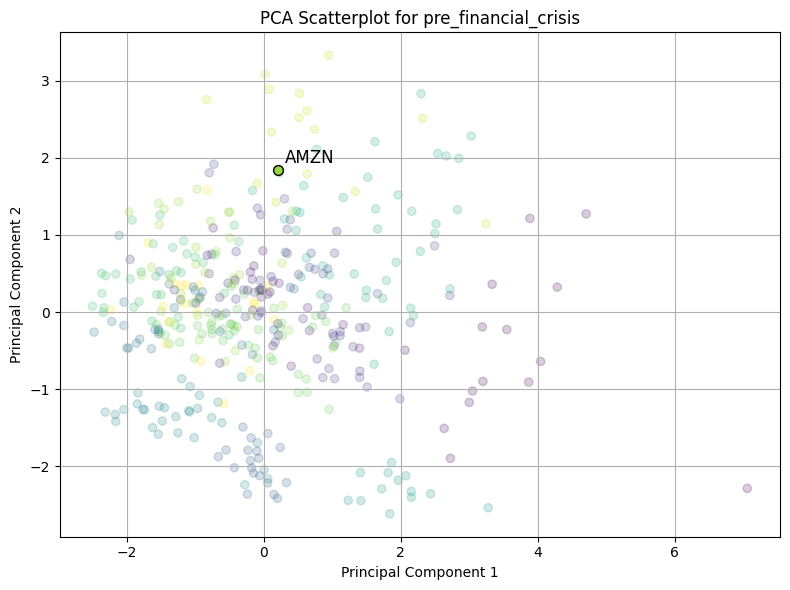

********** Period:  pre_financial_crisis **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Industrials               16
Consumer Cyclical          7
Technology                 6
Communication Services     5
Healthcare                 2
Consumer Defensive         1
Financial Services         1
Basic Materials            0
Energy                     0
Real Estate                0
Utilities                  0
Name: 11, dtype: int64 

Industry Sector
Industrials               42.105263
Consumer Cyclical         18.421053
Technology                15.789474
Communication Services    13.157895
Healthcare                 5.263158
Consumer Defensive         2.631579
Financial Services         2.631579
Basic Materials            0.000000
Energy                     0.000000
Real Estate                0.000000
Utilities                  0.000000
Name: 11, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry 

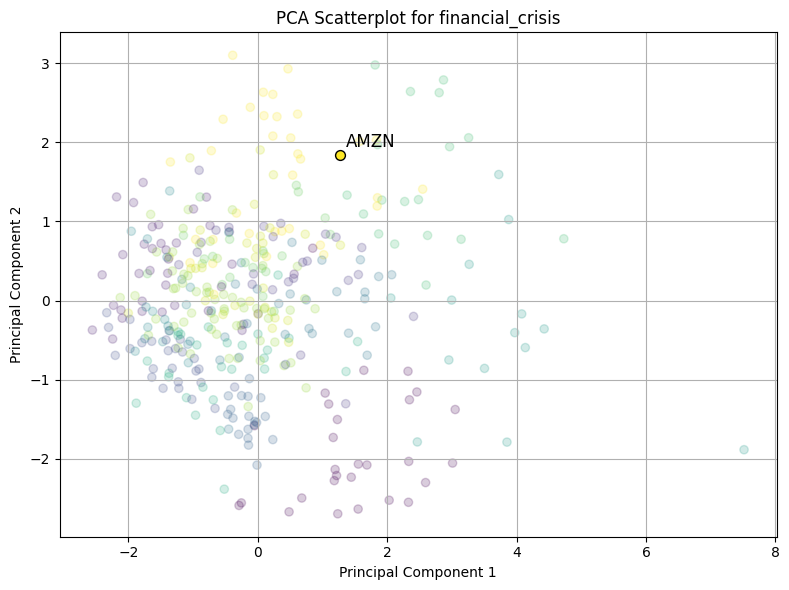

********** Period:  financial_crisis **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Technology                29
Communication Services     3
Consumer Cyclical          3
Basic Materials            0
Consumer Defensive         0
Energy                     0
Financial Services         0
Healthcare                 0
Industrials                0
Real Estate                0
Utilities                  0
Name: 13, dtype: int64 

Industry Sector
Technology                82.857143
Communication Services     8.571429
Consumer Cyclical          8.571429
Basic Materials            0.000000
Consumer Defensive         0.000000
Energy                     0.000000
Financial Services         0.000000
Healthcare                 0.000000
Industrials                0.000000
Real Estate                0.000000
Utilities                  0.000000
Name: 13, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Sect

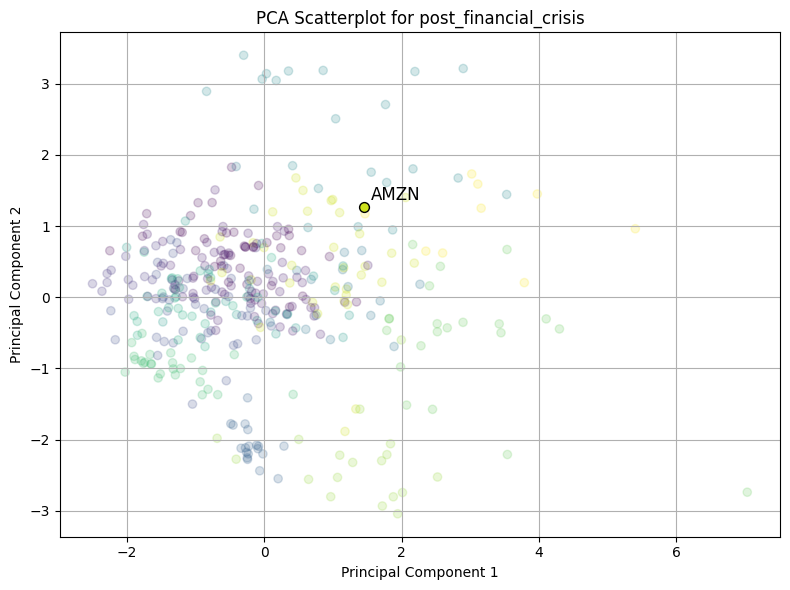

********** Period:  post_financial_crisis **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Technology                18
Healthcare                 4
Communication Services     3
Consumer Cyclical          3
Real Estate                3
Financial Services         2
Industrials                2
Basic Materials            0
Consumer Defensive         0
Energy                     0
Utilities                  0
Name: 12, dtype: int64 

Industry Sector
Technology                51.428571
Healthcare                11.428571
Communication Services     8.571429
Consumer Cyclical          8.571429
Real Estate                8.571429
Financial Services         5.714286
Industrials                5.714286
Basic Materials            0.000000
Consumer Defensive         0.000000
Energy                     0.000000
Utilities                  0.000000
Name: 12, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry

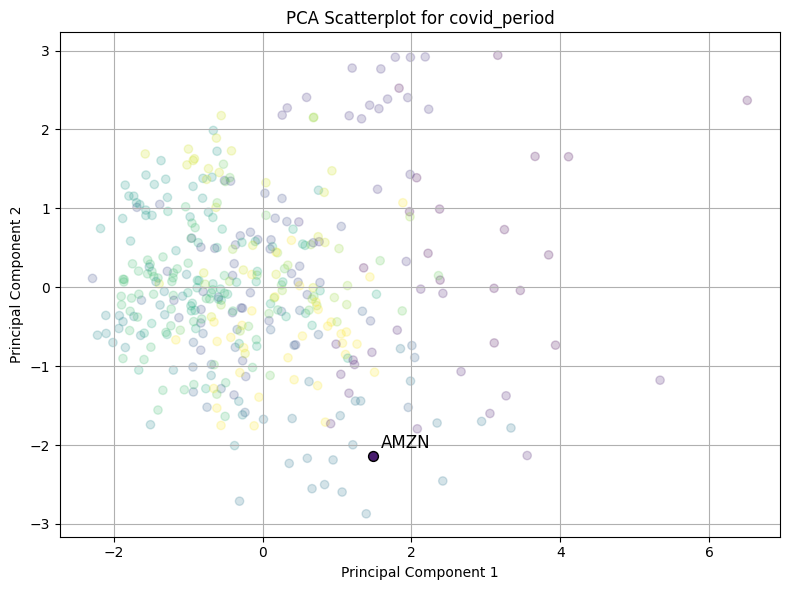

********** Period:  covid_period **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Technology                7
Communication Services    3
Healthcare                3
Consumer Cyclical         2
Industrials               1
Real Estate               1
Basic Materials           0
Consumer Defensive        0
Energy                    0
Financial Services        0
Utilities                 0
Name: 1, dtype: int64 

Industry Sector
Technology                41.176471
Communication Services    17.647059
Healthcare                17.647059
Consumer Cyclical         11.764706
Industrials                5.882353
Real Estate                5.882353
Basic Materials            0.000000
Consumer Defensive         0.000000
Energy                     0.000000
Financial Services         0.000000
Utilities                  0.000000
Name: 1, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Sector  Basic Materia

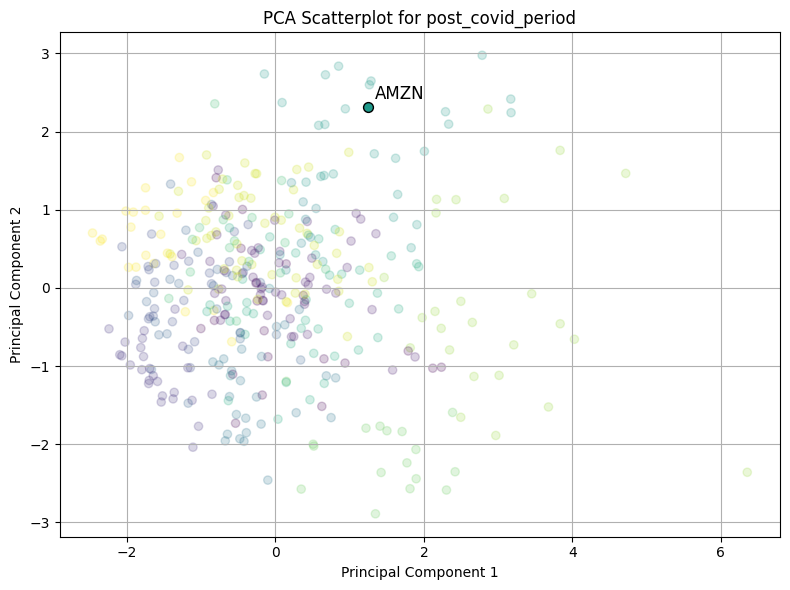

********** Period:  post_covid_period **********

1. Count and percentage of industry sector in the cluster that Amazon is in: 
Industry Sector
Technology                24
Communication Services     3
Consumer Cyclical          1
Basic Materials            0
Consumer Defensive         0
Energy                     0
Financial Services         0
Healthcare                 0
Industrials                0
Real Estate                0
Utilities                  0
Name: 7, dtype: int64 

Industry Sector
Technology                85.714286
Communication Services    10.714286
Consumer Cyclical          3.571429
Basic Materials            0.000000
Consumer Defensive         0.000000
Energy                     0.000000
Financial Services         0.000000
Healthcare                 0.000000
Industrials                0.000000
Real Estate                0.000000
Utilities                  0.000000
Name: 7, dtype: float64

2. Count and percentage of industry sector in all clusters: 

Industry Secto

In [152]:
n_cluster = 14
pca_corr = PCA(n_components=10)
pca = PCA(n_components=2)
scaler = StandardScaler()

# Iterate over each period data
for index, period_data in enumerate(periods):
    # Use only the columns corresponding to this period
    # Get the correlation matrix specifically for this period
    period_correlation_matrix = period_data.corr()
    correlation_matrix_reduced2 = pca_corr.fit_transform(period_correlation_matrix)
    correlation_matrix_reduced2 = pd.DataFrame(correlation_matrix_reduced2)
    correlation_matrix_reduced2.rename(columns={0: "Corr_PCA_1", 1: "Corr_PCA_2", 2: "Corr_PCA_3", 3: "Corr_PCA_4", 4: "Corr_PCA_5", 5: "Corr_PCA_6", 6: "Corr_PCA_7", 7: "Corr_PCA_8", 8: "Corr_PCA_9", 9: "Corr_PCA_10"}, inplace=True)
    correlation_matrix_reduced2.index = period_correlation_matrix.index   # The underlying order of the rows remains after PCA

    combined_matrix = pd.concat([feature_matrix[period_columns[0]], correlation_matrix_reduced2], axis=1)
    combined_matrix_2 = combined_matrix.reset_index()
    combined_matrix_2.rename(columns={'index': 'Company'}, inplace=True)

    scaled_features_1 = scaler.fit_transform(combined_matrix)
    pca_components = pca.fit_transform(scaled_features_1)

    # Use the best hyperparameters
    kmeans = KMeans(n_clusters=n_cluster, random_state=123, algorithm='lloyd', init='k-means++', max_iter=300, n_init=30)
    kmeans.fit(scaled_features_1)
    kmeans_labels = kmeans.labels_

    combined_matrix_2['Cluster'] = kmeans_labels

    plt.figure(figsize=(8, 6))

    # Create a colormap from the kmeans labels
    unique_labels_length = len(np.unique(kmeans_labels))
    cmap = ListedColormap(plt.cm.viridis(np.linspace(0, 1, unique_labels_length)))
    colors = cmap(kmeans_labels)

    plt.scatter(pca_components[:, 0], pca_components[:, 1], c=colors, cmap='viridis', alpha=0.2)

    # Highlight 'AMZN'
    amzn_index = period_correlation_matrix.index.get_loc('AMZN')
    plt.scatter(pca_components[amzn_index, 0], pca_components[amzn_index, 1], color=colors[amzn_index], marker='o', s=50, edgecolors='black', alpha=1.0)
    plt.annotate('AMZN', xy=(pca_components[amzn_index, 0], pca_components[amzn_index, 1]), xytext=(pca_components[amzn_index, 0] + 0.1, pca_components[amzn_index, 1] + 0.1), fontsize=12, color='black')

    plt.title(f'PCA Scatterplot for {period_names[index]}')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    amazons_cluster = kmeans_labels[amzn_index]

    print("********** Period: ", period_names[index], "**********")
    sector_counts_amzn = pd.DataFrame({'Cluster': kmeans_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
    sector_percentages_amzn = sector_counts_amzn.div(sector_counts_amzn.sum(axis=1), axis=0) * 100
    print("\n1. Count and percentage of industry sector in the cluster that Amazon is in: ")
    #count
    print(sector_counts_amzn.loc[amazons_cluster].sort_values(ascending=False), "\n")
    #order by percentage in descending order
    print(sector_percentages_amzn.loc[amazons_cluster].sort_values(ascending=False))

    print("\n2. Count and percentage of industry sector in all clusters: \n")
    #count
    print(sector_counts_amzn)
    print(sector_percentages_amzn)
    print("\n")

    # Get distances between each data point and cluster centers
    distances = kmeans.transform(scaled_features_1)

    # Get distances for Amazon
    amazon_distances = distances[amzn_index]

    # Sort distances in ascending order and get corresponding cluster indices
    sorted_distances_indices = np.argsort(amazon_distances)
    sorted_amazon_distances = amazon_distances[sorted_distances_indices]

    # Print distances in ascending order
    print("\n3. Distances between Amazon and all cluster centers (in ascending order): \n")
    for idx in sorted_distances_indices:
        print(f"Cluster {idx}: {amazon_distances[idx]}")

    print("\n4. More information about each cluster: \n")
    print(combined_matrix_2.drop(['Company'], axis=1).groupby('Cluster').mean())

####Old code

In [109]:
kmeans = KMeans(n_clusters=15, random_state=123, algorithm='lloyd', init='k-means++', max_iter=300, n_init=30)
kmeans.fit(scaled_features_1)
kmeans_labels = kmeans.labels_

kmeans_third_sector_counts = pd.DataFrame({'Cluster': kmeans_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
kmeans_third_sector_percentages = kmeans_third_sector_counts.div(kmeans_third_sector_counts.sum(axis=1), axis=0) * 100

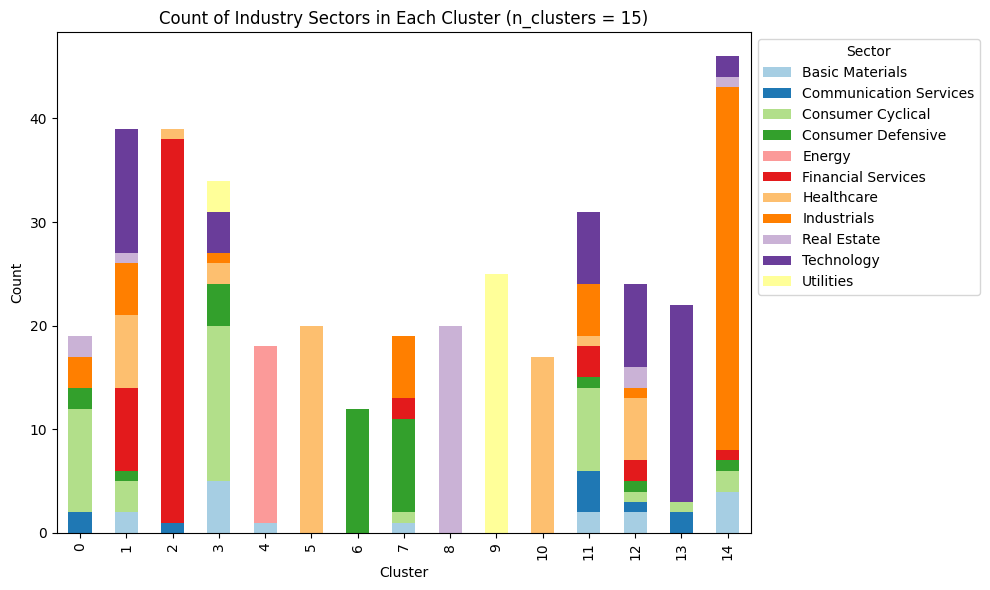

In [112]:
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))

# Stacked bar chart
ax = kmeans_third_sector_counts.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Count of Industry Sectors in Each Cluster (n_clusters = 15)')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

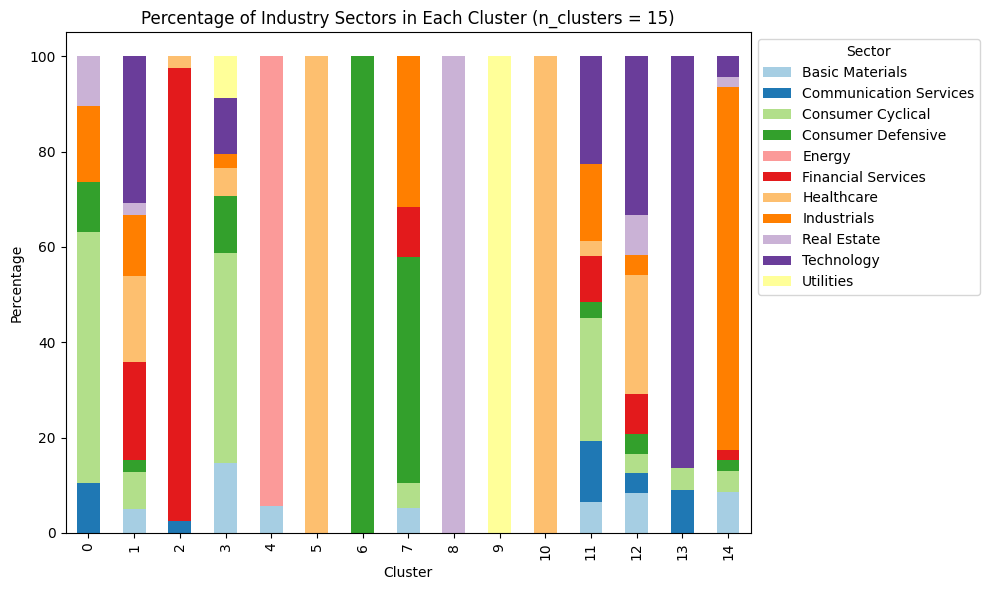

In [113]:
# Stacked bar chart
ax = kmeans_third_sector_percentages.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Percentage of Industry Sectors in Each Cluster (n_clusters = 15)')
plt.xlabel('Cluster')
plt.ylabel('Percentage')
plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

###**9.1.3 Count and percentage of cluster in each industry sector**

In [114]:
kmeans_third_cluster_percentages = kmeans_third_sector_counts.div(kmeans_third_sector_counts.sum(axis=0), axis=1) * 100

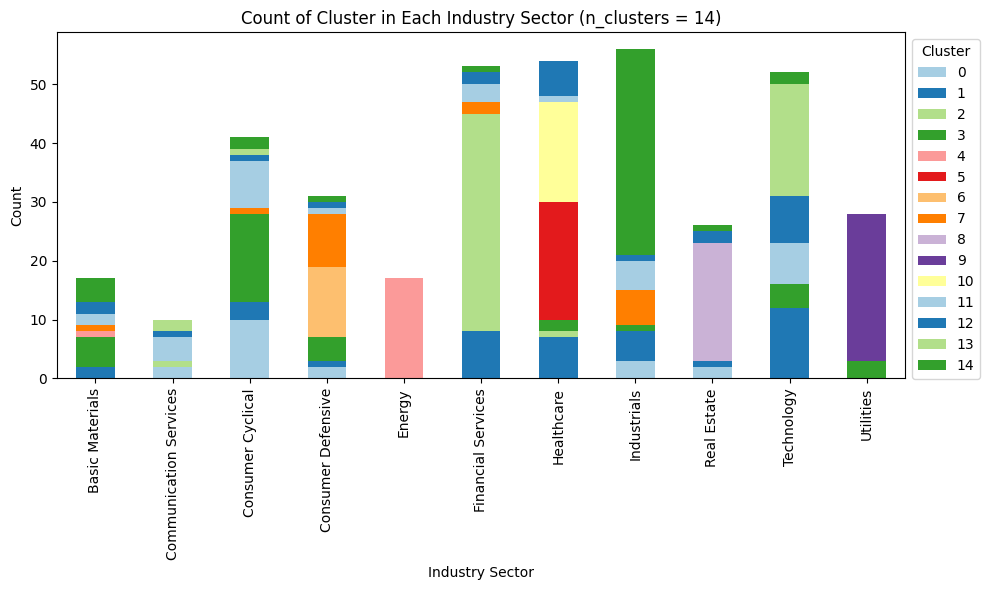

In [115]:
# Stacked bar charts
ax = kmeans_third_sector_counts.transpose().plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Count of Cluster in Each Industry Sector (n_clusters = 14)')
plt.xlabel('Industry Sector')
plt.ylabel('Count')
plt.legend(title='Cluster', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

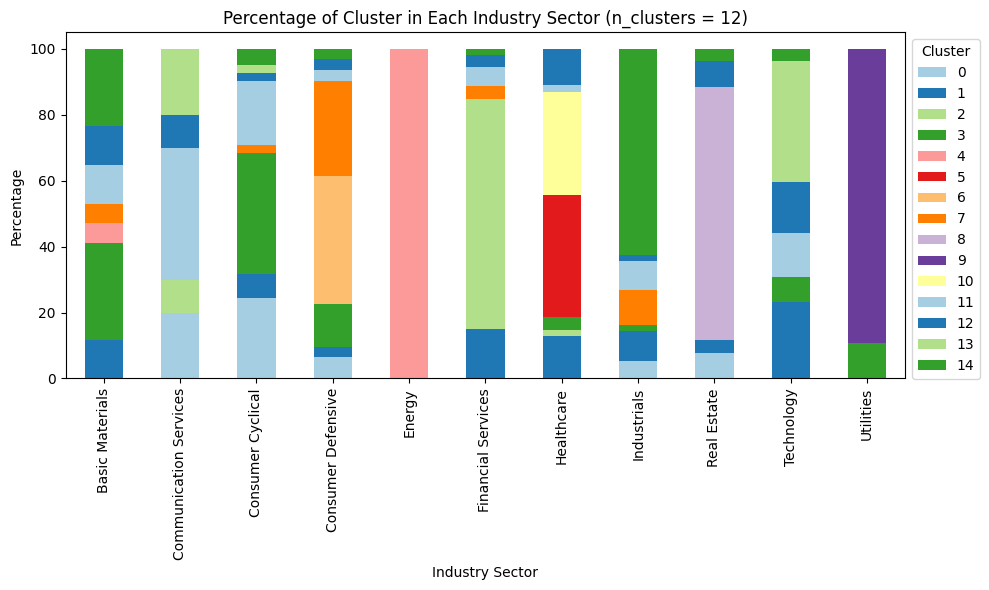

In [116]:
# Stacked bar charts
ax = kmeans_third_cluster_percentages.transpose().plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Percentage of Cluster in Each Industry Sector (n_clusters = 12)')
plt.xlabel('Industry Sector')
plt.ylabel('Percentage')
plt.legend(title='Cluster', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

###**9.1.4 Track Amazon**

In [ ]:
n_cluster = 15
pca = PCA(n_components=2)
pca_corr = PCA(n_components=2)
scaler = StandardScaler()

# Iterate over each period data
for index, period_data in enumerate(periods):
    # Use only the columns corresponding to this period
    # Get the correlation matrix specifically for this period
    period_correlation_matrix = period_data.corr()
    correlation_matrix_reduced2 = pca.fit_transform(period_correlation_matrix)
    correlation_matrix_reduced2 = pd.DataFrame(correlation_matrix_reduced2)
    correlation_matrix_reduced2.rename(columns={0: "Corr_PCA_1", 1: "Corr_PCA_2"}, inplace=True)
    correlation_matrix_reduced2.index = period_correlation_matrix.index   # The underlying order of the rows remains after PCA

    combined_matrix = pd.concat([feature_matrix[period_columns[0]], correlation_matrix_reduced2], axis=1)

    scaled_features_1 = scaler.fit_transform(combined_matrix)
    pca_components = pca.fit_transform(scaled_features_1)

    # Use the best hyperparameters
    kmeans = KMeans(n_clusters=n_cluster, random_state=123, algorithm='lloyd', init='k-means++', max_iter=300, n_init=30)
    kmeans.fit(scaled_features_1)
    kmeans_labels = kmeans.labels_

    plt.figure(figsize=(8, 6))

    # Create a colormap from the kmeans labels
    unique_labels_length = len(np.unique(kmeans_labels))
    cmap = ListedColormap(plt.cm.viridis(np.linspace(0, 1, unique_labels_length)))
    colors = cmap(kmeans_labels)

    plt.scatter(pca_components[:, 0], pca_components[:, 1], c=colors, cmap='viridis', alpha=0.2)

    # Highlight 'AMZN'
    amzn_index = correlation_matrix.index.get_loc('AMZN')
    plt.scatter(pca_components[amzn_index, 0], pca_components[amzn_index, 1], color=colors[amzn_index], marker='o', s=50, edgecolors='black', alpha=1.0)
    plt.annotate('AMZN', xy=(pca_components[amzn_index, 0], pca_components[amzn_index, 1]), xytext=(pca_components[amzn_index, 0] + 0.1, pca_components[amzn_index, 1] + 0.1), fontsize=12, color='black')

    plt.title(f'PCA Scatterplot for {period_names[index]}')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    amazons_cluster = kmeans_labels[amzn_index]

    print("********** Period: ", period_names[index], "**********")
    sector_counts_amzn = pd.DataFrame({'Cluster': kmeans_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
    sector_percentages_amzn = sector_counts_amzn.div(sector_counts_amzn.sum(axis=1), axis=0) * 100
    print("\n1. Count and percentage of industry sector in the cluster that Amazon is in: ")
    #count
    print(sector_counts_amzn.loc[amazons_cluster].sort_values(ascending=False), "\n")
    #order by percentage in descending order
    print(sector_percentages_amzn.loc[amazons_cluster].sort_values(ascending=False))

    print("\n2. Count and percentage of industry sector in all clusters: \n")
    #count
    print(sector_counts_amzn)
    print(sector_percentages_amzn)
    print("\n")

    # cluster_percentages_amzn = sector_counts_amzn.div(sector_counts_amzn.sum(axis=0), axis=1) * 100
    # print("\n3. Count and percentage of cluster in each sector: \n")
    # #count
    # print(sector_counts_amzn)
    # print(cluster_percentages_amzn)
    # print("\n")

##**9.2 Hierarchical clustering**

###**9.2.1 Hyperparameter tuning**

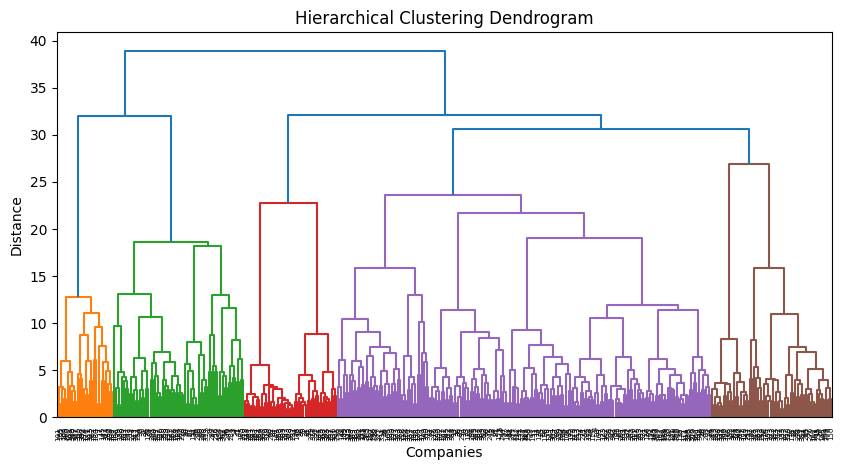

In [117]:
# Plot a dendogram to get an idea of the distance
link = linkage(combined_matrix_scaled, method='ward', metric='euclidean')  #AgglomerativeClustering from scikitlearn uses linkage=ward by default, so use ward here as well

# Plot dendrogram
plt.figure(figsize=(10, 5))
dendrogram(link)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Companies')
plt.ylabel('Distance')
plt.show()

In [118]:
# *****
param_grid_hierarchical = {
    'n_clusters': range(2, 21),
    #'linkage': ['ward', 'complete', 'average', 'single'],
    'linkage': ['ward'],
    #'metric': ['euclidean', 'l1', 'l2', 'manhattan', 'cosine', 'precomputed']
    'metric': ['euclidean'],
    #'distance_threshold': [5, 10, 2]
}

hierarchical_third = AgglomerativeClustering(n_clusters=None)

# Initialize variables
best_hierarchical_third_score = -2    # The lowest that silhouette score can be is -1
#best_hierarchical_third_score = float('inf')
best_hierarchical_third_grid = None
best_hierarchical_third_labels = None
hierarchical_third_results = []

# Find the best hyperparameter combination
for g in ParameterGrid(param_grid_hierarchical):
    # Skip invalid combinations
    # ward can only work with euclidean, otherwise it will throw an error
    if g['linkage'] == 'ward' and g['metric'] != 'euclidean':
        continue

    hierarchical_third.set_params(**g)

    if g['metric'] == 'precomputed':
        distance_matrix = pairwise_distances(combined_matrix_scaled, metric='euclidean')
        hierarchical_third.fit(distance_matrix)
    else:
        hierarchical_third.fit(combined_matrix_scaled)

    hierarchical_third_labels = hierarchical_third.labels_
    score = silhouette_score(combined_matrix_scaled, hierarchical_third_labels)
    #score = davies_bouldin_score(combined_matrix_scaled, hierarchical_third_labels)
    hierarchical_third_results.append({'hyperparameters': g, 'silhouette_score': score, 'cluster_count': np.unique(hierarchical_third_labels, return_counts=True)})

    if score > best_hierarchical_third_score:
    #if score < best_hierarchical_third_score:
        best_hierarchical_third_score = score
        best_hierarchical_third_grid = g
        best_hierarchical_third_labels = hierarchical_third_labels

print("The best silhouette score is: ", best_hierarchical_third_score)
print("The best hyperparameters are: ", best_hierarchical_third_grid)
hierarchical_third_results_df = pd.DataFrame(hierarchical_third_results)

The best silhouette score is:  0.1898743001075177
The best hyperparameters are:  {'linkage': 'ward', 'metric': 'euclidean', 'n_clusters': 17}


For the record:

The best silhouette score is:  0.18987432948597988

The best hyperparameters are:  {'linkage': 'ward', 'metric': 'euclidean', 'n_clusters': 17}

In [119]:
hierarchical_third_results_df.sort_values(by='silhouette_score', ascending=False)

,hyperparameters,silhouette_score,cluster_count
15,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.189874,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
14,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.187098,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
16,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.185523,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
12,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.184885,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
13,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.184753,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
11,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.177744,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], [..."
18,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.175675,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
10,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.174947,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], [41, ..."
17,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.172221,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
9,"{'linkage': 'ward', 'metric': 'euclidean', 'n_...",0.168375,"([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10], [30, 41, ..."


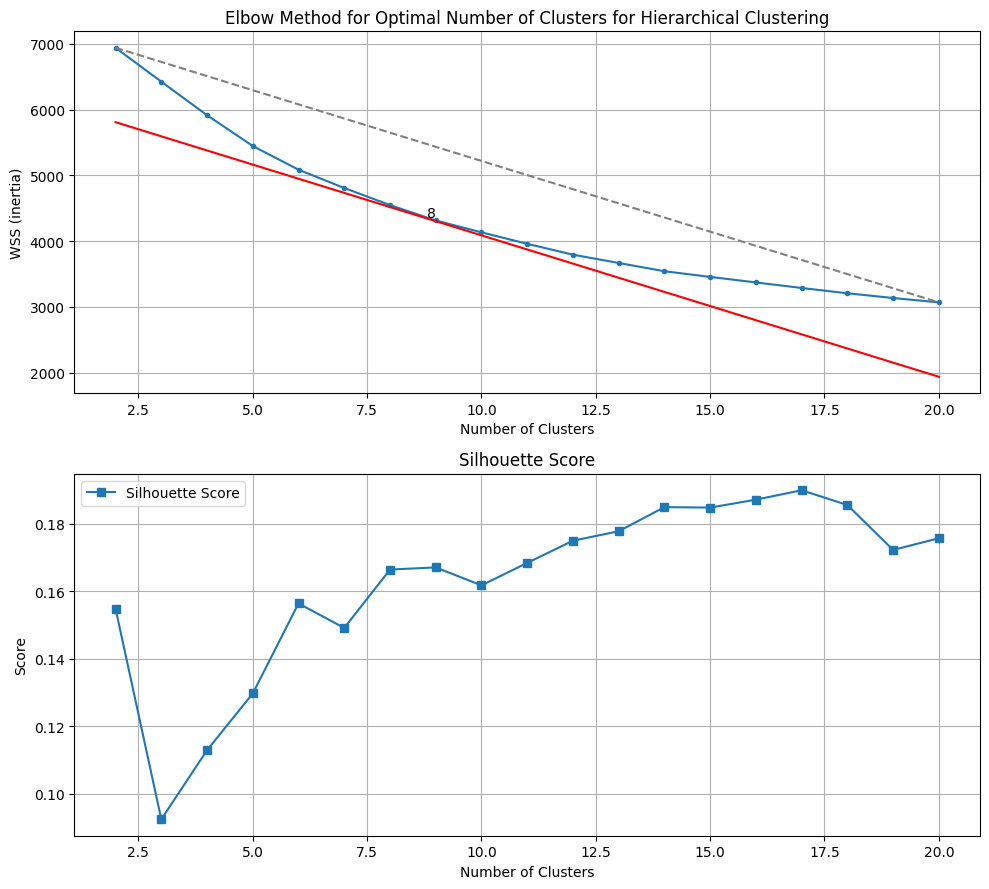

In [120]:
WSS = wss_calculation2(20, combined_matrix_scaled)

# Test out different values of n_clusters using the elbow method
# Try the numbers between 2 to 20
n_cluster_options = range(2, 21)

silhouette_scores_hierarchical = []
hierarchical_results = {}

for n_cluster in n_cluster_options:
    hierarchical = AgglomerativeClustering(n_clusters=n_cluster, linkage='ward', metric='euclidean')
    hierarchical.fit(combined_matrix_scaled)
    hierarchical_labels = hierarchical.labels_
    hierarchical_results[n_cluster] = hierarchical_labels

    # Record the metrics
    silhouette_scores_hierarchical.append(silhouette_score(combined_matrix_scaled, hierarchical_labels))

start_point = (n_cluster_options[0], WSS[0])
end_point = (n_cluster_options[-1], WSS[-1])
slope = (end_point[1] - start_point[1]) / (end_point[0] - start_point[0])

x_values = np.linspace(2, 20)
y_values = slope * x_values + 6240

#plot subplots
fig, ax = plt.subplots(2, 1, figsize=(10, 9))

# Plot elbow method (inertia)
ax[0].plot(n_cluster_options, WSS, marker='.')
ax[0].plot([start_point[0], end_point[0]], [start_point[1], end_point[1]], linestyle='--', color='gray')
ax[0].plot(x_values, y_values, color='red')
ax[0].text(n_cluster_options[7], WSS[7], f'{n_cluster_options[6]}', ha='right', va='bottom')
ax[0].set_xlabel('Number of Clusters')
ax[0].set_ylabel('WSS (inertia)')
ax[0].set_title('Elbow Method for Optimal Number of Clusters for Hierarchical Clustering')
ax[0].grid(True)

# Plot the silhoutte score and davies-bouldin index
ax[1].plot(n_cluster_options, silhouette_scores_hierarchical, marker='s', label='Silhouette Score')
ax[1].set_xlabel('Number of Clusters')
ax[1].set_ylabel('Score')
ax[1].set_title('Silhouette Score')
ax[1].legend()
ax[1].grid(True)

plt.tight_layout()
plt.show()

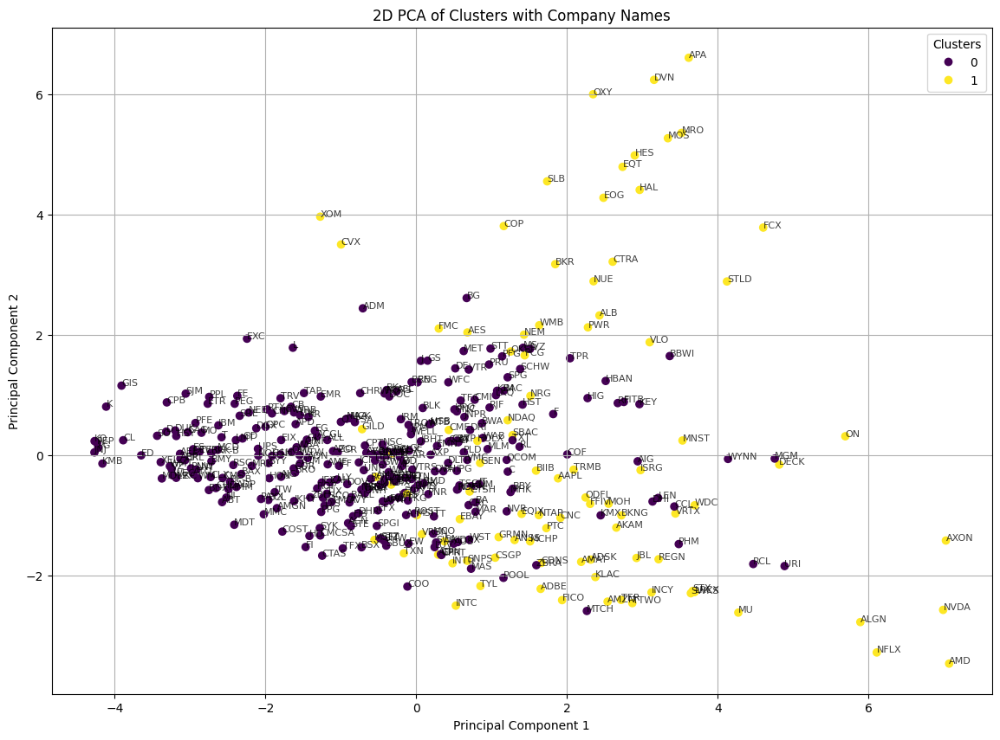

In [121]:
pca_2d = PCA(n_components=2)
components_2d = pca_2d.fit_transform(combined_matrix_scaled)

# Apply hierarchical clustering with the optimal number of clusters
hierarchical = AgglomerativeClustering(n_clusters=2, linkage='ward', metric='euclidean')
clusters = hierarchical.fit_predict(combined_matrix_scaled)

# Create 2D plot with annotations
plt.figure(figsize=(14, 10))
scatter = plt.scatter(components_2d[:, 0], components_2d[:, 1], c=clusters, cmap='viridis')
plt.legend(*scatter.legend_elements(), title="Clusters")
plt.title('2D PCA of Clusters with Company Names')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)

for i, txt in enumerate(merged_data['Company']):
    plt.annotate(txt, (components_2d[i, 0], components_2d[i, 1]), fontsize=8, alpha=0.75)

plt.show()

###**9.2.2 UPDATED Count and percentage of industry sector in each cluster**

Update: repeat this for multiple n_clusters

In [122]:
n_cluster_options = range(2, 21)
hierarchical_third_labels = {}

for n_cluster in n_cluster_options:
    hierarchical = AgglomerativeClustering(n_clusters=n_cluster, linkage='ward', metric='euclidean')
    hierarchical.fit(combined_matrix_scaled)
    hierarchical_labels = hierarchical.labels_
    hierarchical_third_labels[n_cluster] = hierarchical_labels

In [123]:
hierarchical_third_sector_count_dfs = {}
hierarchical_third_sector_percentage_dfs = {}

for n_cluster in n_cluster_options:
    cluster_labels = hierarchical_third_labels[n_cluster]
    sector_counts = pd.DataFrame({'Cluster': cluster_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
    hierarchical_third_sector_count_dfs[n_cluster] = sector_counts
    sector_percentages = sector_counts.div(sector_counts.sum(axis=1), axis=0) * 100
    hierarchical_third_sector_percentage_dfs[n_cluster] = sector_percentages

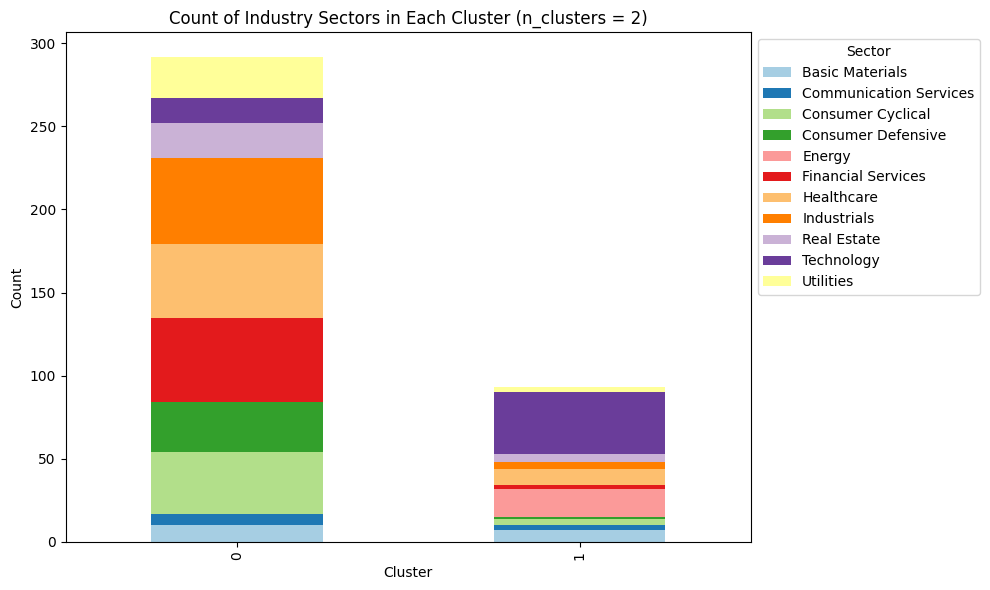

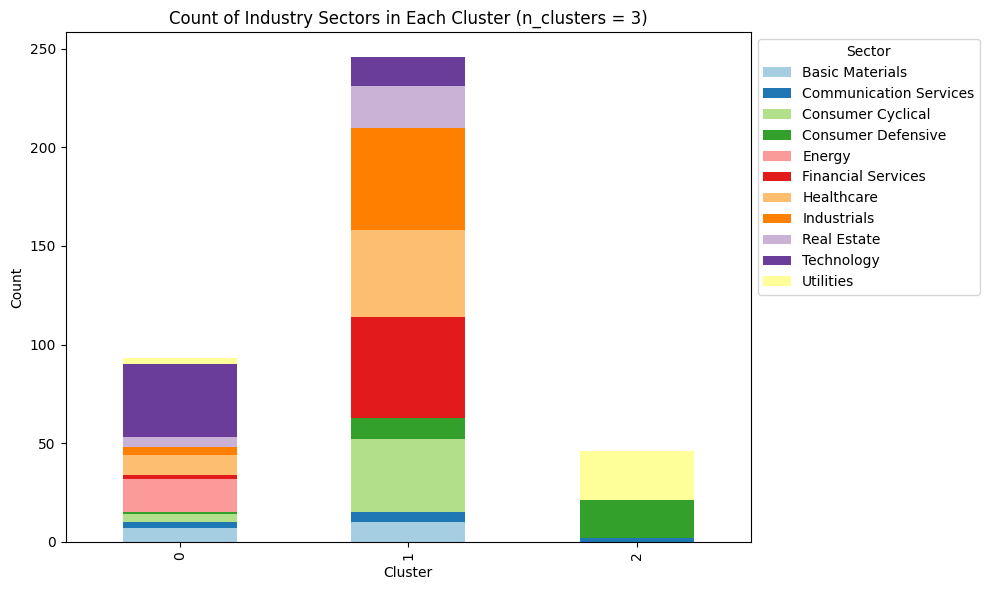

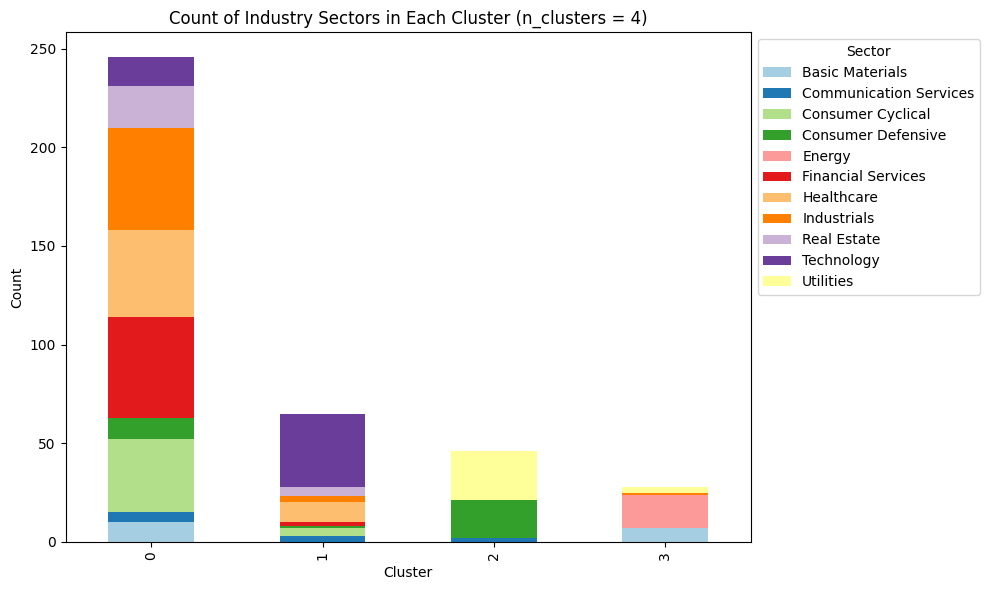

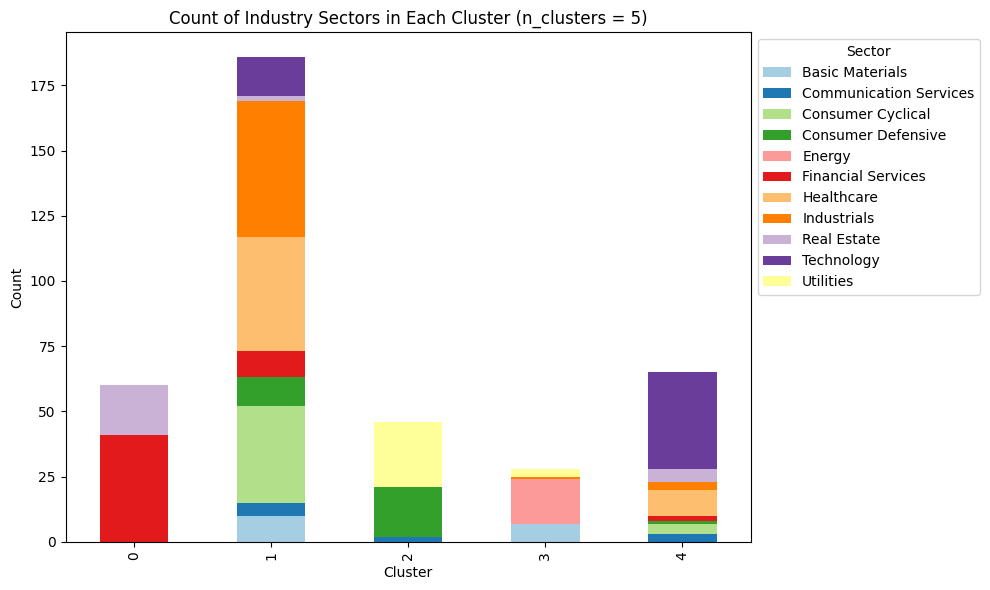

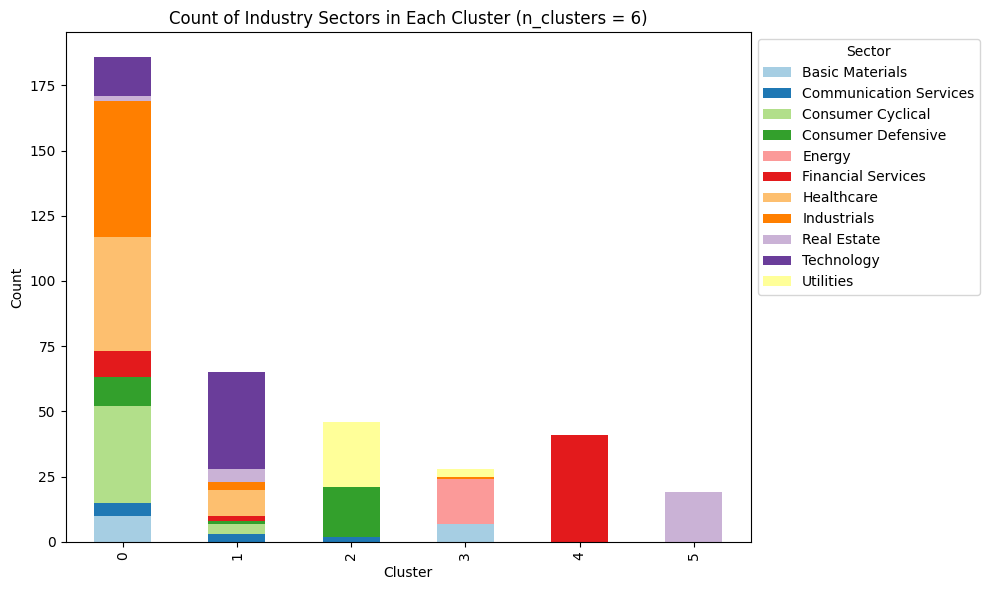

...

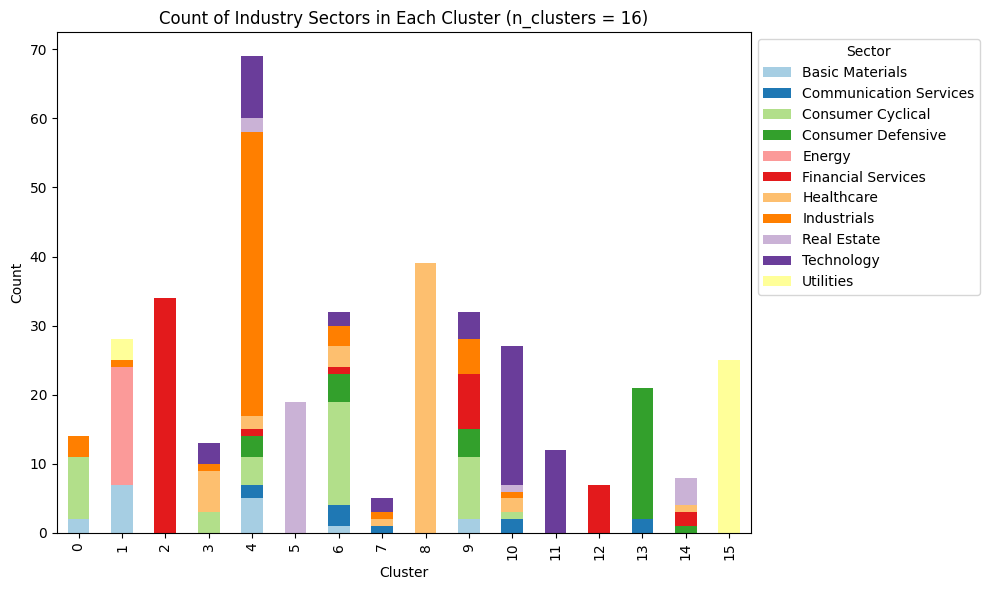

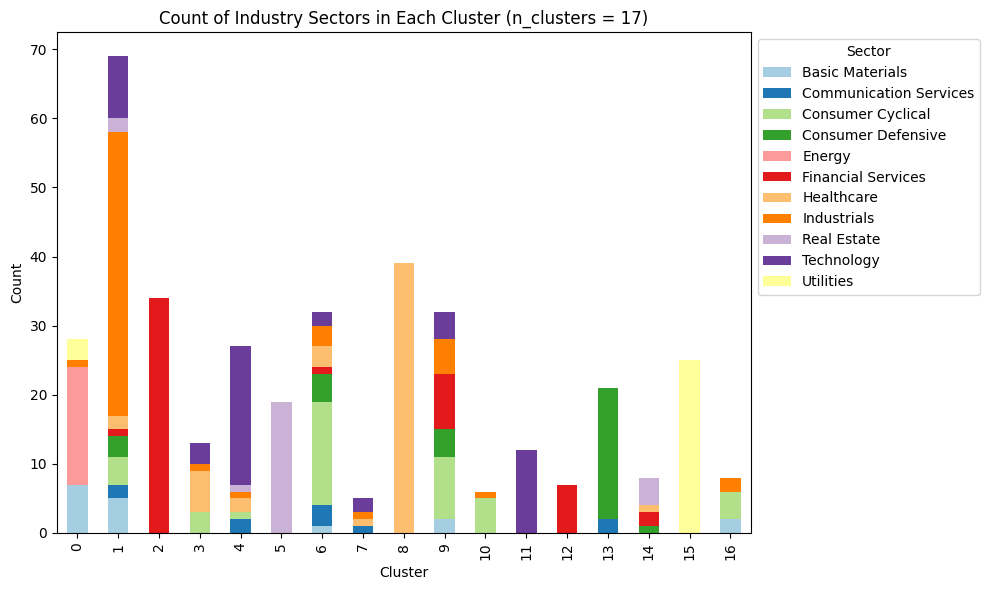

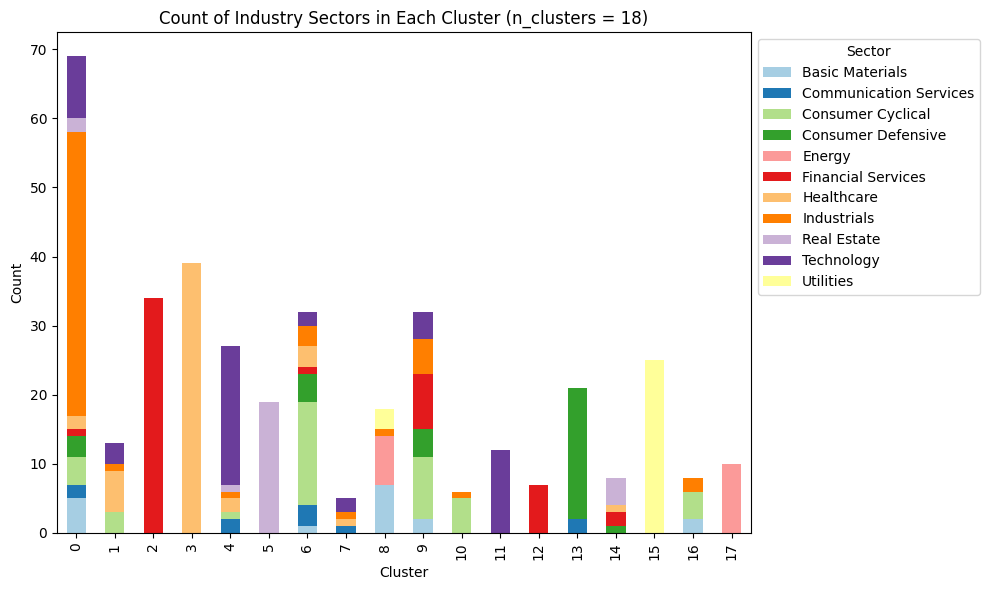

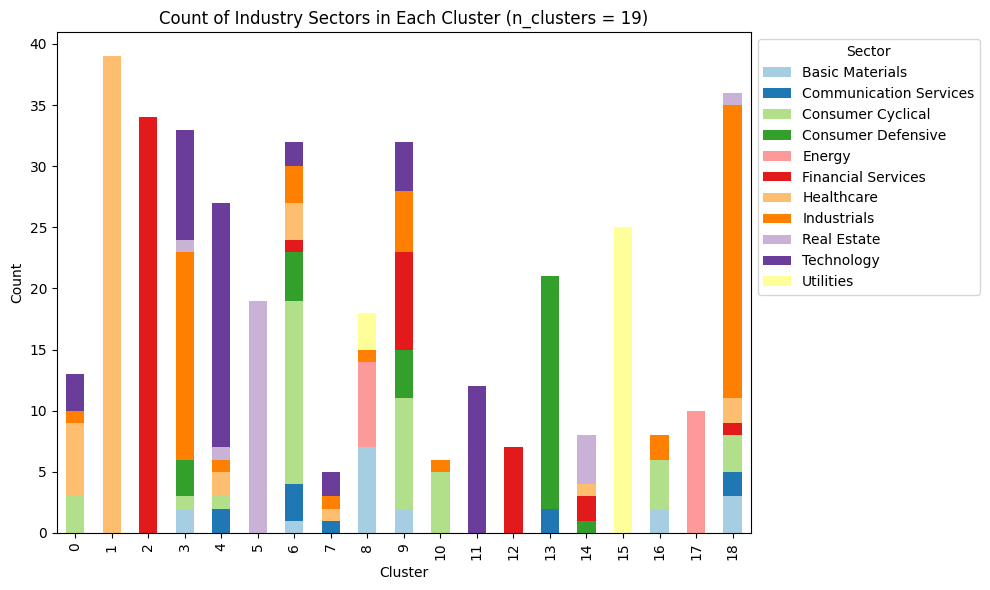

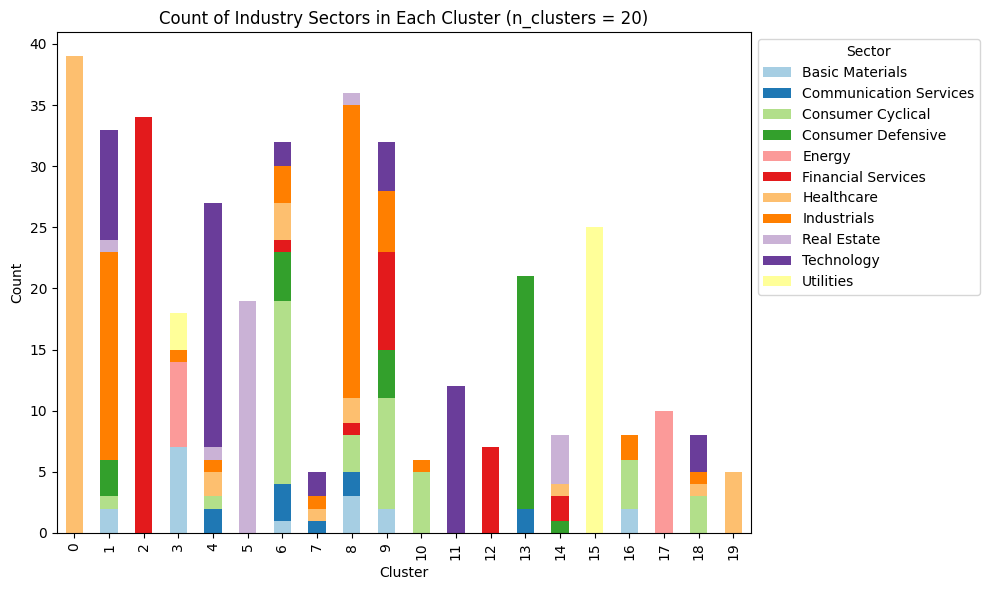

In [124]:
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))

# Stacked bar charts
for n_cluster in n_cluster_options:
    hierarchical_third_sector_count_df = hierarchical_third_sector_count_dfs[n_cluster]

    ax = hierarchical_third_sector_count_df.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
    plt.title(f'Count of Industry Sectors in Each Cluster (n_clusters = {n_cluster})')
    plt.xlabel('Cluster')
    plt.ylabel('Count')
    plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

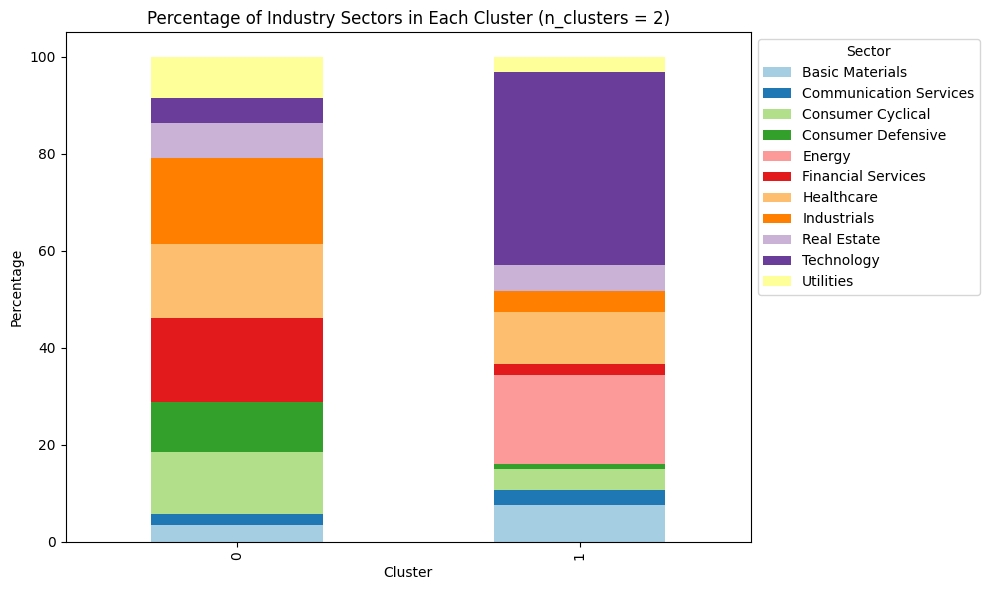

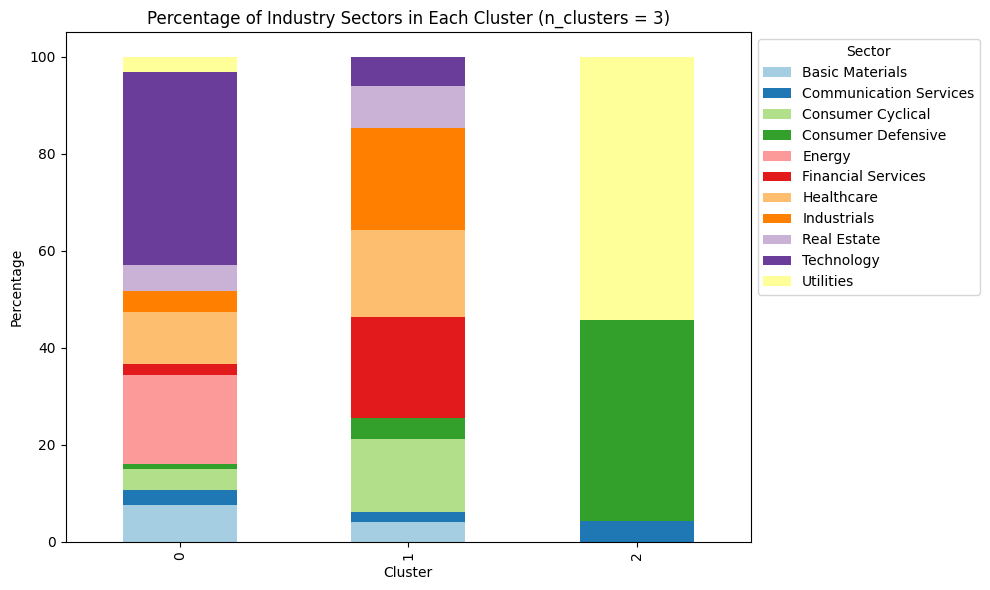

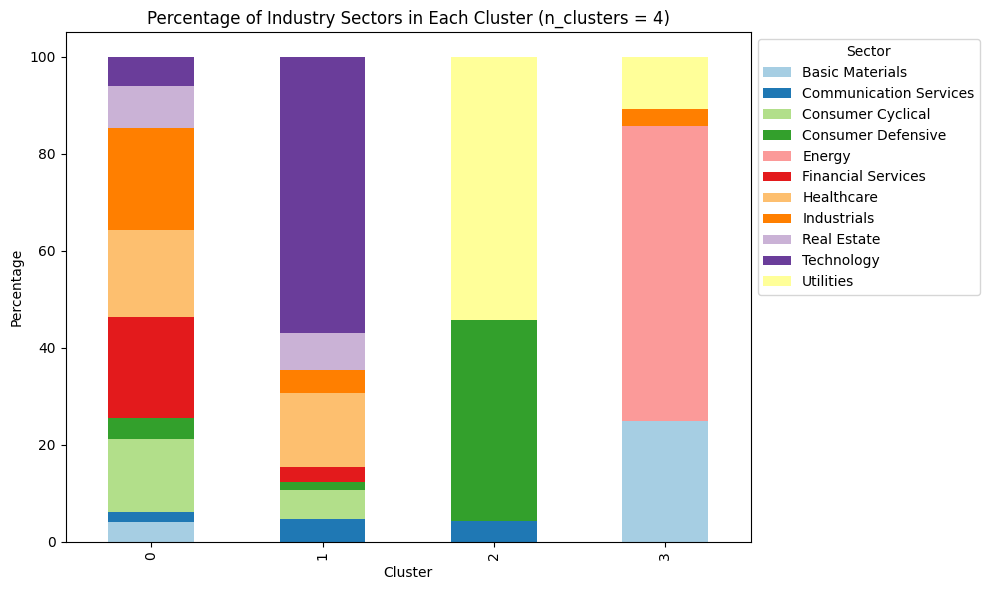

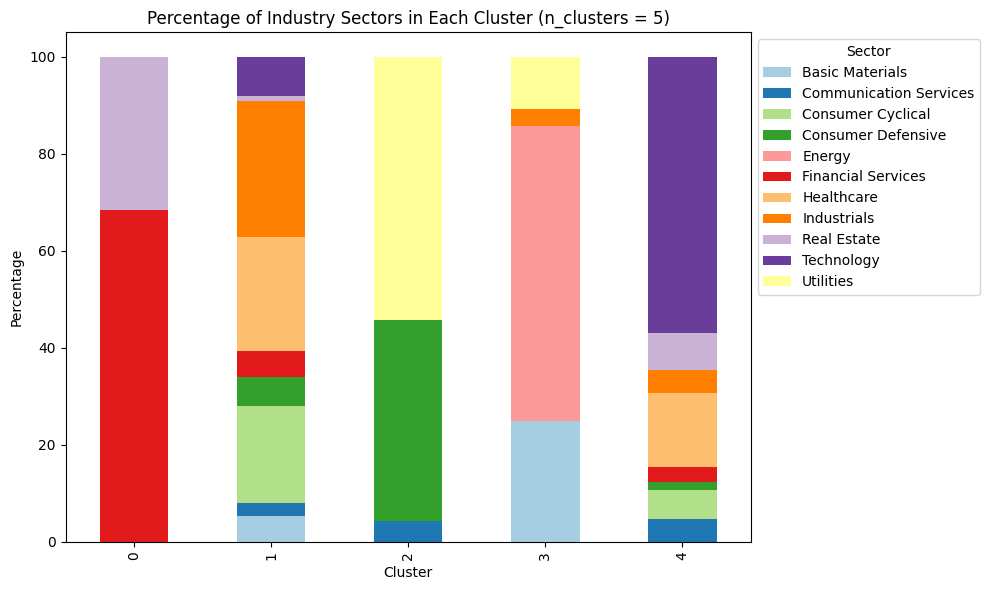

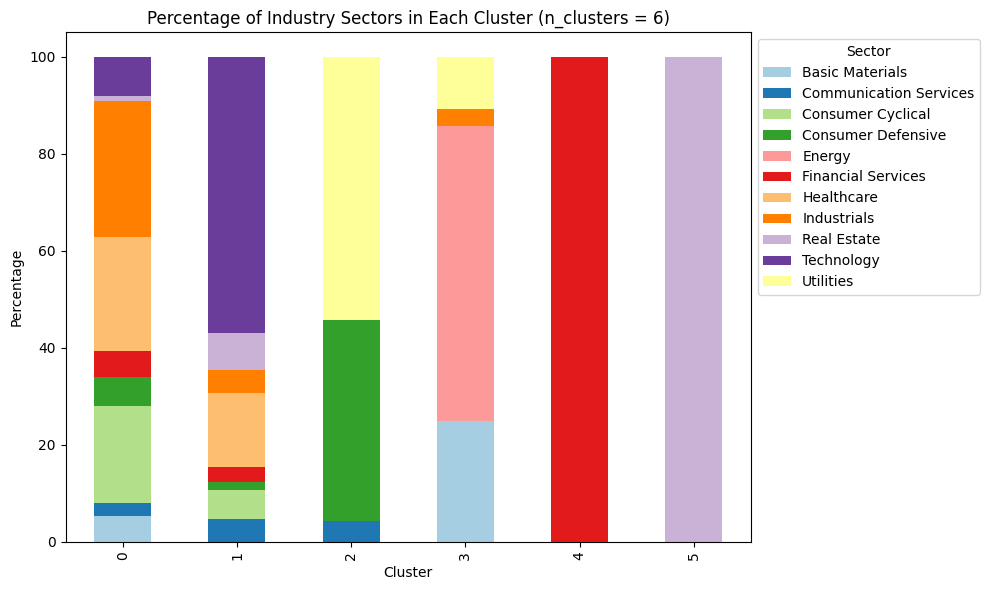

...

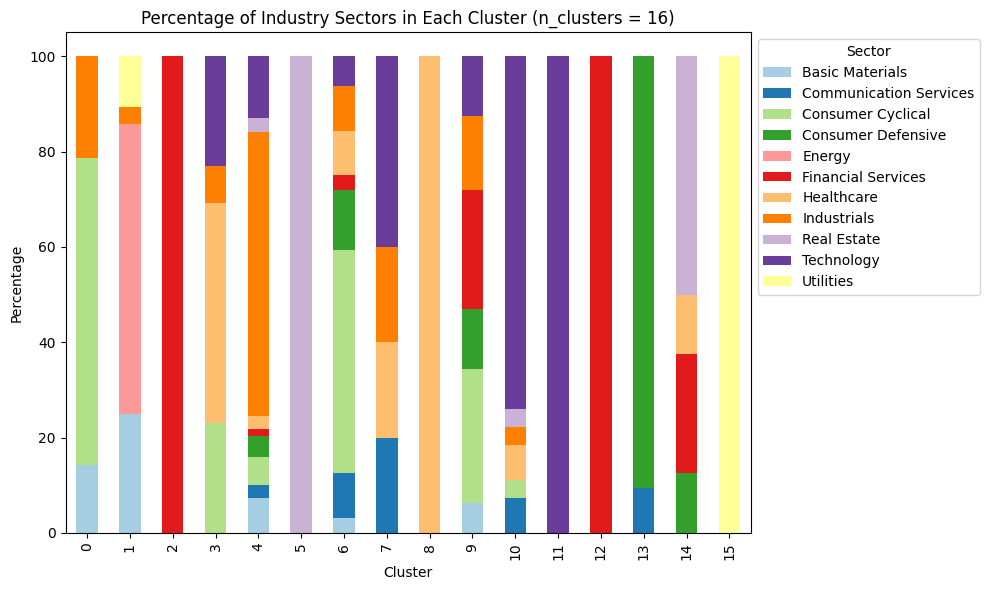

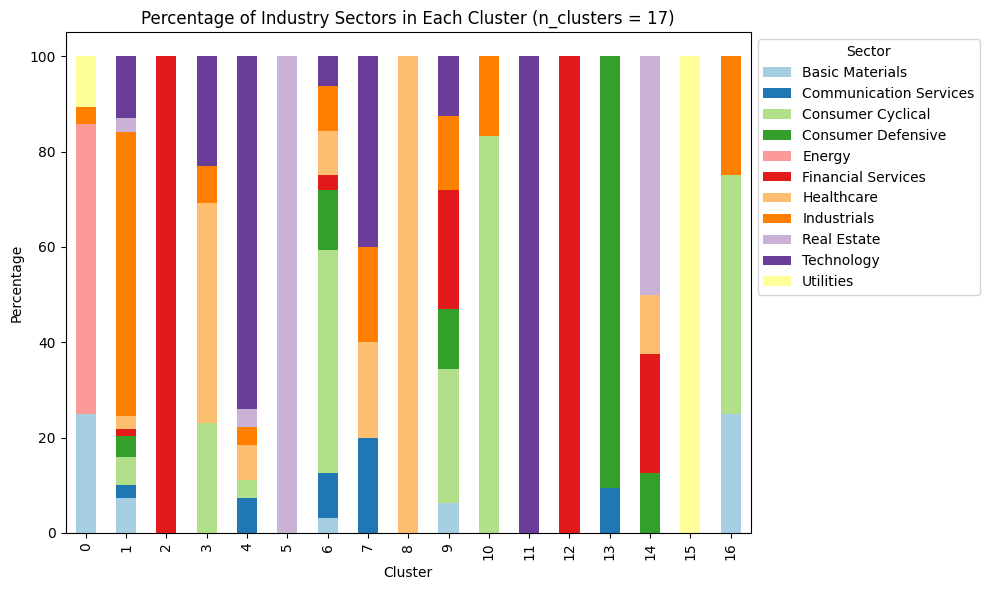

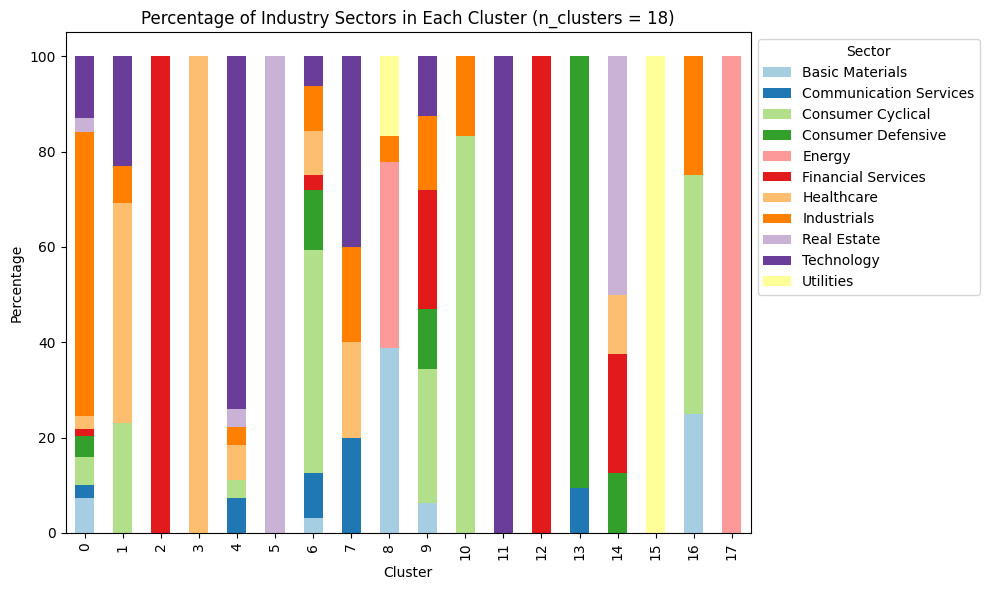

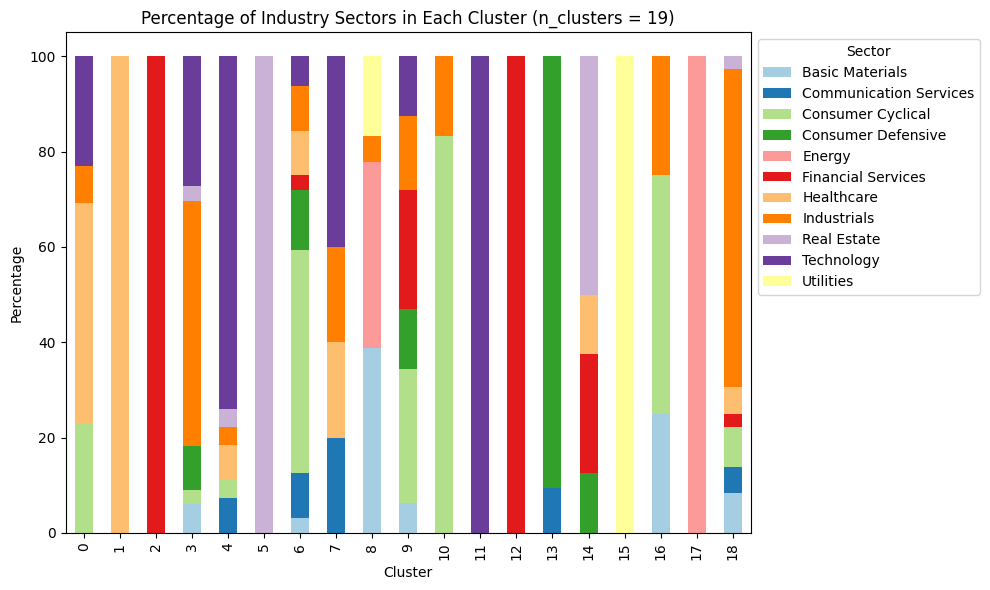

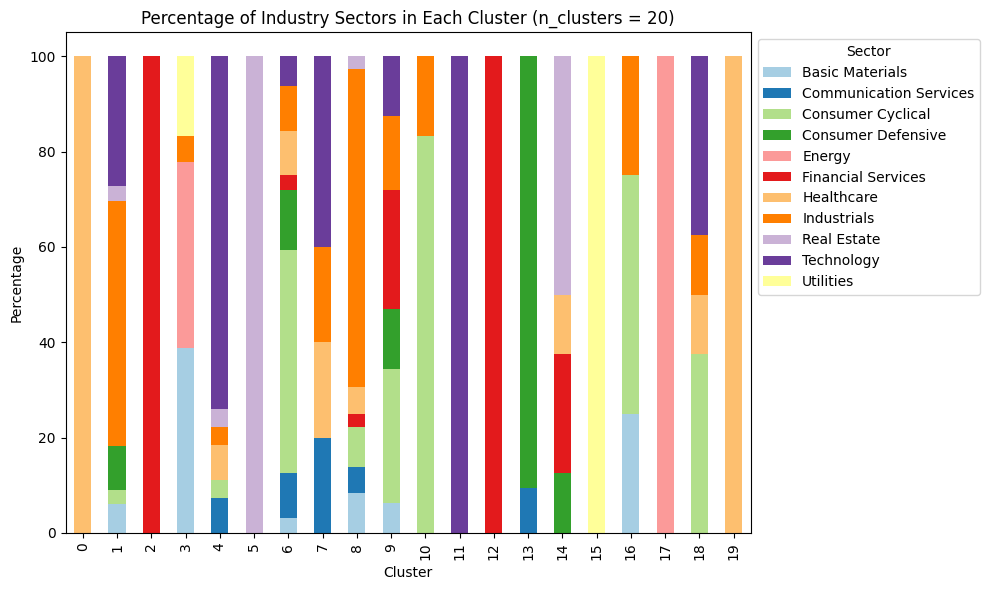

In [125]:
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))

# Stacked bar charts
for n_cluster in n_cluster_options:
    hierarchical_third_sector_percentage_df = hierarchical_third_sector_percentage_dfs[n_cluster]

    ax = hierarchical_third_sector_percentage_df.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
    plt.title(f'Percentage of Industry Sectors in Each Cluster (n_clusters = {n_cluster})')
    plt.xlabel('Cluster')
    plt.ylabel('Percentage')
    plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

n_clusters and the number of clusters with 1 sector being the majority (>90%) of the cluster

2: 0 \
3: 0 \
4: 0 \
5: 0 \
6: 2 \
7: 2 \
8: 3 \
9: 4 \
10: 4 \
11: 4 \
**12: 5** \
**13: 6** \
14: 6 \
15: 6 \
16: 6 \
17: 6 \
**18: 7** \
19: 7 \
**20: 8** \

For reference: \
Top 5 n_clusters with the highest silhouette scores: \
1. 17
2. 16
3. 18
4. 14
5. 15

#### Old code

In [126]:
hierarchical_third_sector_counts = pd.DataFrame({'Cluster': best_hierarchical_third_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
hierarchical_third_sector_percentages = hierarchical_third_sector_counts.div(hierarchical_third_sector_counts.sum(axis=1), axis=0) * 100

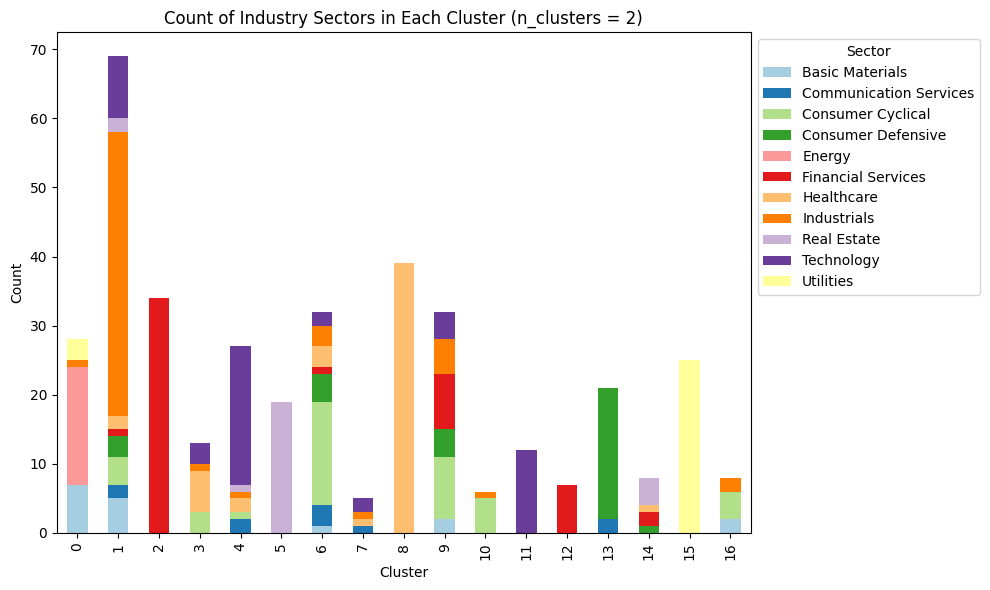

In [127]:
# Stacked bar chart
colors = sns.color_palette("Paired", len(gics_df['GICS Sector'].unique()))
ax = hierarchical_third_sector_counts.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Count of Industry Sectors in Each Cluster (n_clusters = 2)')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

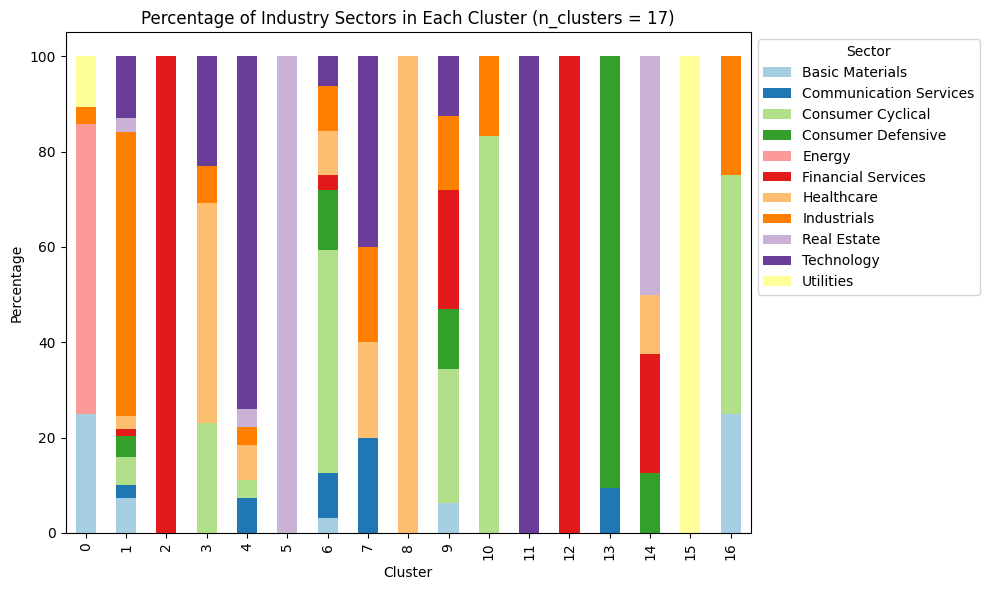

In [128]:
# Stacked bar chart
ax = hierarchical_third_sector_percentages.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Percentage of Industry Sectors in Each Cluster (n_clusters = 17)')
plt.xlabel('Cluster')
plt.ylabel('Percentage')
plt.legend(title='Sector', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

###**9.2.3 Count and percentage of cluster in each industry sector**

In [ ]:
# Similar as before, but switch 0 and 1 in "axis="
hierarchical_third_cluster_percentages = hierarchical_third_sector_counts.div(hierarchical_third_sector_counts.sum(axis=0), axis=1) * 100

In [ ]:
# Stacked bar charts
ax = hierarchical_third_sector_counts.transpose().plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Count of Cluster in Each Industry Sector (n_clusters = 17)')
plt.xlabel('Industry Sector')
plt.ylabel('Count')
plt.legend(title='Cluster', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [ ]:
# Stacked bar charts
ax = hierarchical_third_cluster_percentages.transpose().plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)
plt.title(f'Percentage of Cluster in Each Industry Sector (n_clusters = 17)')
plt.xlabel('Industry Sector')
plt.ylabel('Percentage')
plt.legend(title='Cluster', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

###**9.2.4 Track Amazon**

In [ ]:
n_cluster = 2
pca = PCA(n_components=2)
pca_corr = PCA(n_components=2)
scaler = StandardScaler()

# Iterate over each period data
for index, period_data in enumerate(periods):
    # Use only the columns corresponding to this period
    # Get the correlation matrix specifically for this period
    period_correlation_matrix = period_data.corr()
    correlation_matrix_reduced2 = pca.fit_transform(period_correlation_matrix)
    correlation_matrix_reduced2 = pd.DataFrame(correlation_matrix_reduced2)
    correlation_matrix_reduced2.rename(columns={0: "Corr_PCA_1", 1: "Corr_PCA_2"}, inplace=True)
    correlation_matrix_reduced2.index = period_correlation_matrix.index   # The underlying order of the rows remains after PCA

    combined_matrix = pd.concat([feature_matrix[period_columns[0]], correlation_matrix_reduced2], axis=1)

    scaled_features_1 = scaler.fit_transform(combined_matrix)
    pca_components = pca.fit_transform(scaled_features_1)

    # Use the best hyperparameters
    hierarchical = AgglomerativeClustering(n_clusters=n_cluster, linkage='ward', metric='euclidean')
    hierarchical.fit(scaled_features_1)
    hierarchical_labels = hierarchical.labels_

    plt.figure(figsize=(8, 6))

    # Create a colormap from the hierarchical labels
    unique_labels_length = len(np.unique(hierarchical_labels))
    cmap = ListedColormap(plt.cm.viridis(np.linspace(0, 1, unique_labels_length)))
    colors = cmap(hierarchical_labels)

    plt.scatter(pca_components[:, 0], pca_components[:, 1], c=colors, cmap='viridis', alpha=0.2)

    # Highlight 'AMZN'
    amzn_index = correlation_matrix.index.get_loc('AMZN')
    plt.scatter(pca_components[amzn_index, 0], pca_components[amzn_index, 1], color=colors[amzn_index], marker='o', s=50, edgecolors='black', alpha=1.0)
    plt.annotate('AMZN', xy=(pca_components[amzn_index, 0], pca_components[amzn_index, 1]), xytext=(pca_components[amzn_index, 0] + 0.1, pca_components[amzn_index, 1] + 0.1), fontsize=12, color='black')

    plt.title(f'PCA Scatterplot for {period_names[index]}')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    amazons_cluster = hierarchical_labels[amzn_index]

    print("********** Period: ", period_names[index], "**********")
    sector_counts_amzn = pd.DataFrame({'Cluster': hierarchical_labels, 'Industry Sector': gics_df['GICS Sector']}).groupby(['Cluster', 'Industry Sector']).size().unstack(fill_value=0)
    sector_percentages_amzn = sector_counts_amzn.div(sector_counts_amzn.sum(axis=1), axis=0) * 100
    print("\n1. Count and percentage of industry sector in the cluster that Amazon is in: ")
    #count
    print(sector_counts_amzn.loc[amazons_cluster].sort_values(ascending=False), "\n")
    #order by percentage in descending order
    print(sector_percentages_amzn.loc[amazons_cluster].sort_values(ascending=False))

    print("\n2. Count and percentage of industry sector in all clusters: \n")
    #count
    print(sector_counts_amzn)
    print(sector_percentages_amzn)
    print("\n")

    # cluster_percentages_amzn = sector_counts_amzn.div(sector_counts_amzn.sum(axis=0), axis=1) * 100
    # print("\n3. Count and percentage of cluster in each sector: \n")
    # #count
    # print(sector_counts_amzn)
    # print(cluster_percentages_amzn)
    # print("\n")

#**NEW Comments**

Pick K-means over hierarchical clustering because:
*   K-means was able to achieve a higher silhouette score
*   For most of the n_clusters, K-means and hierarchical clustering models produced clusters that were pretty similar in composition (e.g. for n_clusters = 12, both K-means and hierarchical clustering models have 5 clusters where each of them is mainly made up of companies from a specific sector. These sectors are Financial Services, Real Estate, Utilities, Healthcare, and Technology).

Pick n_clusters = 14 for K-means clustering because:
*   Based on the output in section 9.1.1, n_clusters of 14 has the highest silhouette score.
*   Based on the output in section 9.1.2, by training the model on different periods (pre-financial crisis, financial crisis, post-financial crisis etc.) as well as four 5-year periods from 2009-01-01 to 2023-12-31, K-means with n_clusters set to 14 produced clusters with a consistent composition across periods.





